# 🎯 Football Match Analysis Project

This project provides advanced video analysis capabilities for football matches using Roboflow's pre-trained YOLO model for football-specific object detection. This is an open-source project created for educational and research purposes.

🤖 **AI Model**
- Pre-trained YOLO model from Roboflow
- Specialized in football object detection
- Identifies players, ball, and referees

🏃‍♂️ **Player Detection & Tracking**
- Team classification based on jersey colors
- Player movement tracking
- Goalkeeper identification

⚽ **Ball Analysis**
- Ball possession tracking
- Ball location mapping
- Attack zone distribution

📊 **Team Statistics**
- Possession percentages
- Attack patterns analysis
- RCS (Opponent Penalty Area) encounters

🎥 **Video Processing**
- Frame-by-frame analysis
- Field mapping and coordinate transformation
- Real-time visualization options

🔍 **Key Features**
- Automated team color detection
- Advanced coordinate mapping
- Customizable analysis parameters

Built with Python using OpenCV, Roboflow's YOLO model, and custom implementations for football-specific analysis. Perfect for coaches, analysts, and football enthusiasts looking to gain deeper insights into match dynamics.

Model: [football-players-detection-3zvbc/11](https://universe.roboflow.com/roboflow-universe-projects/football-players-detection-3zvbc/model/11)

*Note: This project is intended for non-commercial use only.*

# Installation Guide

Before running this notebook, you need to install the required dependencies. Follow these steps:

1. **Clone the Repository**
   ```bash
   git clone https://github.com/yourusername/football-analysis-project.git
   cd football-analysis-project
   ```

2. **Create a Virtual Environment (Recommended)**
   ```bash
   # For Windows
   python -m venv venv
   venv\Scripts\activate

   # For macOS/Linux
   python -m venv venv
   source venv/bin/activate
   ```

3. **Install Dependencies**
   ```bash
   pip install -r requirements.txt
   ```

4. **Verify Installation**
   ```python
   # Run this in your notebook to verify imports
   import roboflow
   import supervision
   import cv2
   print("All dependencies installed successfully!")
   ```

Note: If you encounter any issues with GPU support, make sure you have the appropriate CUDA toolkit installed for your system.

For any installation problems, please check the [Issues](https://github.com/yourusername/football-analysis-project/issues) section of the repository.

# API Key Configuration

In this section, we set up the necessary API keys for our project:

1. **Roboflow API Key**: Required to access the pre-trained YOLO model for football player detection
2. **Hugging Face Token**: Used for accessing transformer models for team classification

These keys are currently defined directly in the code for development purposes. In a production environment, they should be moved to environment variables or a secure configuration file.

In [64]:
import os

# API keys direct definition
os.environ['ROBOFLOW_API_KEY'] = 'YOUR ROBOFLOW API KEY'
os.environ['HF_TOKEN'] = 'YOUR HUGGING FACE TOKEN'

# For usage
ROBOFLOW_API_KEY = os.environ.get('ROBOFLOW_API_KEY')
HF_TOKEN = os.environ.get('HF_TOKEN')

# Video File Downloads

This section downloads sample football match video clips from Google Drive for analysis. These clips are pre-selected to demonstrate various aspects of the football analysis system:

- Player detection and tracking
- Team classification
- Ball movement analysis
- Field mapping
- Attack zone analysis

The files are downloaded using gdown, a command-line tool for downloading large files from Google Drive. Each video represents different match scenarios and camera angles to test the robustness of our analysis system.

Note: These are sample videos for testing purposes. Users can replace them with their own football match videos for analysis.

In [5]:
!gdown -O "0bfacc_0.mp4" "https://drive.google.com/uc?id=12TqauVZ9tLAv8kWxTTBFWtgt2hNQ4_ZF"
!gdown -O "2e57b9_0.mp4" "https://drive.google.com/uc?id=19PGw55V8aA6GZu5-Aac5_9mCy3fNxmEf"
!gdown -O "08fd33_0.mp4" "https://drive.google.com/uc?id=1OG8K6wqUw9t7lp9ms1M48DxRhwTYciK-"
!gdown -O "573e61_0.mp4" "https://drive.google.com/uc?id=1yYPKuXbHsCxqjA9G-S6aeR2Kcnos8RPU"
!gdown -O "121364_0.mp4" "https://drive.google.com/uc?id=1vVwjW1dE1drIdd4ZSILfbCGPD4weoNiu"

# Ball, Player, Goalkeeper and Referee Detection

In this section, we initialize our pre-trained YOLO model from Roboflow for detecting key elements in football matches:

- Ball detection with high precision
- Player detection and classification
- Goalkeeper identification
- Referee tracking

The model is configured with a confidence threshold of 0.3 to balance between detection accuracy and false positives. We use the model ID "football-players-detection-3zvbc/11" which is specifically trained for football match analysis.

Note: The model may show warnings about execution providers (CUDA/CPU) depending on your system configuration. These warnings don't affect the model's functionality.

In [65]:
from inference import get_model

# Use the API key that you defined before
PLAYER_DETECTION_MODEL_ID = "football-players-detection-3zvbc/11"
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning:

Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider'

/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning:

Specified provider 'OpenVINOExecutionProvider' is not in available provider names.Available providers: 'CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider'

2025-01-28 19:27:22.323159 [W:onnxruntime:, helper.cc:82 IsInputSupported] CoreML does not support input dim > 16384. Input:/model.22/Reshape_output_0, shape: {1,68,25600}
2025-01-28 19:27:22.323350 [W:onnxruntime:, helper.cc:82 IsInputSupported] CoreML does not support input dim > 16384. Input:/model.22/Split_outp

# Initial Frame Analysis

In this section, we perform our first frame analysis from the video:

1. Load the video using supervision's frame generator
2. Extract a single frame for initial testing
3. Plot the raw frame before any detections

This step helps us verify:
- Video loading is working correctly
- Frame extraction is successful
- Image dimensions and quality are suitable for analysis

The frame generator is configured to read from our source video path, and we use supervision's plot_image function for visualization.

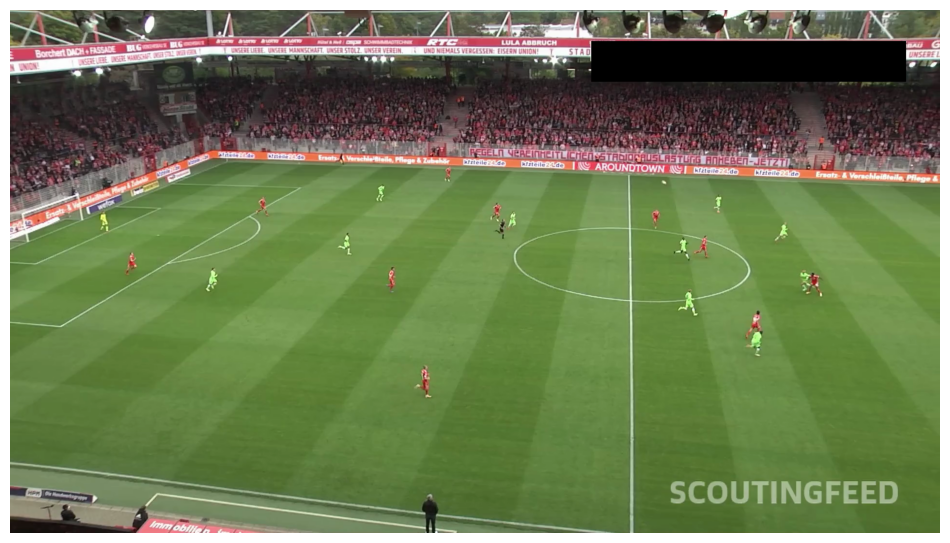

In [66]:
import supervision as sv

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)

# Object Detection and Annotation

This section implements the core detection and visualization functionality:

1. **Box Annotation Setup**
   - Initializes box annotator with custom colors for different classes
   - Uses distinct colors (Orange, Blue, Pink, Gold) for different object types
   - Sets up label annotator with matching color scheme

2. **Frame Processing**
   - Extracts a single frame from the video source
   - Applies the pre-trained model for object detection
   - Sets confidence threshold at 0.3 for reliable detections

3. **Detection Visualization**
   - Creates bounding boxes around detected objects
   - Adds labels showing class name and confidence score
   - Uses contrasting colors for better visibility
   - Maintains original frame quality while adding annotations

4. **Output Generation**
   - Combines all annotations into a single frame
   - Displays the final annotated image with detections

This visualization helps in verifying the accuracy of our object detection system and provides a clear view of all detected elements in the frame.

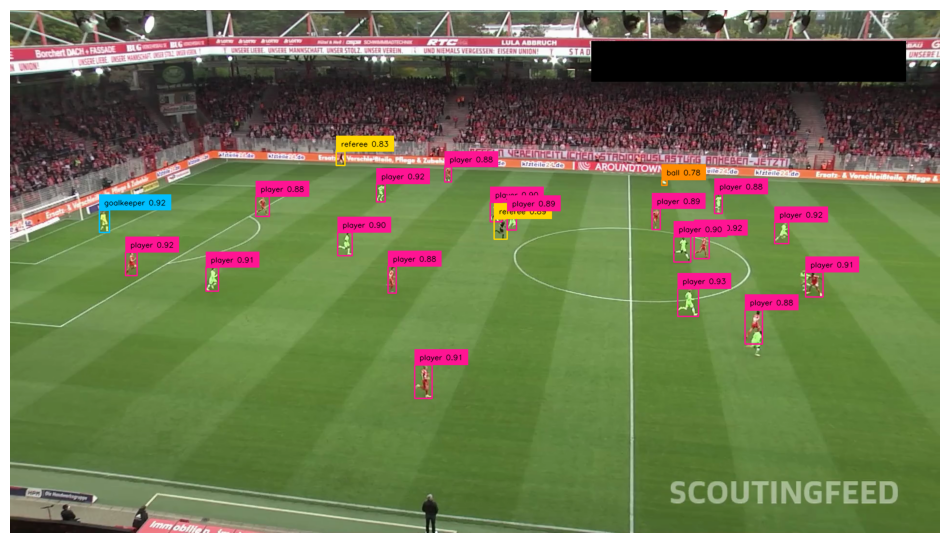

In [67]:
import supervision as sv

# Define the path to source video file
SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"

# Initialize box annotator with custom colors for different classes
box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),  # Orange, Blue, Pink, Gold
    thickness=2
)

# Initialize label annotator with matching colors
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')  # Black text for better visibility
)

# Generate frame iterator and get the first frame
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# Run object detection on the frame
result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

# Create labels with class names and confidence scores
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]

# Create annotated frame with detections
annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels)

# Display the annotated frame
sv.plot_image(annotated_frame)

## Video Game Style Visualization

This section implements a unique visualization approach inspired by video game interfaces:

1. **Player Visualization**
   - Uses ellipse shapes to represent players
   - Different colors for different teams (Blue, Pink)
   - Gold color for referees
   - Thickness parameter for clear visibility

2. **Ball Visualization**
   - Represents the ball with a triangle shape
   - Gold color for easy tracking
   - Custom base and height for optimal visibility
   - Added padding for better visual clarity

3. **Detection Processing**
   - Separates ball detections from player detections
   - Applies Non-Maximum Suppression (NMS) to avoid overlapping detections
   - Adjusts class IDs for proper team classification

4. **Frame Annotation**
   - Creates a copy of the original frame
   - Applies ellipse annotations for players
   - Adds triangle annotation for the ball
   - Maintains visual clarity with distinct shapes and colors

This visualization style provides an intuitive and clear representation of the game elements, similar to top-down tactical views in football video games.

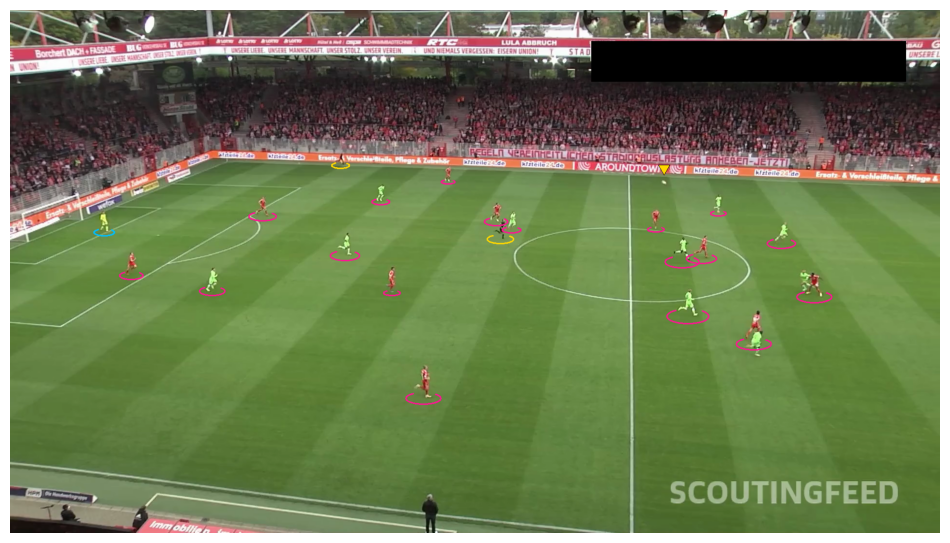

In [68]:
import supervision as sv

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"
BALL_ID = 0

# Initialize ellipse annotator for players with different team colors
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),  # Blue, Pink, Gold
    thickness=2
)

# Initialize triangle annotator for ball visualization
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),  # Gold color for ball
    base=25,
    height=21,
    outline_thickness=1
)

# Generate frame iterator and get the first frame
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# Run object detection on the frame
result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

# Separate ball detections and add padding
ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

# Process all other detections (players, referees)
all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1

# Create annotated frame with detections
annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

# Display the final annotated frame
sv.plot_image(annotated_frame)

## Player Tracking Implementation

This section enhances our visualization with player tracking capabilities:

1. **Visual Elements Setup**
   - Ellipse shapes for players with team-specific colors (Blue, Pink, Gold)
   - Unique ID labels for each tracked player
   - Triangle shape for ball representation
   - Bottom-centered text positioning for clear ID visibility

2. **Object Tracking System**
   - Implements ByteTrack algorithm for consistent player tracking
   - Assigns unique tracker IDs to each detected player
   - Maintains player identity across frames
   - Handles occlusions and player overlaps

3. **Detection Processing**
   - Separates ball and player detections
   - Applies Non-Maximum Suppression for cleaner detections
   - Updates tracker with new detections
   - Maintains consistent player IDs

4. **Visualization Enhancement**
   - Combines player tracking with visual elements
   - Displays tracker IDs below each player
   - Uses contrasting colors for better readability
   - Maintains ball visualization separate from player tracking

This implementation allows us to track individual players throughout the game, making it easier to analyze player movements and team formations.

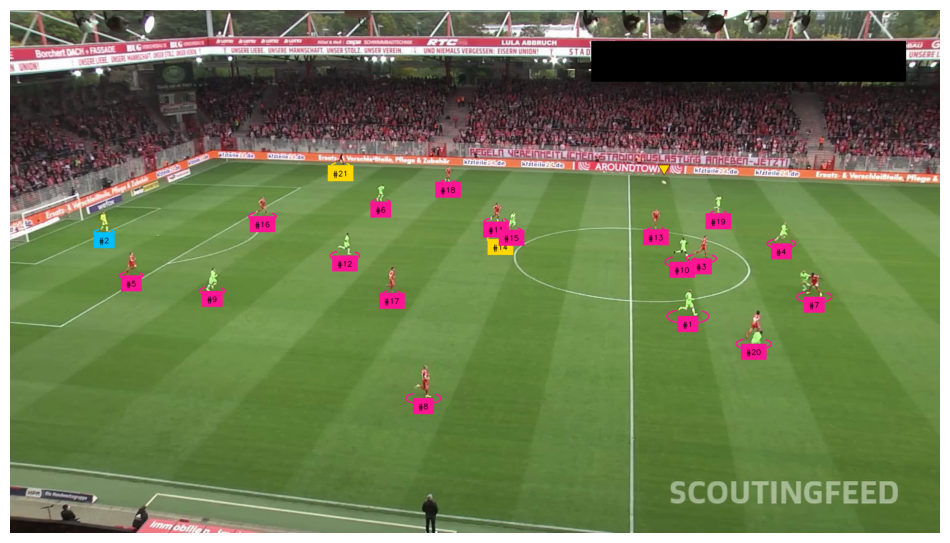

In [69]:
import supervision as sv

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"
BALL_ID = 0

# Initialize ellipse annotator with custom colors for different teams
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),  # Blue, Pink, Gold colors
    thickness=2
)

# Initialize label annotator with matching colors for player IDs
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),  # Black text for better visibility
    text_position=sv.Position.BOTTOM_CENTER
)

# Initialize triangle annotator for ball visualization
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),  # Gold color for ball
    base=25,
    height=21,
    outline_thickness=1
)

# Initialize ByteTrack for object tracking
tracker = sv.ByteTrack()
tracker.reset()

# Generate frame iterator and get the first frame
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# Run object detection on the frame
result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

# Separate ball detections and add padding
ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

# Process all other detections (players, referees) with NMS
all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1
all_detections = tracker.update_with_detections(detections=all_detections)

# Create labels with tracker IDs
labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

# Create annotated frame with detections and labels
annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

# Display the final annotated frame
sv.plot_image(annotated_frame)

## split players into teams

![football AI diagram](https://media.roboflow.com/notebooks/examples/football-ai-team-clustering.png)

**Note:** Before training our player clustering model, we need to gather training data. To do this, we'll sample one frame per second, detect players within those frames, and then crop them out.

## Player Image Collection for Team Classification

**Note:** Before training our player clustering model, we need to gather training data. To do this, we'll sample one frame per second, detect players within those frames, and then crop them out.

The process involves:

1. **Frame Sampling**
   - Uses a stride of 30 to process every 30th frame
   - Helps reduce computational load while maintaining data quality
   - Provides sufficient samples for team classification

2. **Player Detection**
   - Applies our pre-trained model with 0.3 confidence threshold
   - Uses Non-Maximum Suppression to avoid duplicate detections
   - Filters specifically for player class detections

3. **Image Cropping**
   - Extracts individual player images from each frame
   - Maintains original image quality for better classification
   - Stores crops in a list for later processing

This data collection step is crucial for training our team classification model, as it provides the necessary player images with different jersey colors and poses.

In [91]:
from tqdm import tqdm

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"
PLAYER_ID = 2
STRIDE = 30  # Process every 30th frame

# Initialize video frame generator with specified stride
frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

# Initialize empty list to store player crops
crops = []

# Iterate through frames and collect player crops
for frame in tqdm(frame_generator, desc='collecting crops'):
    # Run object detection on the frame
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    
    # Apply NMS and filter for player detections
    detections = detections.with_nms(threshold=0.5, class_agnostic=True)
    detections = detections[detections.class_id == PLAYER_ID]
    
    # Crop player images from frame
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

collecting crops: 25it [00:06,  3.88it/s]


**Note:** Here's a sample (100 elements) of the crops we've gathered.

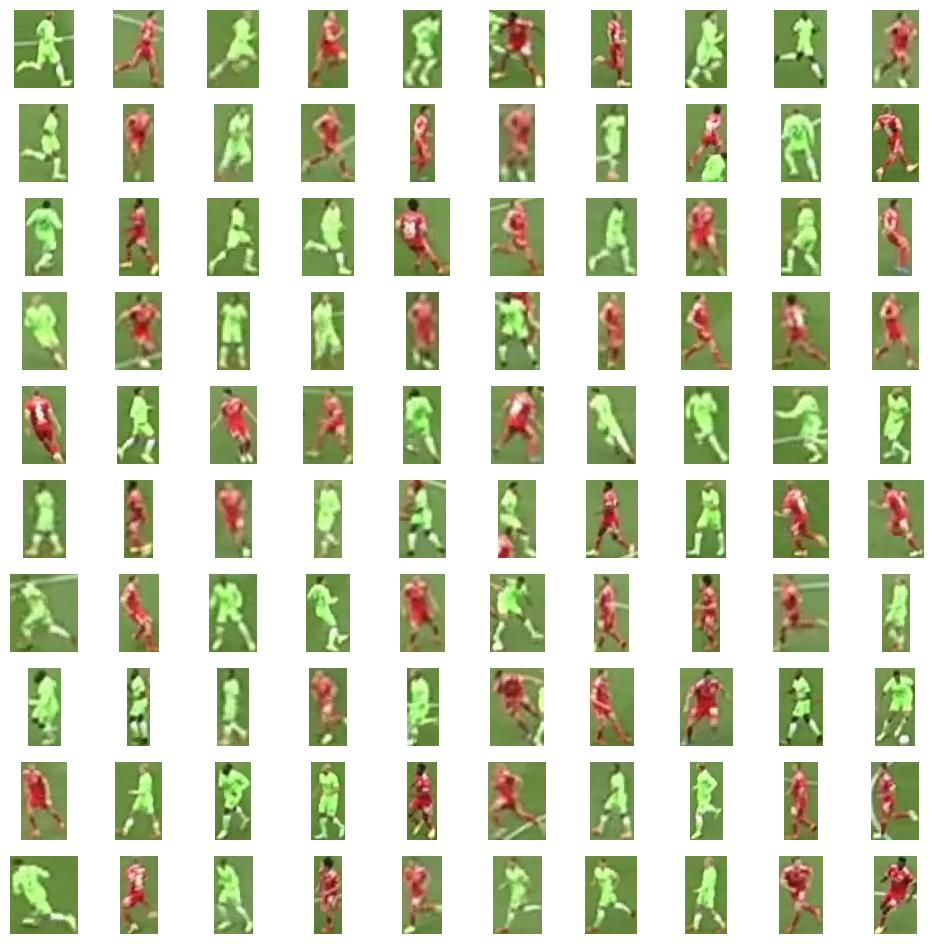

In [92]:
sv.plot_images_grid(crops[:100], grid_size=(10, 10))

## Vision Model Initialization

This section sets up our vision model for processing player images:

1. **Model Configuration**
   - Uses SiglipVision model from Google
   - Pre-trained on patch size 16x224 resolution
   - Optimized for vision-based feature extraction

2. **Hardware Optimization**
   - Automatically detects and utilizes GPU if available
   - Falls back to CPU processing if no GPU is present
   - Ensures optimal performance across different systems

3. **Model Components**
   - Loads pre-trained SiglipVision model
   - Initializes AutoProcessor for input preprocessing
   - Configures model for inference mode

This setup provides the foundation for extracting meaningful features from player images, which will be used for team classification and player tracking.

In [93]:
import torch
from transformers import AutoProcessor, SiglipVisionModel

# Define model path for SiglipVision
SIGLIP_MODEL_PATH = 'google/siglip-base-patch16-224'

# Set up device (GPU if available, otherwise CPU)
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Initialize the SiglipVision model and move to appropriate device
EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)

# Initialize the processor for preparing inputs
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

In [94]:
import numpy as np
from more_itertools import chunked

BATCH_SIZE = 32

crops = [sv.cv2_to_pillow(crop) for crop in crops]
batches = chunked(crops, BATCH_SIZE)
data = []
with torch.no_grad():
    for batch in tqdm(batches, desc='embedding extraction'):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors="pt").to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state, dim=1).cpu().numpy()
        data.append(embeddings)

data = np.concatenate(data)

embedding extraction: 15it [00:28,  1.92s/it]


**Note:** Using [UMAP](https://github.com/lmcinnes/umap), we project our embeddings from `(N, 768)` to `(N, 3)` and then perform a two-cluster division using [KMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).

# Image Processing and Embedding Extraction

This section handles the processing of player images and extraction of their embeddings for team classification:

1. **Data Validation**
   - Checks for valid image formats
   - Converts OpenCV images to PIL format
   - Filters out invalid or corrupted images
   - Reports diagnostic information about processed images

2. **Batch Processing**
   - Groups images into batches of 32 for efficient processing
   - Optimizes memory usage during embedding extraction
   - Handles empty or invalid batches gracefully

3. **Embedding Extraction**
   - Uses torch's no_grad context for efficient inference
   - Processes images through the SiglipVision model
   - Calculates mean embeddings for each image
   - Converts tensor outputs to numpy arrays

4. **Error Handling**
   - Implements robust error checking
   - Provides detailed error messages
   - Handles edge cases (empty data, invalid formats)
   - Ensures graceful failure when issues occur

This preprocessing step is crucial for preparing the image data for team classification, ensuring that only valid data is processed and meaningful embeddings are extracted.

In [95]:
import umap
from sklearn.cluster import KMeans

REDUCER = umap.UMAP(n_components=3)
CLUSTERING_MODEL = KMeans(n_clusters=2)

## Ball Tracking Implementation

This section implements ball tracking functionality:

1. **Setup**
   - Initializes deque for tracking history (max length: 5)
   - Sets stride to process every 30th frame
   - Configures video frame generator

2. **Frame Processing**
   - Detects ball position in each frame
   - Filters high-confidence keypoints
   - Applies perspective transformation
   - Stores transformed coordinates

3. **Transformation**
   - Calculates transformation matrices
   - Uses moving average for stability
   - Maps ball coordinates to pitch perspective

This tracking system provides smooth and accurate ball position data throughout the match.

In [96]:
projections = REDUCER.fit_transform(data)
clusters = CLUSTERING_MODEL.fit_predict(projections)

/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



**Note:** Here's an interactive visualization of our results. Click on a dot to display its associated crop.


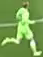
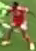
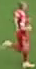
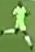
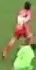
...
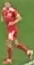
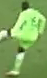
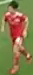
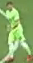
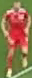

In [97]:
import plotly.graph_objects as go
import numpy as np
from typing import Dict, List
from IPython.display import display, HTML
from PIL import Image
import base64
from io import BytesIO


def pil_image_to_data_uri(image: Image.Image) -> str:
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{img_str}"


def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    images: List[Image.Image],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    image_data_uris = {f"image_{i}": pil_image_to_data_uri(image) for i, image in enumerate(images)}
    image_ids = np.array([f"image_{i}" for i in range(len(images))])

    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_ids[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>image ID: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    javascript_code = f"""
    <script>
        function displayImage(imageId) {{
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = {image_data_uris};
            imageElement.src = imageDataURIs[imageId];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';
        }}

        var chartElement = document.getElementById('scatter-plot-3d');

        chartElement.on('plotly_click', function(data) {{
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        }});
    </script>
    """

    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
        </body>
    </html>
    """

    display(HTML(html_template))

display_projections(clusters, projections, crops)

In [98]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

# if using apple silicone, use "cpu" instead of "cuda"
team_classifier = TeamClassifier(device="cpu")
team_classifier.fit(crops)

collecting crops: 25it [00:06,  3.89it/s]
Embedding extraction: 18it [00:33,  1.89s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



**Note:** Time to assign goalkeepers to teams. We'll use a simple heuristic: calculate the average position (centroid) of the players belonging to both teams and then assign the goalkeeper to the team whose average position is closer.

In [99]:
import numpy as np
import supervision as sv

def resolve_goalkeepers_team_id(
    players: sv.Detections,
    goalkeepers: sv.Detections
) -> np.ndarray:
    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    team_0_centroid = players_xy[players.class_id == 0].mean(axis=0)
    team_1_centroid = players_xy[players.class_id == 1].mean(axis=0)
    goalkeepers_team_id = []
    for goalkeeper_xy in goalkeepers_xy:
        dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
        dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
        goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)

    return np.array(goalkeepers_team_id)

# Let's visualize the results. We'll use:
# - Ellipses to mark players (blue for team 0, pink for team 1)
# - Triangles to mark referees (yellow)
# - Labels to show track IDs


Embedding extraction: 1it [00:01,  1.30s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



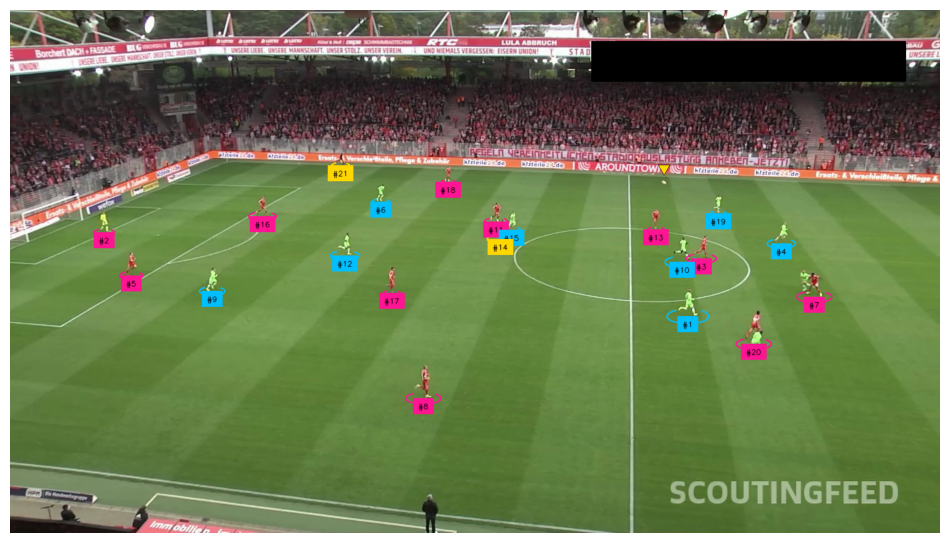

In [100]:
import supervision as sv

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

# Field Detection
In this section, we will detect the football field and its key points. We will use a pre-trained model to detect the field and its key points. The model will return the coordinates of the key points, which we will use to draw the field lines.


In [101]:
from inference import get_model
import os
from dotenv import load_dotenv

load_dotenv()
ROBOFLOW_API_KEY = os.getenv('ROBOFLOW_API_KEY')
FIELD_DETECTION_MODEL_ID = "football-field-detection-f07vi/14"
FIELD_DETECTION_MODEL = get_model(model_id=FIELD_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning:

Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider'

/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning:

Specified provider 'OpenVINOExecutionProvider' is not in available provider names.Available providers: 'CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider'

2025-01-28 19:55:12.137566 [W:onnxruntime:, coreml_execution_provider.cc:107 GetCapability] CoreMLExecutionProvider::GetCapability, number of partitions supported by CoreML: 11 number of nodes in the graph: 400 number of nodes supported by CoreML: 386


# ## Detect Field Keypoints
# Let's detect the field keypoints using our model. We will use the vertex annotator to visualize the keypoints on the frame.


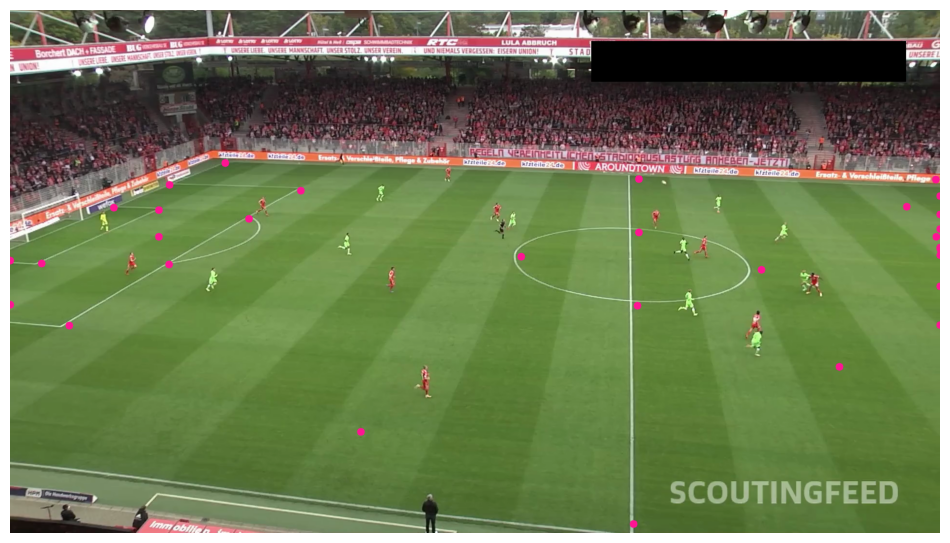

In [102]:
import supervision as sv

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=key_points)

sv.plot_image(annotated_frame)

**Note:** Notice that some of the keypoints we detected are in incorrect locations. These are keypoints with a low confidence level. Let's filter out these keypoints and keep only the ones the model is confident about.

## filter low confidence keypoints

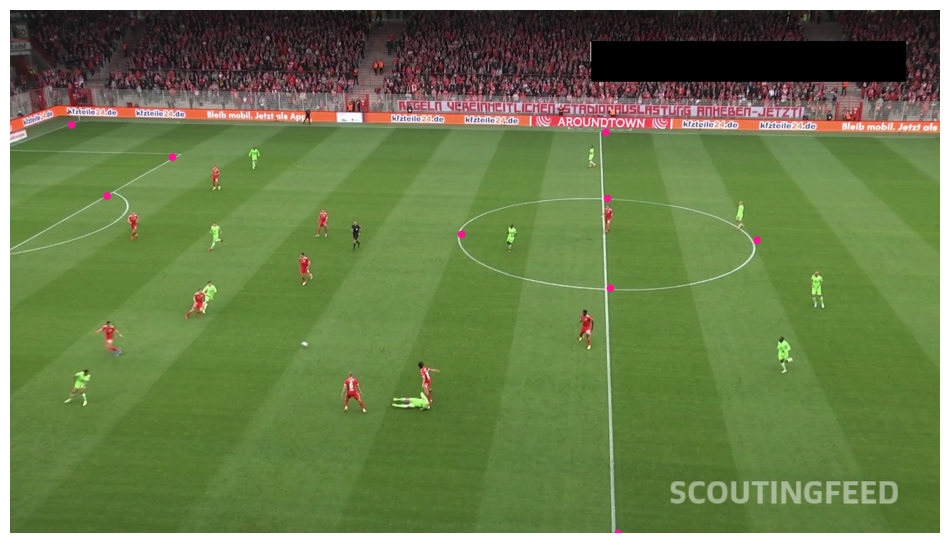

In [103]:
import supervision as sv

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

## project pitch lines on frame

**Note:** The [sports](https://github.com/roboflow/sports) repository contains a [`SoccerPitchConfiguration`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/configs/soccer.py#L6) that provides information about the real-world geometry of the soccer pitch. It also includes utilities for visualizing elements located on the pitch.

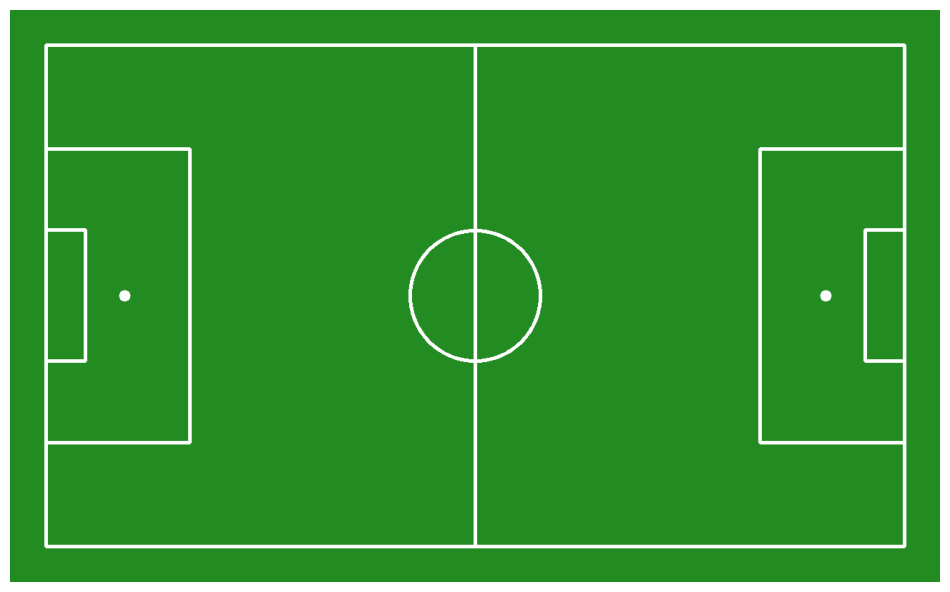

In [104]:
from sports.annotators.soccer import draw_pitch
from sports.configs.soccer import SoccerPitchConfiguration

CONFIG = SoccerPitchConfiguration()

annotated_frame = draw_pitch(CONFIG)

sv.plot_image(annotated_frame)

**Note:** It's time to utilize the keypoint pairs located on the camera perspective plane and the football pitch plane. The [sports](https://github.com/roboflow/sports) repository includes a [`ViewTransformer`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/common/view.py#L7), which employs homography for perspective transformation.

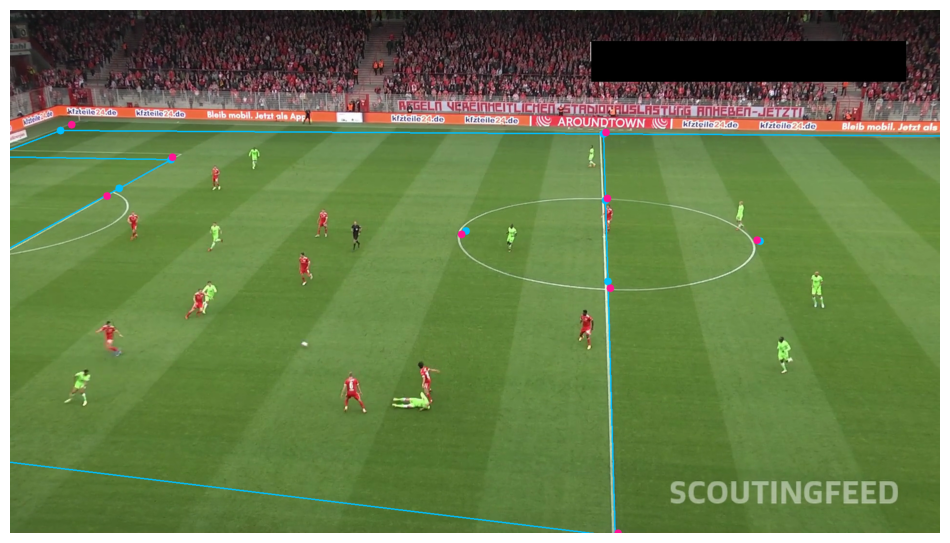

In [105]:
import numpy as np
import supervision as sv
from sports.common.view import ViewTransformer

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"

edge_annotator = sv.EdgeAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    thickness=2, edges=CONFIG.edges)
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)
vertex_annotator_2 = sv.VertexAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=pitch_reference_points,
    target=frame_reference_points
)

pitch_all_points = np.array(CONFIG.vertices)
frame_all_points = transformer.transform_points(points=pitch_all_points)

frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points)
annotated_frame = vertex_annotator_2.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points)
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

# Team Classification
In this section, we will classify players into teams based on their jersey colors. We will use a team classifier that extracts embeddings from player crops and clusters them into two teams.



In [106]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

team_classifier = TeamClassifier(device="cpu") # CUDA yerine CPU kullanıyoruz
team_classifier.fit(crops)

collecting crops: 25it [00:06,  3.98it/s]
Embedding extraction: 18it [00:33,  1.89s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



# Visualizing Team Classification
# In this section, we will visualize the team classification results. We will draw bounding boxes around players with different colors based on their team assignments. This will help us verify the accuracy of our team classification model.


In [107]:
import cv2
from typing import Optional

def draw_pitch_voronoi_diagram_2(
    config: SoccerPitchConfiguration,
    team_1_xy: np.ndarray,
    team_2_xy: np.ndarray,
    team_1_color: sv.Color = sv.Color.RED,
    team_2_color: sv.Color = sv.Color.WHITE,
    opacity: float = 0.5,
    padding: int = 50,
    scale: float = 0.1,
    pitch: Optional[np.ndarray] = None
) -> np.ndarray:
    """
    Draws a Voronoi diagram on a soccer pitch representing the control areas of two
    teams with smooth color transitions.

    Args:
        config (SoccerPitchConfiguration): Configuration object containing the
            dimensions and layout of the pitch.
        team_1_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 1.
        team_2_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 2.
        team_1_color (sv.Color, optional): Color representing the control area of
            team 1. Defaults to sv.Color.RED.
        team_2_color (sv.Color, optional): Color representing the control area of
            team 2. Defaults to sv.Color.WHITE.
        opacity (float, optional): Opacity of the Voronoi diagram overlay.
            Defaults to 0.5.
        padding (int, optional): Padding around the pitch in pixels.
            Defaults to 50.
        scale (float, optional): Scaling factor for the pitch dimensions.
            Defaults to 0.1.
        pitch (Optional[np.ndarray], optional): Existing pitch image to draw the
            Voronoi diagram on. If None, a new pitch will be created. Defaults to None.

    Returns:
        np.ndarray: Image of the soccer pitch with the Voronoi diagram overlay.
    """
    if pitch is None:
        pitch = draw_pitch(
            config=config,
            padding=padding,
            scale=scale
        )

    scaled_width = int(config.width * scale)
    scaled_length = int(config.length * scale)

    voronoi = np.zeros_like(pitch, dtype=np.uint8)

    team_1_color_bgr = np.array(team_1_color.as_bgr(), dtype=np.uint8)
    team_2_color_bgr = np.array(team_2_color.as_bgr(), dtype=np.uint8)

    y_coordinates, x_coordinates = np.indices((
        scaled_width + 2 * padding,
        scaled_length + 2 * padding
    ))

    y_coordinates -= padding
    x_coordinates -= padding

    def calculate_distances(xy, x_coordinates, y_coordinates):
        return np.sqrt((xy[:, 0][:, None, None] * scale - x_coordinates) ** 2 +
                       (xy[:, 1][:, None, None] * scale - y_coordinates) ** 2)

    distances_team_1 = calculate_distances(team_1_xy, x_coordinates, y_coordinates)
    distances_team_2 = calculate_distances(team_2_xy, x_coordinates, y_coordinates)

    min_distances_team_1 = np.min(distances_team_1, axis=0)
    min_distances_team_2 = np.min(distances_team_2, axis=0)

    # Increase steepness of the blend effect
    steepness = 15  # Increased steepness for sharper transition
    distance_ratio = min_distances_team_2 / np.clip(min_distances_team_1 + min_distances_team_2, a_min=1e-5, a_max=None)
    blend_factor = np.tanh((distance_ratio - 0.5) * steepness) * 0.5 + 0.5

    # Create the smooth color transition
    for c in range(3):  # Iterate over the B, G, R channels
        voronoi[:, :, c] = (blend_factor * team_1_color_bgr[c] +
                            (1 - blend_factor) * team_2_color_bgr[c]).astype(np.uint8)

    overlay = cv2.addWeighted(voronoi, opacity, pitch, 1 - opacity, 0)

    return overlay

# Player Detection and Tracking
In this cell, we will:
- Load and initialize various annotators for visualization
- Set up object detection for players, ball, goalkeepers and referees
- Configure tracking using ByteTrack
- Process a single frame to detect and track objects


Embedding extraction: 1it [00:01,  1.36s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



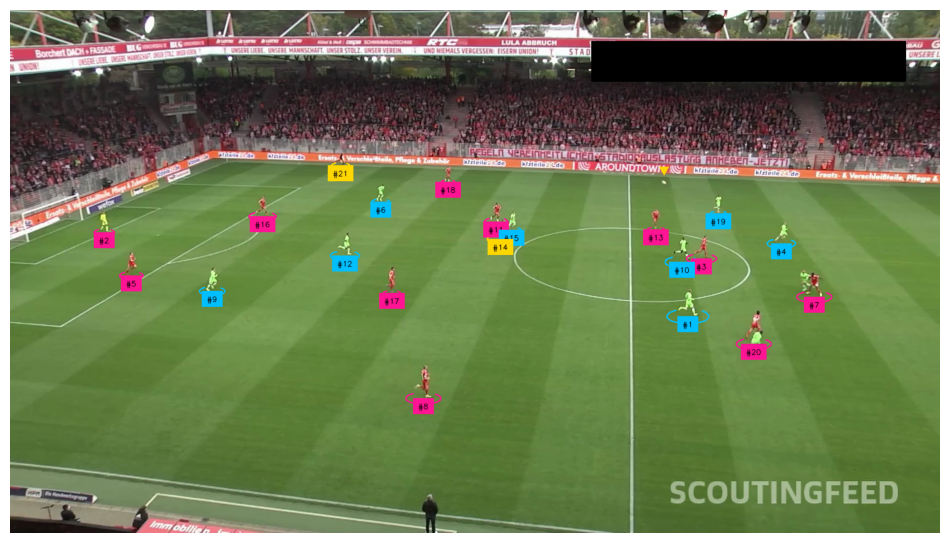

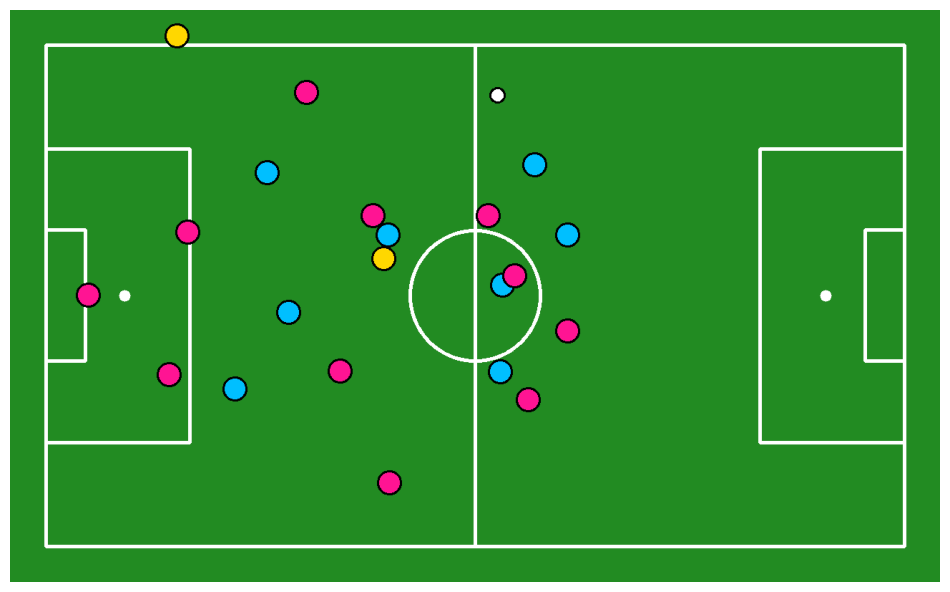

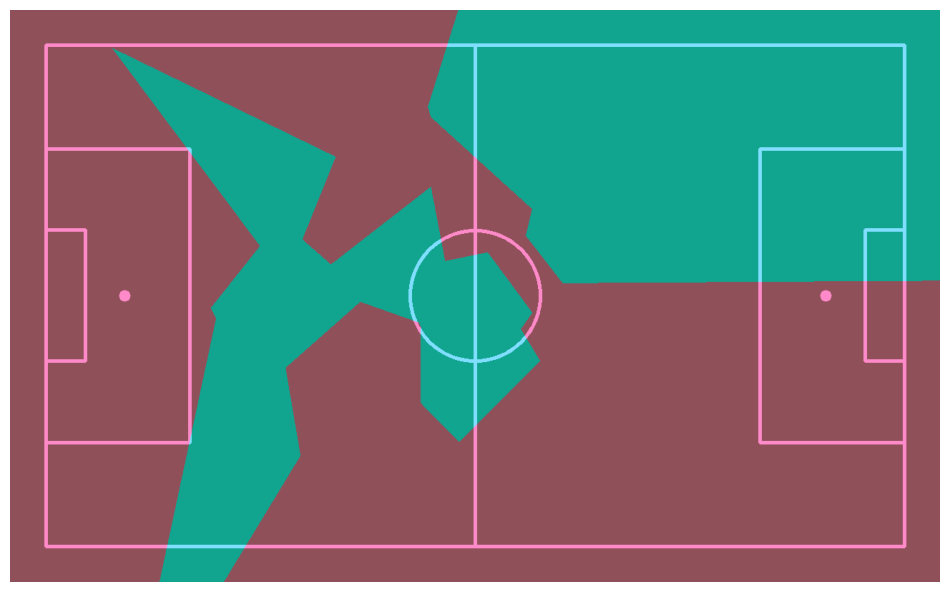

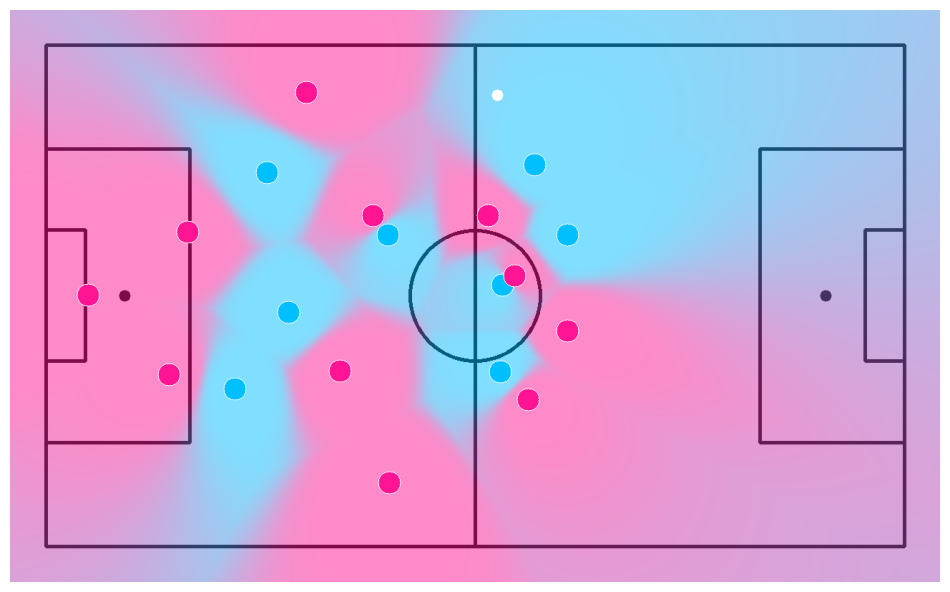

In [108]:
import supervision as sv
from sports.annotators.soccer import (
    draw_pitch,
    draw_points_on_pitch,
    draw_pitch_voronoi_diagram
)

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# ball, goalkeeper, player, referee detection

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

# team assignment

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

# frame visualization

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

players_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections
])

# detect pitch key points

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

# project ball, players and referies on pitch

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=frame_reference_points,
    target=pitch_reference_points
)

frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_players_xy = transformer.transform_points(points=players_xy)

referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_referees_xy = transformer.transform_points(points=referees_xy)

# visualize video game-style radar view

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.BLACK,
    radius=10,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 0],
    face_color=sv.Color.from_hex('00BFFF'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 1],
    face_color=sv.Color.from_hex('FF1493'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_referees_xy,
    face_color=sv.Color.from_hex('FFD700'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

# visualize voronoi diagram

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_pitch_voronoi_diagram(
    config=CONFIG,
    team_1_xy=pitch_players_xy[players_detections.class_id == 0],
    team_2_xy=pitch_players_xy[players_detections.class_id == 1],
    team_1_color=sv.Color.from_hex('00BFFF'),
    team_2_color=sv.Color.from_hex('FF1493'),
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

# visualize voronoi diagram with blend

annotated_frame = draw_pitch(
    config=CONFIG,
    background_color=sv.Color.WHITE,
    line_color=sv.Color.BLACK
)
annotated_frame = draw_pitch_voronoi_diagram_2(
    config=CONFIG,
    team_1_xy=pitch_players_xy[players_detections.class_id == 0],
    team_2_xy=pitch_players_xy[players_detections.class_id == 1],
    team_1_color=sv.Color.from_hex('00BFFF'),
    team_2_color=sv.Color.from_hex('FF1493'),
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.WHITE,
    radius=8,
    thickness=1,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 0],
    face_color=sv.Color.from_hex('00BFFF'),
    edge_color=sv.Color.WHITE,
    radius=16,
    thickness=1,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 1],
    face_color=sv.Color.from_hex('FF1493'),
    edge_color=sv.Color.WHITE,
    radius=16,
    thickness=1,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

# Ball Path Analysis
In the following cell, we analyze the ball's path throughout the video. We process every 30th frame (defined by STRIDE) to track the ball's movement on the pitch. The code:
1. Detects the ball using our model
2. Transforms ball coordinates from frame space to pitch space
3. Stores the path information for visualization


In [116]:
from collections import deque
import supervision as sv
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch

SOURCE_VIDEO_PATH = "YOUR VIDEO PATH"
BALL_ID = 0
MAXLEN = 5
STRIDE = 1

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

path_raw = []
M = deque(maxlen=MAXLEN)

for frame_idx, frame in enumerate(tqdm(frame_generator, total=video_info.total_frames)):
    
    if frame_idx % STRIDE != 0:
        continue
        
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    filter = key_points.confidence[0] > 0.5
    frame_reference_points = key_points.xy[0][filter]
    pitch_reference_points = np.array(CONFIG.vertices)[filter]

    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points
    )
    M.append(transformer.m)
    transformer.m = np.mean(np.array(M), axis=0)

    frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

    path_raw.append(pitch_ball_xy)

100%|██████████| 750/750 [03:33<00:00,  3.52it/s]


# Cleaning the Ball Path Data
In the next cell, we'll process the raw ball path data to handle cases where multiple ball detections occur in a single frame. We'll ensure each frame has at most one ball position coordinate.


In [117]:
path = [
    np.empty((0, 2), dtype=np.float32) if coorinates.shape[0] >= 2 else coorinates
    for coorinates
    in path_raw
]

path = [coorinates.flatten() for coorinates in path]

# Visualizing the Ball Path
# In the next cell, we'll visualize the ball's path on the pitch using the processed coordinates. This will help us understand the ball's movement patterns during the game.


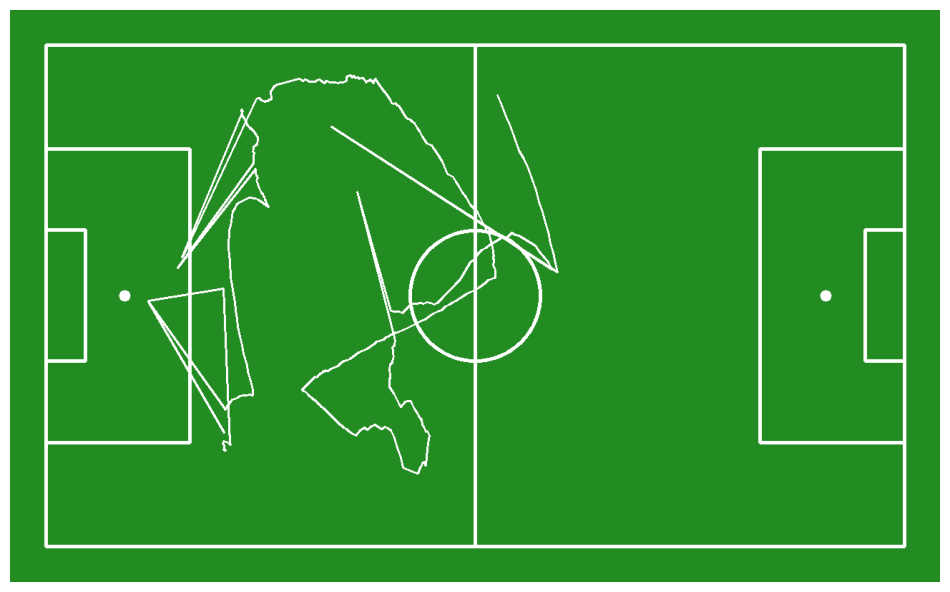

In [118]:
from sports.annotators.soccer import draw_paths_on_pitch

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path],
    color=sv.Color.WHITE,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

# # Filtering Ball Path Data
# In the next cell, we'll define a function to filter out outlier positions based on distance thresholds. This helps remove erroneous detections and creates a smoother ball trajectory.


In [119]:
from typing import List, Union

def replace_outliers_based_on_distance(
    positions: List[np.ndarray],
    distance_threshold: float
) -> List[np.ndarray]:
    last_valid_position: Union[np.ndarray, None] = None
    cleaned_positions: List[np.ndarray] = []

    for position in positions:
        if len(position) == 0:
            # If the current position is already empty, just add it to the cleaned positions
            cleaned_positions.append(position)
        else:
            if last_valid_position is None:
                # If there's no valid last position, accept the first valid one
                cleaned_positions.append(position)
                last_valid_position = position
            else:
                # Calculate the distance from the last valid position
                distance = np.linalg.norm(position - last_valid_position)
                if distance > distance_threshold:
                    # Replace with empty array if the distance exceeds the threshold
                    cleaned_positions.append(np.array([], dtype=np.float64))
                else:
                    cleaned_positions.append(position)
                    last_valid_position = position

    return cleaned_positions

# # Filtering Ball Path Data
# Now we'll filter the ball path data using the function we defined above. This will help us remove any outlier positions that are too far from the previous valid position, creating a smoother and more accurate ball trajectory.


In [120]:
MAX_DISTANCE_THRESHOLD = 500

path = replace_outliers_based_on_distance(path, MAX_DISTANCE_THRESHOLD)

# Visualizing Filtered Ball Path
# After filtering out outlier positions that exceed our distance threshold, we'll visualize the filtered ball path on the pitch. This will show us a cleaner trajectory that better represents the actual ball movement.


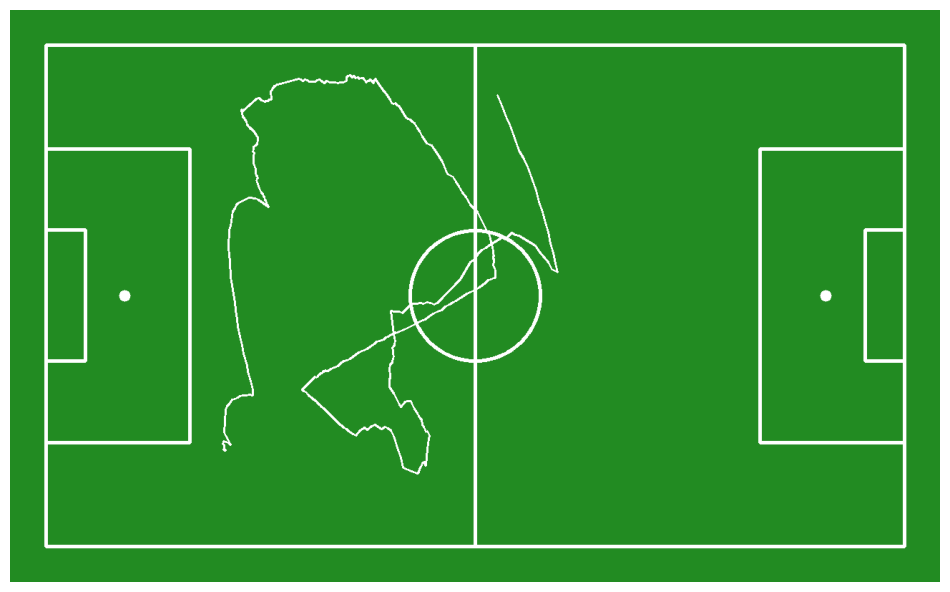

In [122]:
# Filter out non-empty path points
path_filtered = [p for p in path if p.size > 0]

# Visualization
annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path_filtered],  # Use the filtered path
    color=sv.Color.WHITE,
    pitch=annotated_frame
)

sv.plot_image(annotated_frame)

# Team Color Detection
## Analyzing Team Colors from Video Frames
In this section, we'll detect and analyze the dominant colors of player jerseys to identify team colors. This process involves:

1. **Frame Sampling**: Extracting frames at regular intervals from the video
2. **Player Detection**: Using our model to detect players in each frame
3. **Color Analysis**: 
   - Isolating player jersey regions
   - Applying color clustering to find dominant colors
   - Aggregating results to determine team colors

The analysis focuses on the upper body area of detected players to better capture jersey colors while minimizing interference from shorts, socks, or background elements.

---
*The following cell implements the team color detection algorithm using K-means clustering.*


In [123]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from collections import Counter
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

def detect_team_colors(video_path, num_frames=25):
    """Deteck the team colors"""
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frames_to_sample = np.linspace(0, total_frames-1, num_frames, dtype=int)
    
    team_colors = []
    
    for frame_idx in frames_to_sample:
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if not ret:
            continue
            
        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)
        players_detections = detections[detections.class_id == PLAYER_ID]
        
        for xyxy in players_detections.xyxy:
            x1, y1, x2, y2 = map(int, xyxy)
            player_img = frame[y1:y2, x1:x2]
            
            if player_img.size > 0:
                # To better detect the jersey color, process the image
                player_img = cv2.cvtColor(player_img, cv2.COLOR_BGR2RGB)
                # Take the upper half (usually the jersey area)
                height = player_img.shape[0]
                player_img = player_img[:height//2]
                
                pixels = player_img.reshape(-1, 3)
                
                if pixels.shape[0] > 0:
                    kmeans = KMeans(n_clusters=1)
                    kmeans.fit(pixels)
                    dominant_color = kmeans.cluster_centers_[0]
                    team_colors.append(dominant_color)
    
    cap.release()
    
    if len(team_colors) < 2:
        return "Team 1", "Team 2", None, None
    
    # Split colors into two groups
    kmeans = KMeans(n_clusters=2)
    team_clusters = kmeans.fit_predict(team_colors)
    
    # Find the most common colors
    team1_color = np.mean([c for i,c in enumerate(team_colors) if team_clusters[i]==0], axis=0)
    team2_color = np.mean([c for i,c in enumerate(team_colors) if team_clusters[i]==1], axis=0)
    
    # Convert RGB values to color names
    def get_color_name(rgb):
        colors = {
            'Red': [255,0,0],
            'Blue': [0,0,255], 
            'Green': [0,255,0],
            'Yellow': [255,255,0],
            'White': [255,255,255],
            'Black': [0,0,0]
        }
        
        min_dist = float('inf')
        closest_color = None
        
        for name, value in colors.items():
            dist = np.linalg.norm(rgb - value)
            if dist < min_dist:
                min_dist = dist
                closest_color = name
                
        return closest_color
    
    team1_name = f"{get_color_name(team1_color)} Team"
    team2_name = f"{get_color_name(team2_color)} Team"
    
    return team1_name, team2_name, team1_color, team2_color

def visualize_detection(frame, ball_pos, team1_positions, team2_positions, 
                       team1_color, team2_color, min_dist_team1=None, min_dist_team2=None):
    """Debug için tespitleri görselleştir"""
    vis_frame = frame.copy()
    
    # Draw the ball position (yellow circle)
    if ball_pos is not None:
        cv2.circle(vis_frame, (int(ball_pos[0]), int(ball_pos[1])), 10, (0,255,255), -1)
    
    # Draw team 1 positions (yellow circles)
    t1_color = tuple(map(int, team1_color[::-1]))  # RGB -> BGR
    for pos in team1_positions:
        cv2.circle(vis_frame, (int(pos[0]), int(pos[1])), 15, t1_color, 2)
    
    # Draw team 2 positions (red circles)
    t2_color = tuple(map(int, team2_color[::-1]))  # RGB -> BGR
    for pos in team2_positions:
        cv2.circle(vis_frame, (int(pos[0]), int(pos[1])), 15, t2_color, 2)
    
    # Add distance information
    if min_dist_team1 is not None and min_dist_team2 is not None:
        cv2.putText(vis_frame, f"Team 1 dist: {min_dist_team1:.1f}", (10, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 1, t1_color, 2)
        cv2.putText(vis_frame, f"Team 2 dist: {min_dist_team2:.1f}", (10, 70),
                   cv2.FONT_HERSHEY_SIMPLEX, 1, t2_color, 2)
    
    return vis_frame

# Team Color Detection and Analysis

This section focuses on detecting and analyzing team colors from the football match video. The process involves:

## Key Steps
1. **Frame Sampling**: Extracts frames at regular intervals from the video
2. **Player Detection**: Uses YOLOv8 model to detect players in each frame
3. **Color Analysis**: 
   - Crops player images
   - Focuses on upper body for jersey color
   - Uses K-means clustering to identify dominant colors
   - Groups colors into two team clusters

## Visual Output
- Shows detected players with bounding boxes
- Displays team colors with RGB values
- Assigns descriptive color names (e.g. "Red Team", "Yellow Team")

## Technical Details
- Uses OpenCV for video processing
- Implements K-means clustering for color analysis
- Performs RGB color space operations
- Handles edge cases and error conditions

The following cells demonstrate the team color detection pipeline in action.



Starting ball possession analysis...

Detecting team colors...
Detected teams: Red Team vs Yellow Team

Training team classifier...


Total player images collected: 478


Embedding extraction: 15it [00:30,  2.04s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Analyzing possession...
Using possession threshold of 3 frames


Embedding extraction: 1it [00:01,  1.31s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.32s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 0:
Team 1 (Red Team) - closest distance: 1461.0
Team 2 (Yellow Team) - closest distance: 2090.7
Current closer team: Red Team
Current possession: Yellow Team


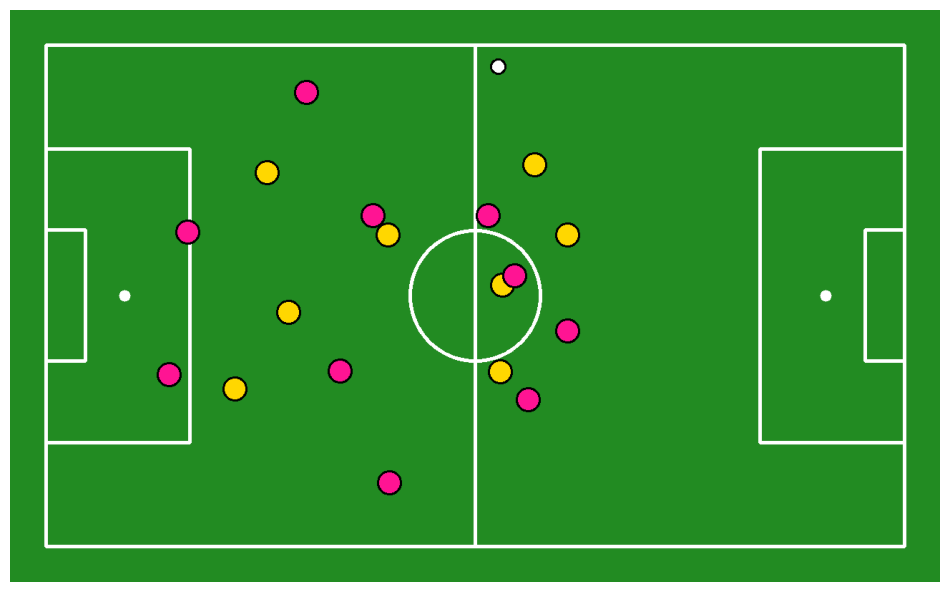

Embedding extraction: 1it [00:01,  1.39s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.46s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 20:
Team 1 (Red Team) - closest distance: 470.0
Team 2 (Yellow Team) - closest distance: 692.2
Current closer team: Red Team
Current possession: Red Team


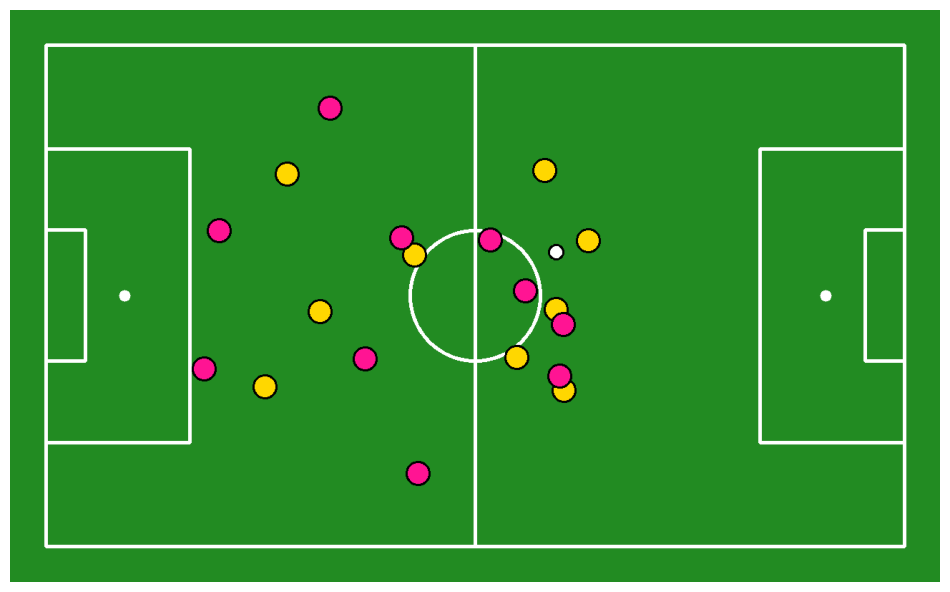

Embedding extraction: 1it [00:01,  1.63s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.50s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 40:
Team 1 (Red Team) - closest distance: 656.8
Team 2 (Yellow Team) - closest distance: 382.8
Current closer team: Yellow Team
Current possession: Red Team


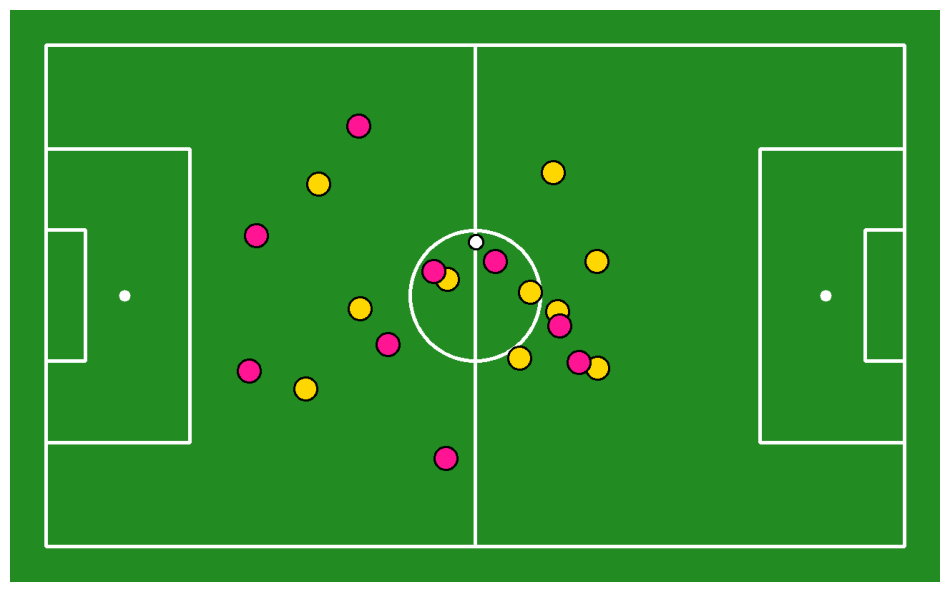

Embedding extraction: 1it [00:01,  1.34s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.34s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.33s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.34s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/


Frame 100:
Team 1 (Red Team) - closest distance: 133.8
Team 2 (Yellow Team) - closest distance: 143.9
Current closer team: Red Team
Current possession: Red Team
Challenge in progress: 1/3


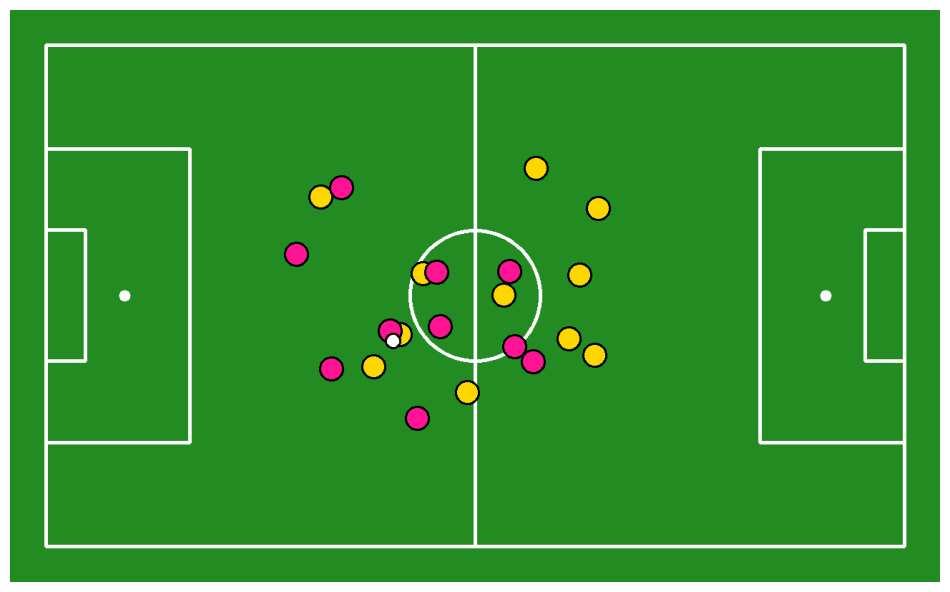

Embedding extraction: 1it [00:01,  1.39s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.40s/it]


Frame 120:
Team 1 (Red Team) - closest distance: 39.3
Team 2 (Yellow Team) - closest distance: 173.4
Current closer team: Red Team
Current possession: Red Team



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



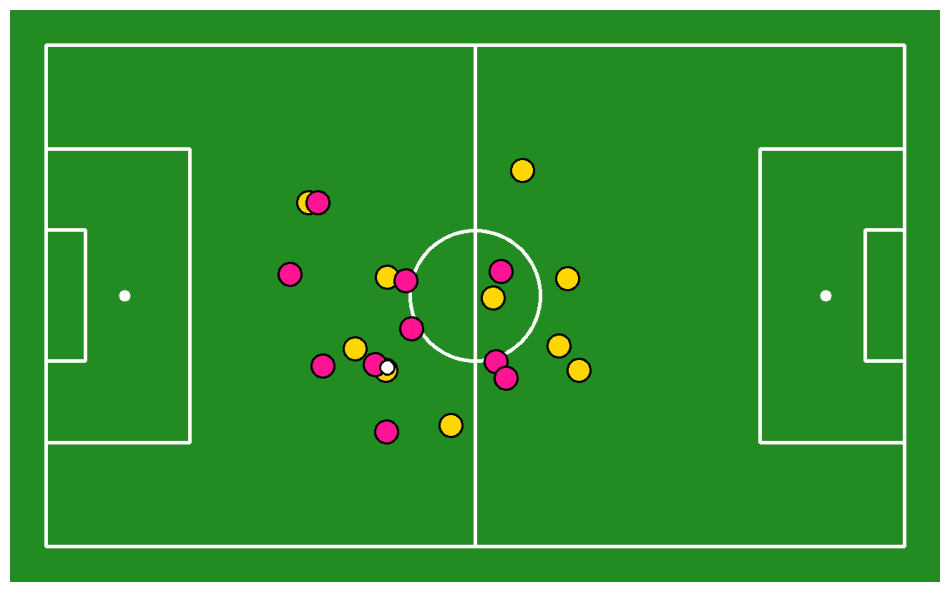

Embedding extraction: 1it [00:01,  1.32s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.35s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 140:
Team 1 (Red Team) - closest distance: 413.8
Team 2 (Yellow Team) - closest distance: 504.8
Current closer team: Red Team
Current possession: Red Team


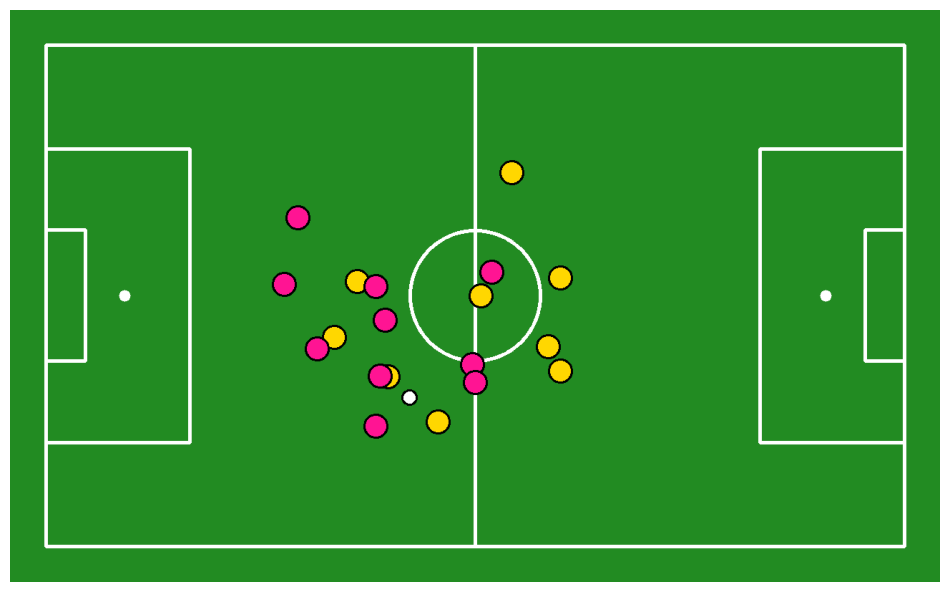

Embedding extraction: 1it [00:01,  1.34s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.33s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 160:
Team 1 (Red Team) - closest distance: 87.7
Team 2 (Yellow Team) - closest distance: 512.9
Current closer team: Red Team
Current possession: Red Team


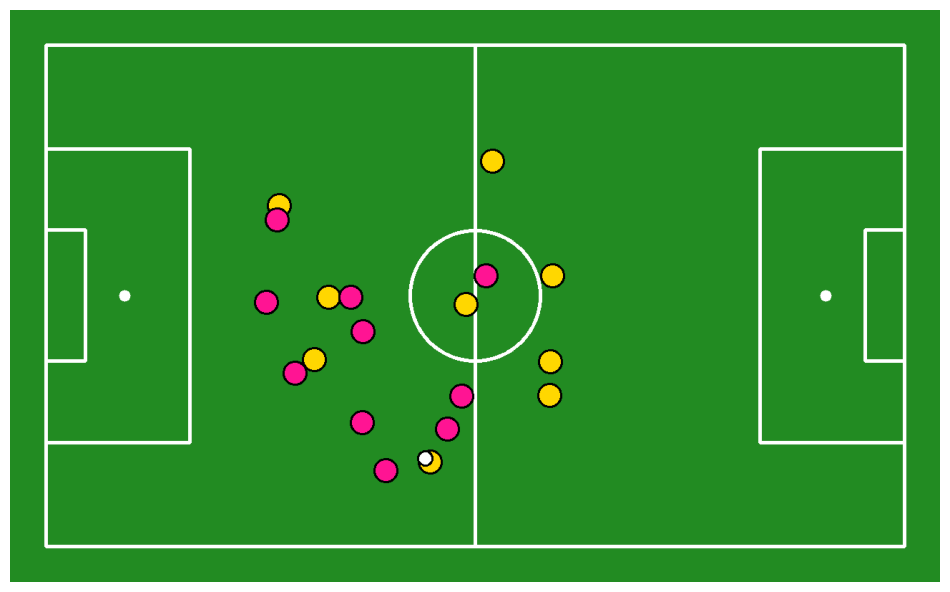

Embedding extraction: 1it [00:01,  1.46s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.46s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 180:
Team 1 (Red Team) - closest distance: 43.7
Team 2 (Yellow Team) - closest distance: 130.3
Current closer team: Red Team
Current possession: Red Team


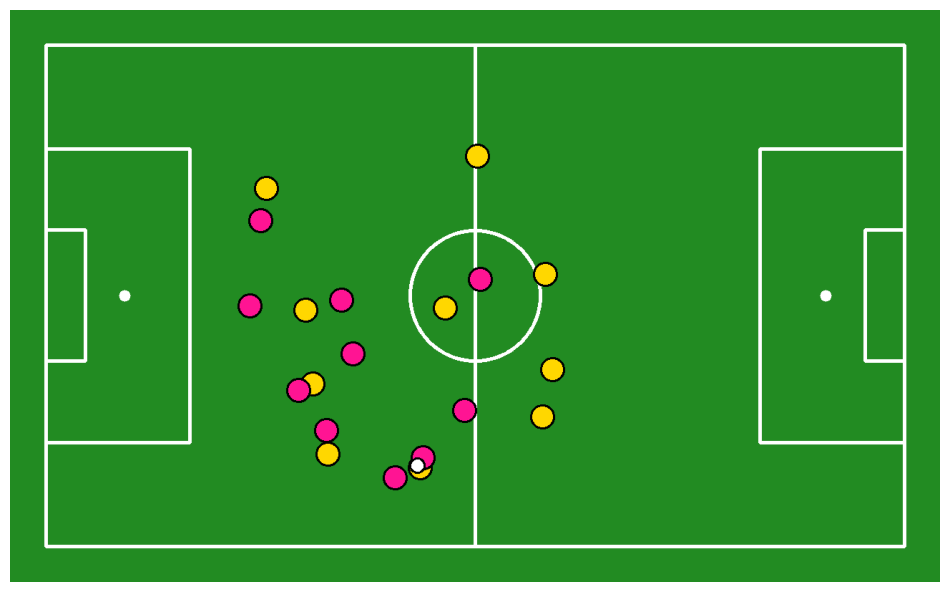

Embedding extraction: 1it [00:01,  1.45s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.40s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 200:
Team 1 (Red Team) - closest distance: 746.1
Team 2 (Yellow Team) - closest distance: 750.7
Current closer team: Red Team
Current possession: Red Team


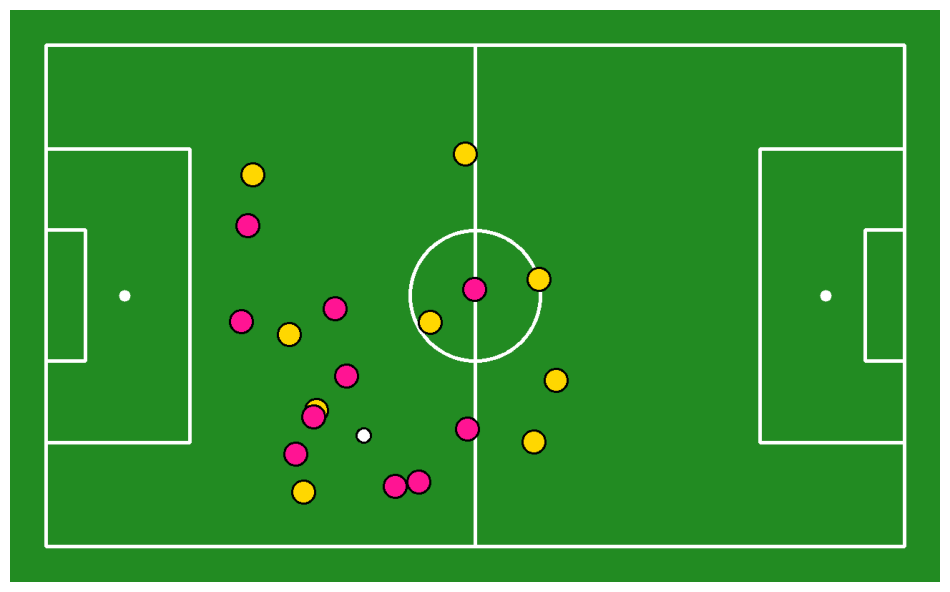

Embedding extraction: 1it [00:01,  1.42s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.44s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.43s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.46s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklear


Frame 240:
Team 1 (Red Team) - closest distance: 45.4
Team 2 (Yellow Team) - closest distance: 277.5
Current closer team: Red Team
Current possession: Red Team


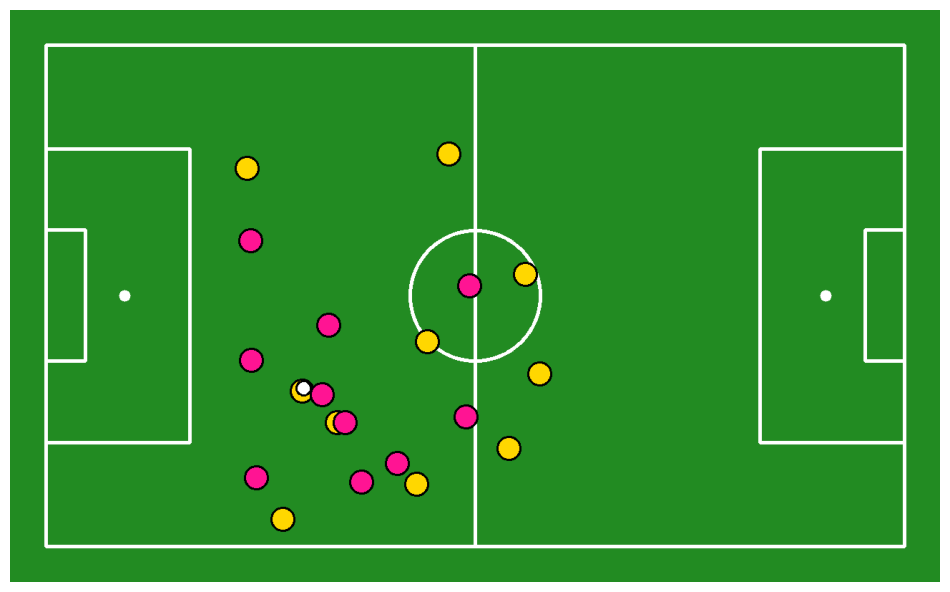

Embedding extraction: 1it [00:01,  1.43s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.46s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.45s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.45s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklear


Frame 280:
Team 1 (Red Team) - closest distance: 163.3
Team 2 (Yellow Team) - closest distance: 120.2
Current closer team: Yellow Team
Current possession: Red Team


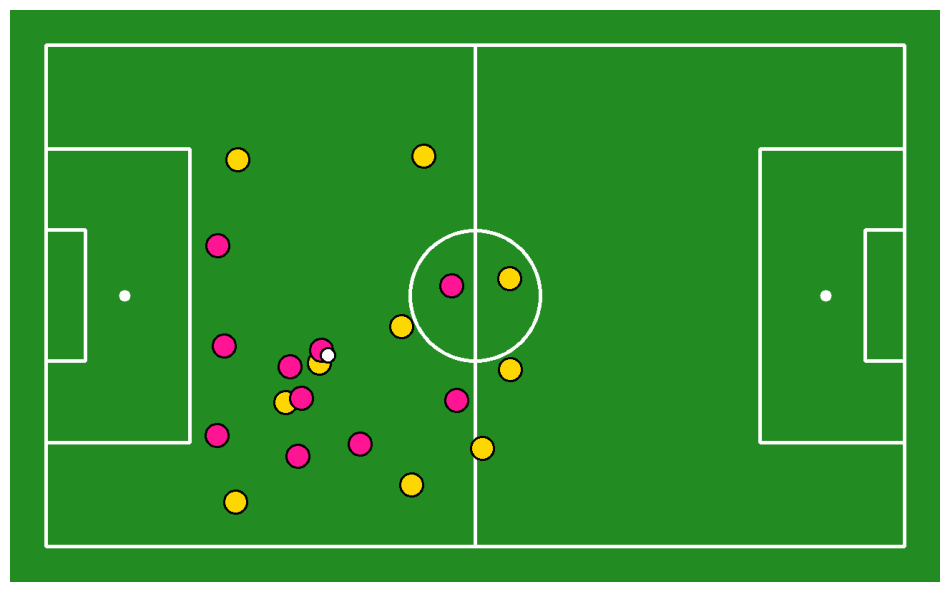

Embedding extraction: 1it [00:01,  1.43s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.48s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 300:
Team 1 (Red Team) - closest distance: 87.1
Team 2 (Yellow Team) - closest distance: 734.5
Current closer team: Red Team
Current possession: Red Team
Challenge in progress: 1/3


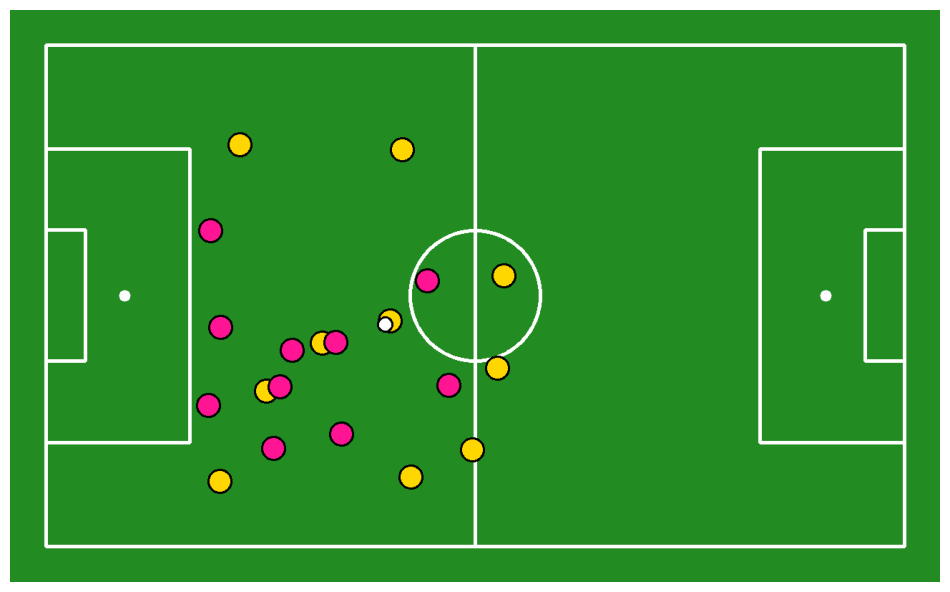

Embedding extraction: 1it [00:01,  1.45s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.51s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 320:
Team 1 (Red Team) - closest distance: 447.6
Team 2 (Yellow Team) - closest distance: 154.8
Current closer team: Yellow Team
Current possession: Red Team


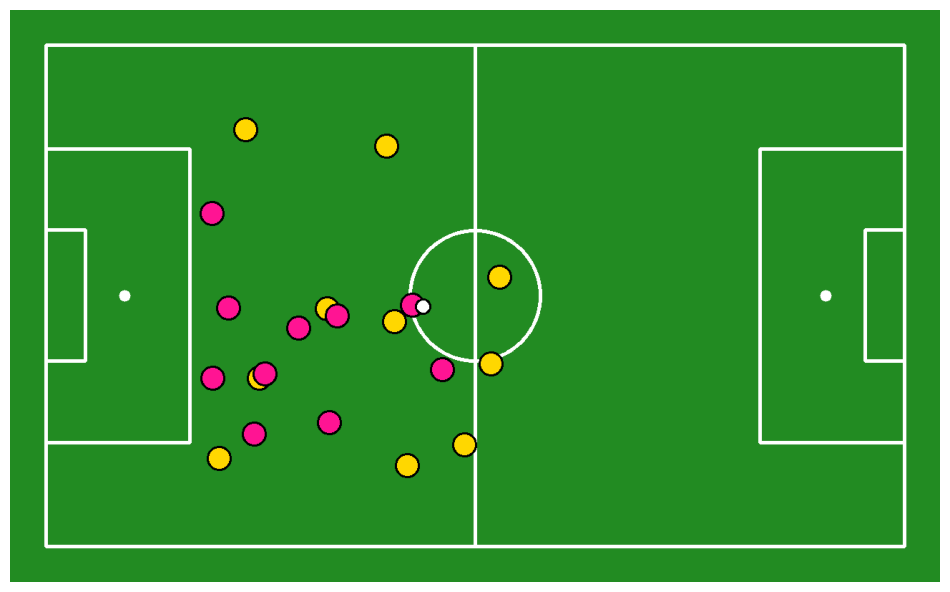

Embedding extraction: 1it [00:01,  1.37s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.40s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 340:
Team 1 (Red Team) - closest distance: 140.4
Team 2 (Yellow Team) - closest distance: 1309.6
Current closer team: Red Team
Current possession: Red Team
Challenge in progress: 1/3


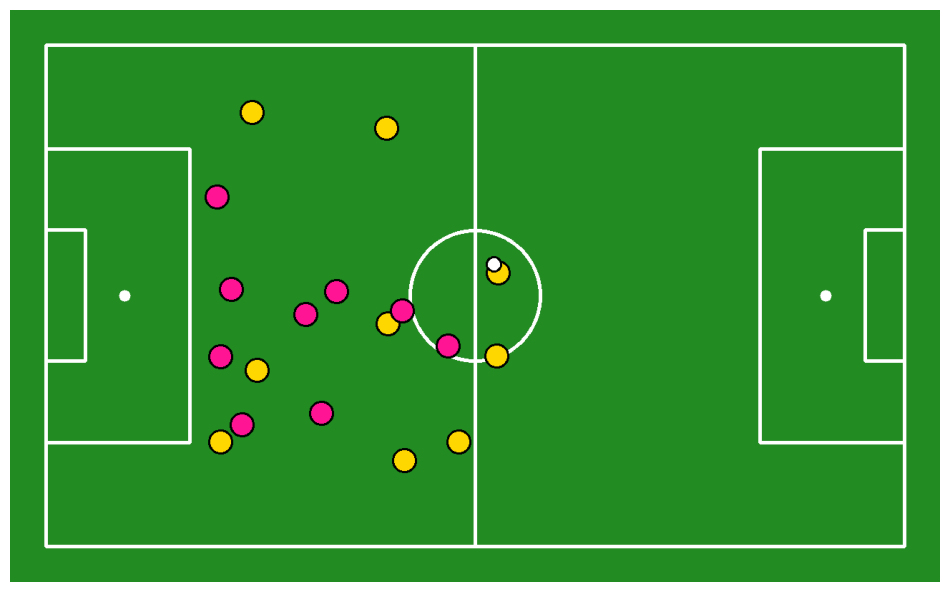

Embedding extraction: 1it [00:01,  1.20s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.21s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 360:
Team 1 (Red Team) - closest distance: 295.5
Team 2 (Yellow Team) - closest distance: 1379.8
Current closer team: Red Team
Current possession: Red Team


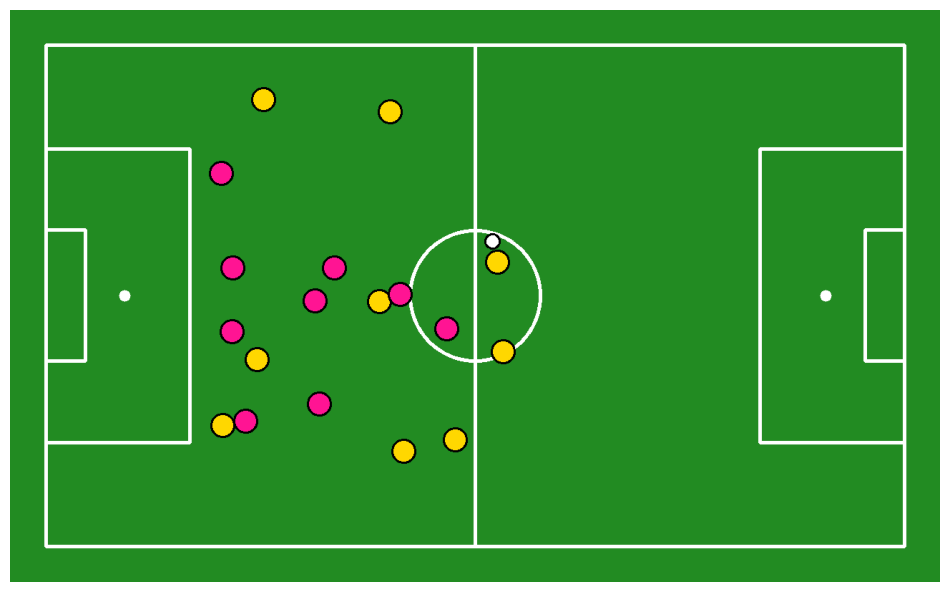

Embedding extraction: 1it [00:01,  1.28s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.27s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 380:
Team 1 (Red Team) - closest distance: 750.4
Team 2 (Yellow Team) - closest distance: 1566.4
Current closer team: Red Team
Current possession: Red Team


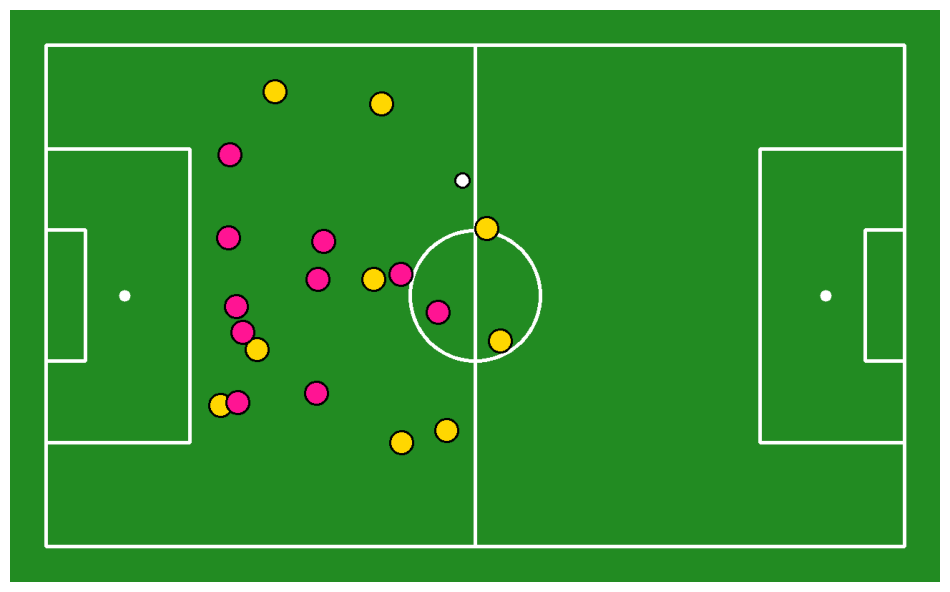

Embedding extraction: 1it [00:01,  1.26s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.28s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 400:
Team 1 (Red Team) - closest distance: 473.9
Team 2 (Yellow Team) - closest distance: 2075.8
Current closer team: Red Team
Current possession: Red Team


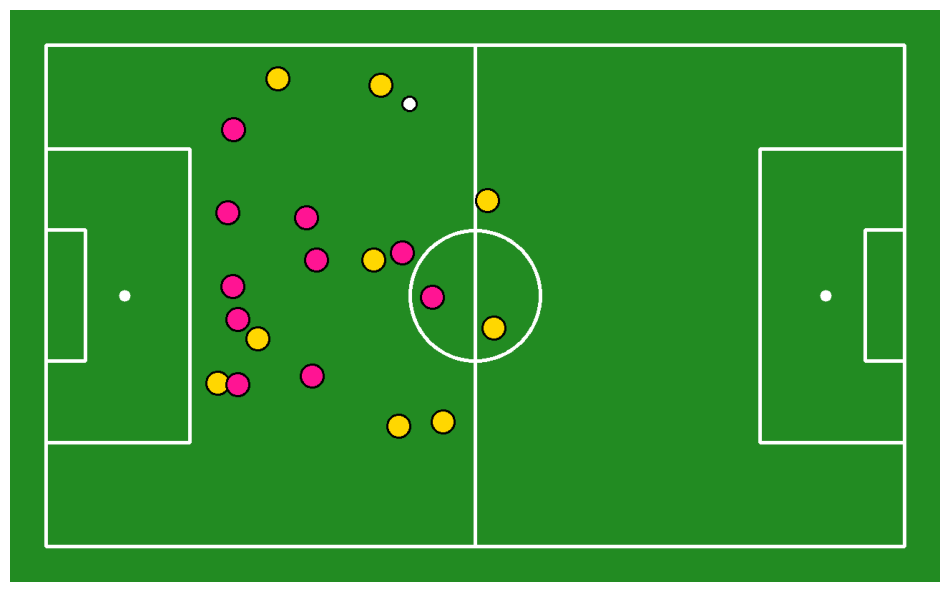

Embedding extraction: 1it [00:01,  1.32s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.33s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.34s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.34s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklear


Frame 440:
Team 1 (Red Team) - closest distance: 173.5
Team 2 (Yellow Team) - closest distance: 1849.2
Current closer team: Red Team
Current possession: Red Team


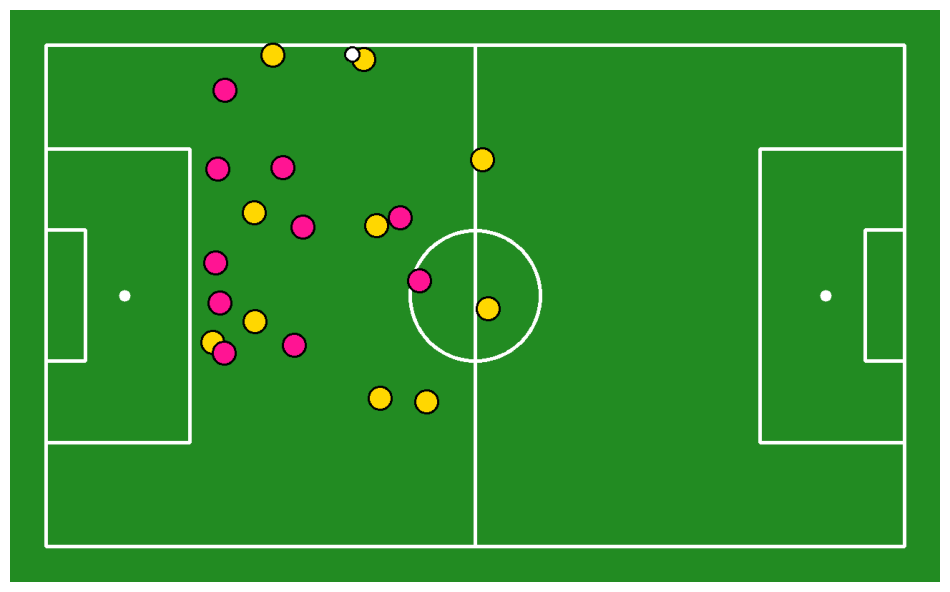

Embedding extraction: 1it [00:01,  1.34s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.34s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 460:
Team 1 (Red Team) - closest distance: 216.0
Team 2 (Yellow Team) - closest distance: 1359.3
Current closer team: Red Team
Current possession: Red Team


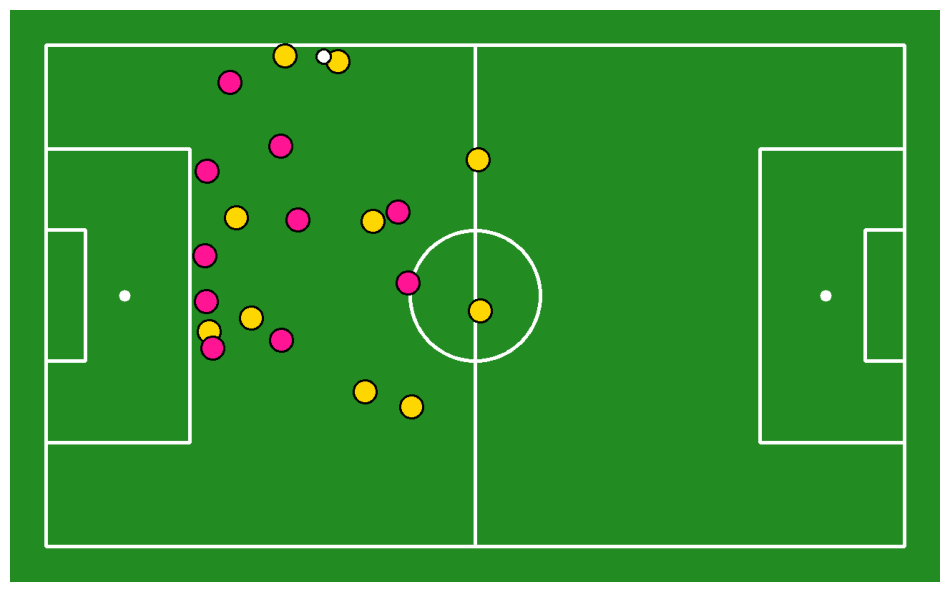

Embedding extraction: 1it [00:01,  1.36s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.39s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.20s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.23s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklear


Frame 560:
Team 1 (Red Team) - closest distance: 396.6
Team 2 (Yellow Team) - closest distance: 59.2
Current closer team: Yellow Team
Current possession: Red Team


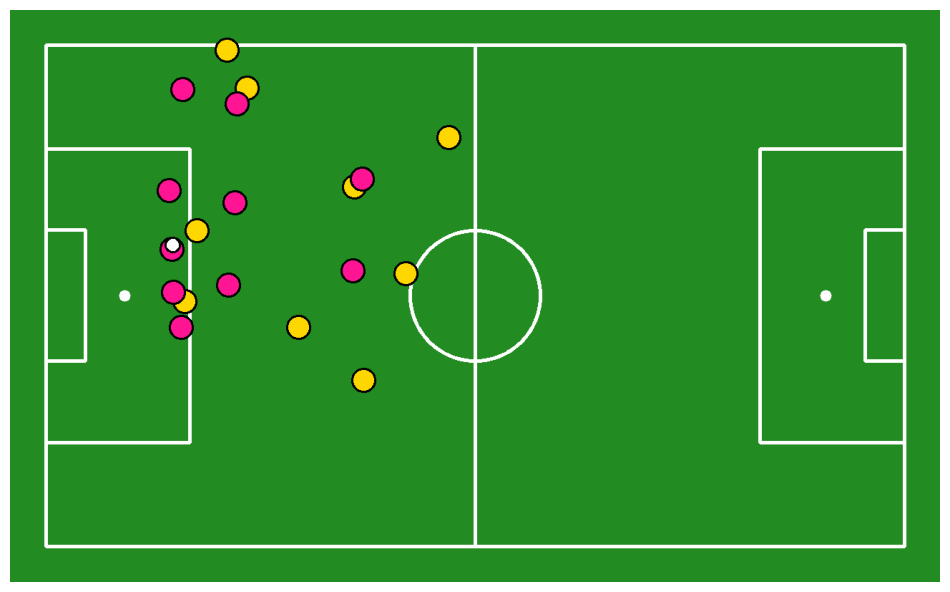

Embedding extraction: 1it [00:01,  1.23s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.24s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 580:
Team 1 (Red Team) - closest distance: 70.8
Team 2 (Yellow Team) - closest distance: 260.8
Current closer team: Red Team
Current possession: Red Team
Challenge in progress: 1/3


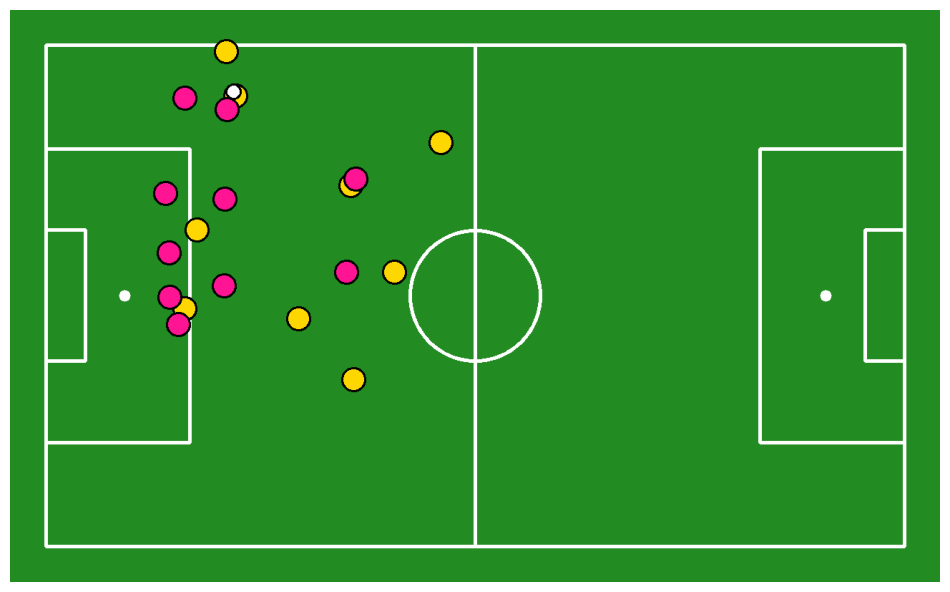

Embedding extraction: 1it [00:01,  1.30s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.31s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 600:
Team 1 (Red Team) - closest distance: 45.7
Team 2 (Yellow Team) - closest distance: 166.9
Current closer team: Red Team
Current possession: Red Team


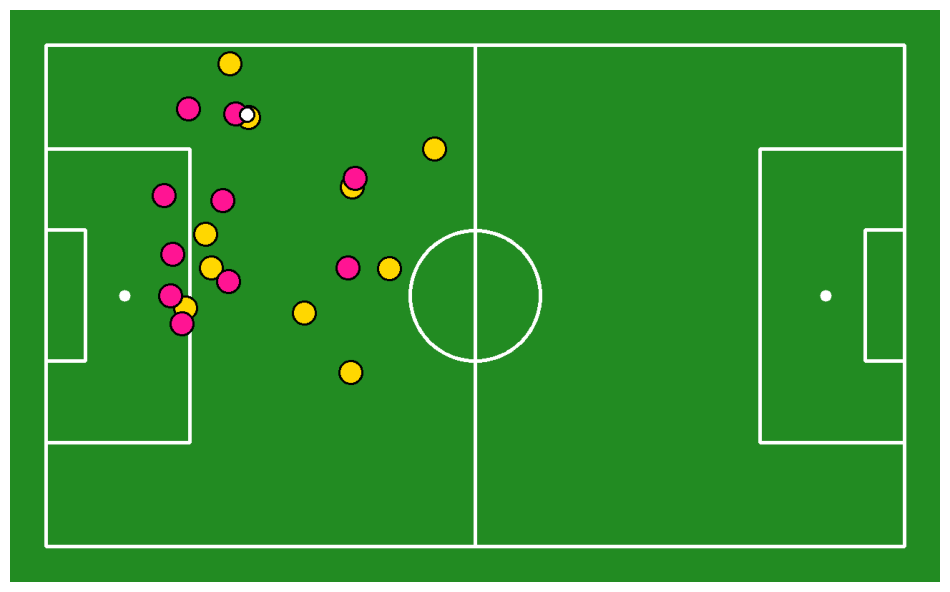

Embedding extraction: 1it [00:01,  1.18s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.17s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.24s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.23s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklear


Frame 660:
Team 1 (Red Team) - closest distance: 68.2
Team 2 (Yellow Team) - closest distance: 235.2
Current closer team: Red Team
Current possession: Red Team


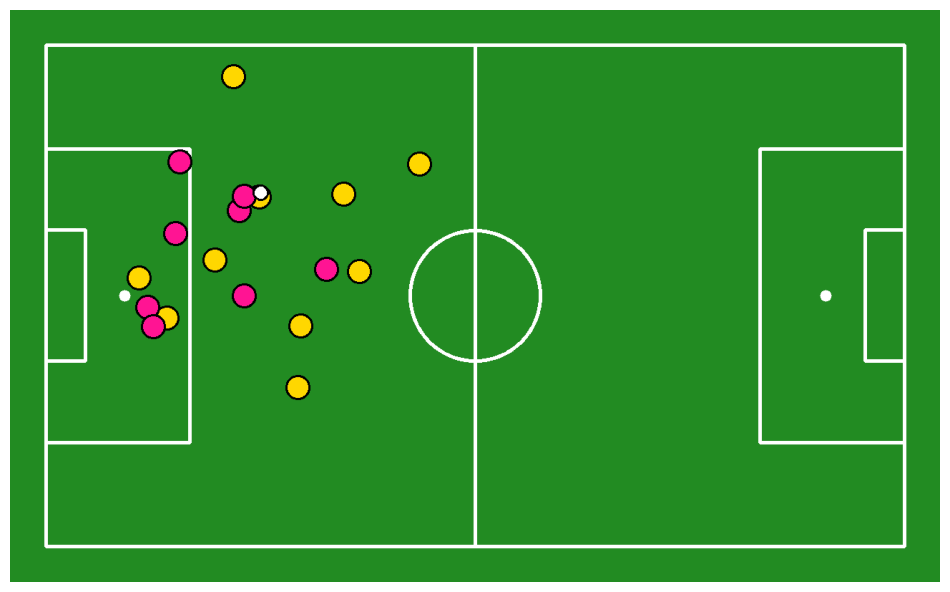

Embedding extraction: 1it [00:01,  1.23s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.19s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 680:
Team 1 (Red Team) - closest distance: 553.5
Team 2 (Yellow Team) - closest distance: 326.1
Current closer team: Yellow Team
Current possession: Red Team


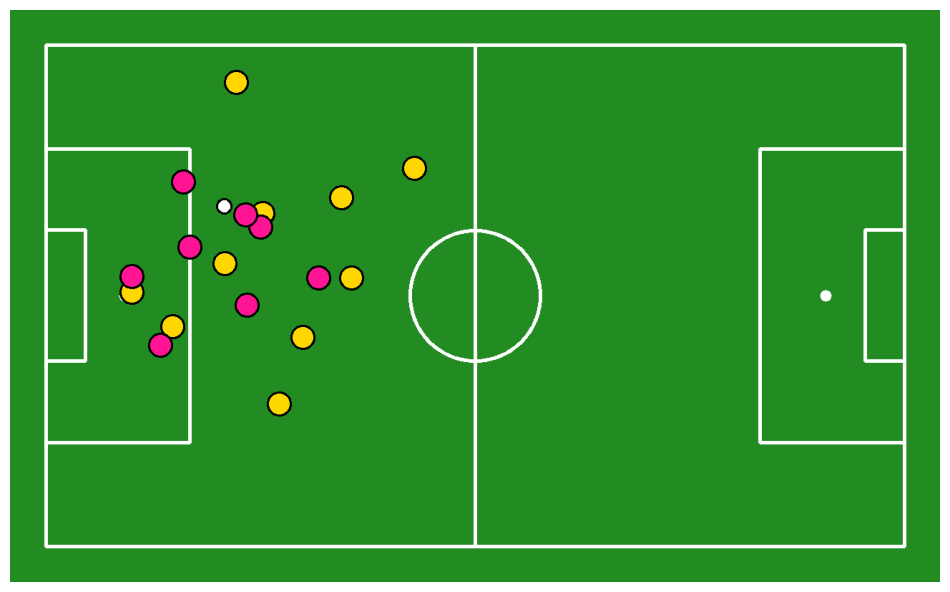

Embedding extraction: 1it [00:01,  1.24s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.25s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 700:
Team 1 (Red Team) - closest distance: 868.9
Team 2 (Yellow Team) - closest distance: 541.6
Current closer team: Yellow Team
Current possession: Red Team
Challenge in progress: 1/3


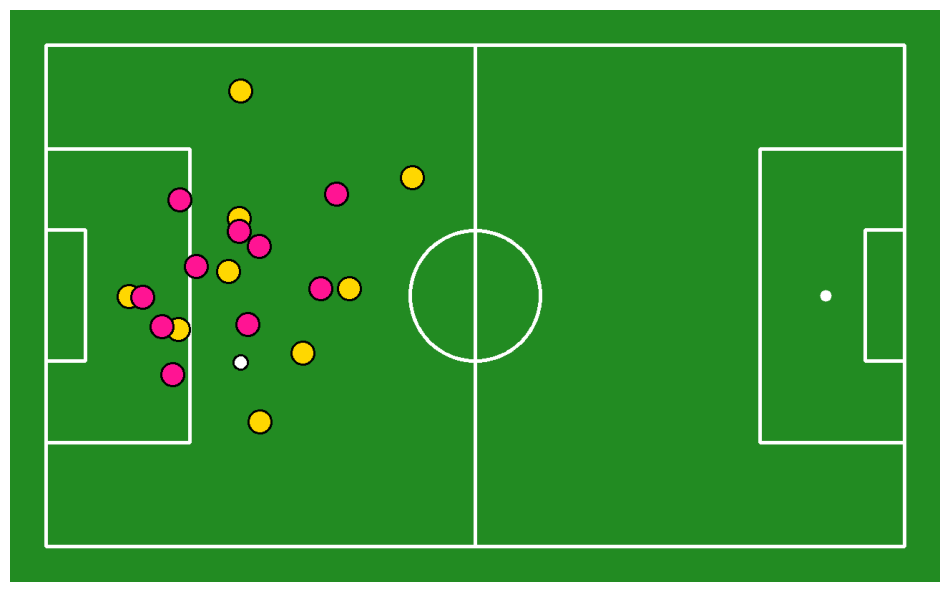

Embedding extraction: 1it [00:01,  1.13s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.13s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 720:
Team 1 (Red Team) - closest distance: 307.3
Team 2 (Yellow Team) - closest distance: 481.2
Current closer team: Red Team
Current possession: Red Team
Challenge in progress: 2/3


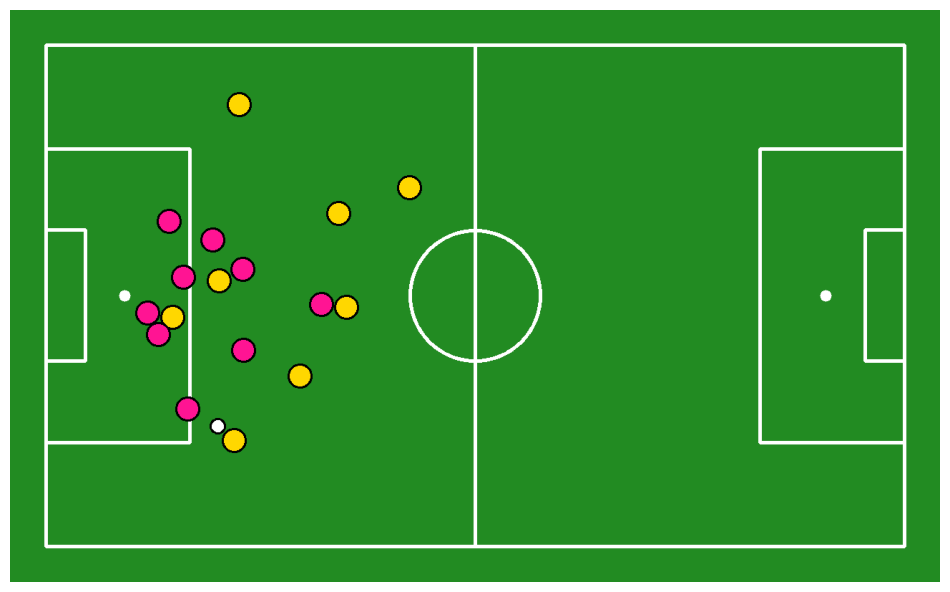

Embedding extraction: 1it [00:01,  1.32s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.30s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 740:
Team 1 (Red Team) - closest distance: 172.2
Team 2 (Yellow Team) - closest distance: 356.4
Current closer team: Red Team
Current possession: Red Team


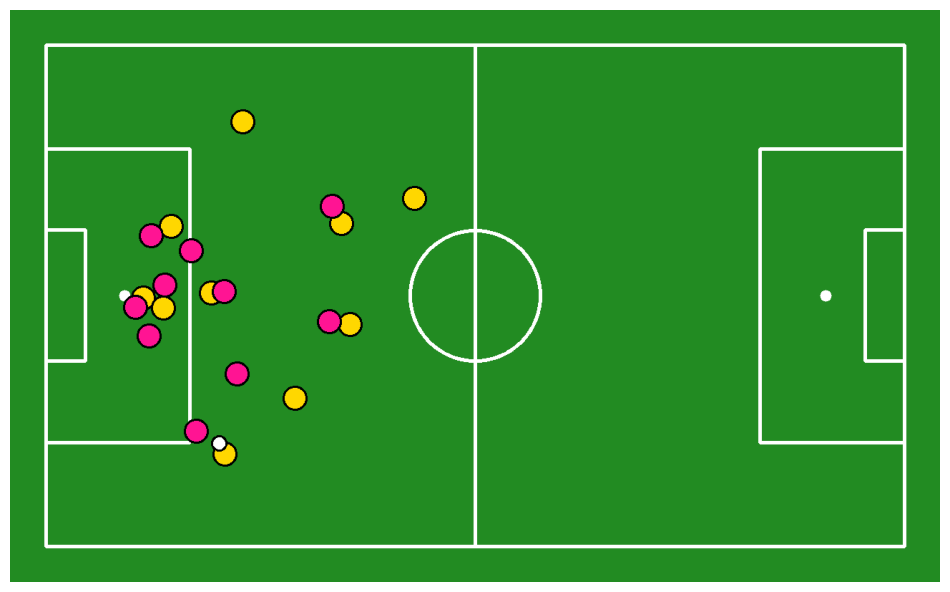

100%|██████████| 38/38 [02:22<00:00,  3.75s/it]


Ball Possession Analysis Results:
Red Team: 100.0%
Yellow Team: 0.0%

Analyzed Frames: 27
Possession threshold: 3 frames

Debug video saved as 'possession_analysis.mp4'


In [124]:
def detect_team_colors(video_path, num_frames=25):
    """Deteck the team colors"""
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frames_to_sample = np.linspace(0, total_frames-1, num_frames, dtype=int)
    
    team_colors = []
    
    for frame_idx in frames_to_sample:
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if not ret:
            continue
            
        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)
        players_detections = detections[detections.class_id == PLAYER_ID]
        
        for xyxy in players_detections.xyxy:
            x1, y1, x2, y2 = map(int, xyxy)
            player_img = frame[y1:y2, x1:x2]
            
            if player_img.size > 0:
                player_img = cv2.cvtColor(player_img, cv2.COLOR_BGR2RGB)
                height = player_img.shape[0]
                player_img = player_img[:height//2]
                
                pixels = player_img.reshape(-1, 3)
                
                if pixels.shape[0] > 0:
                    kmeans = KMeans(n_clusters=1)
                    kmeans.fit(pixels)
                    dominant_color = kmeans.cluster_centers_[0]
                    team_colors.append(dominant_color)
    
    cap.release()
    
    if len(team_colors) < 2:
        return "Team 1", "Team 2", None, None
    
    kmeans = KMeans(n_clusters=2)
    team_clusters = kmeans.fit_predict(team_colors)
    
    team1_color = np.mean([c for i,c in enumerate(team_colors) if team_clusters[i]==0], axis=0)
    team2_color = np.mean([c for i,c in enumerate(team_colors) if team_clusters[i]==1], axis=0)
    
    def get_color_name(rgb):
        colors = {
            'Red': [255,0,0],
            'Blue': [0,0,255], 
            'Green': [0,255,0],
            'Yellow': [255,255,0],
            'White': [255,255,255],
            'Black': [0,0,0]
        }
        
        min_dist = float('inf')
        closest_color = None
        
        for name, value in colors.items():
            dist = np.linalg.norm(rgb - value)
            if dist < min_dist:
                min_dist = dist
                closest_color = name
                
        return closest_color
    
    team1_name = f"{get_color_name(team1_color)} Team"
    team2_name = f"{get_color_name(team2_color)} Team"
    
    return team1_name, team2_name, team1_color, team2_color

def visualize_detection(frame, ball_pos, team1_positions, team2_positions, 
                       team1_color, team2_color, min_dist_team1=None, min_dist_team2=None):
    """Visualize detections for debugging"""
    vis_frame = frame.copy()
    
    if ball_pos is not None:
        cv2.circle(vis_frame, (int(ball_pos[0]), int(ball_pos[1])), 10, (0,255,255), -1)
    
    t1_color = tuple(map(int, team1_color[::-1]))
    for pos in team1_positions:
        cv2.circle(vis_frame, (int(pos[0]), int(pos[1])), 15, t1_color, 2)
    
    t2_color = tuple(map(int, team2_color[::-1]))
    for pos in team2_positions:
        cv2.circle(vis_frame, (int(pos[0]), int(pos[1])), 15, t2_color, 2)
    
    if min_dist_team1 is not None and min_dist_team2 is not None:
        cv2.putText(vis_frame, f"Team 1 dist: {min_dist_team1:.1f}", (10, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 1, t1_color, 2)
        cv2.putText(vis_frame, f"Team 2 dist: {min_dist_team2:.1f}", (10, 70),
                   cv2.FONT_HERSHEY_SIMPLEX, 1, t2_color, 2)
    
    return vis_frame

def train_team_classifier(video_path, stride=30):
    """Train the team classifier"""
    frame_generator = sv.get_video_frames_generator(
        source_path=video_path, stride=stride)

    crops = []
    for frame in tqdm(frame_generator, desc='Collecting player images'):
        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)
        players_detections = detections[detections.class_id == PLAYER_ID]
        players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
        crops += players_crops

    print(f"Total player images collected: {len(crops)}")
    team_classifier = TeamClassifier(device="cpu")
    team_classifier.fit(crops)
    return team_classifier

def get_ball_position(frame):
    """Deteck the ball position"""
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    ball_detections = detections[detections.class_id == BALL_ID]
    
    if len(ball_detections.xyxy) > 0:
        confidences = ball_detections.confidence
        best_ball_idx = np.argmax(confidences)
        return ball_detections.get_anchors_coordinates(sv.Position.CENTER)[best_ball_idx]
    return None

def get_team_positions(frame, team_id, team_classifier):
    """Deteck the positions of players from a specific team"""
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    
    if len(players_detections.xyxy) > 0:
        players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
        team_predictions = team_classifier.predict(players_crops)
        team_mask = team_predictions == team_id
        team_positions = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)[team_mask]
        return team_positions
    return np.array([])

def calculate_possession(ball_pos, team_positions, max_distance=100):
    """Calculate the possession of a team"""
    if len(team_positions) == 0:
        return float('inf'), None
    
    distances = [np.linalg.norm(ball_pos - pos) for pos in team_positions]
    min_dist = np.min(distances)
    closest_player_idx = np.argmin(distances)
    
    if min_dist > max_distance:
        return float('inf'), None
        
    return min_dist, closest_player_idx

def analyze_ball_possession(video_path, stride=1, debug=True, possession_threshold=5):
    """Analyze the ball possession"""
    print("\nStarting ball possession analysis...")
    
    print("\nDetecting team colors...")
    team1_name, team2_name, team1_color, team2_color = detect_team_colors(video_path)
    print(f"Detected teams: {team1_name} vs {team2_name}")
    
    print("\nTraining team classifier...")
    team_classifier = train_team_classifier(video_path, stride=30)
    
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    team1_possession = 0
    team2_possession = 0
    frames_analyzed = 0
    
    current_possession_owner = None
    challenger_buffer = []
    
    if debug:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter('possession_analysis.mp4', fourcc, 30.0, 
                            (int(cap.get(3)), int(cap.get(4))))
    
    print("\nAnalyzing possession...")
    print(f"Using possession threshold of {possession_threshold} frames")
    
    for frame_idx in tqdm(range(0, total_frames, stride)):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if not ret:
            break
            
        ball_pos = get_ball_position(frame)
        team1_positions = get_team_positions(frame, 0, team_classifier)
        team2_positions = get_team_positions(frame, 1, team_classifier)
        
        if ball_pos is not None and len(team1_positions) > 0 and len(team2_positions) > 0:
            # Field detection ve transformasyon
            result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
            key_points = sv.KeyPoints.from_inference(result)

            filter = key_points.confidence[0] > 0.5
            frame_reference_points = key_points.xy[0][filter]
            pitch_reference_points = np.array(CONFIG.vertices)[filter]

            transformer = ViewTransformer(
                source=frame_reference_points,
                target=pitch_reference_points
            )

            # Calculate the ball and players' positions on the pitch
            frame_ball_xy = np.array([ball_pos])
            pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)
            pitch_team1_xy = transformer.transform_points(points=team1_positions)
            pitch_team2_xy = transformer.transform_points(points=team2_positions)

            # Calculate the distance of each team to the ball
            team1_distances = [np.linalg.norm(pos - pitch_ball_xy[0]) for pos in pitch_team1_xy]
            team2_distances = [np.linalg.norm(pos - pitch_ball_xy[0]) for pos in pitch_team2_xy]
            
            min_dist_team1 = min(team1_distances) if team1_distances else float('inf')
            min_dist_team2 = min(team2_distances) if team2_distances else float('inf')
            
            current_closer_team = 1 if min_dist_team1 < min_dist_team2 else 2
            
            # Print frame analysis results
            print(f"\nFrame {frame_idx}:")
            print(f"Team 1 ({team1_name}) - closest distance: {min_dist_team1:.1f}")
            print(f"Team 2 ({team2_name}) - closest distance: {min_dist_team2:.1f}")
            print(f"Current closer team: {team1_name if current_closer_team == 1 else team2_name}")
            print(f"Current possession: {team1_name if current_possession_owner == 1 else team2_name}")
            if challenger_buffer:
                print(f"Challenge in progress: {len(challenger_buffer)}/{possession_threshold}")

            # Draw the pitch
            pitch_frame = draw_pitch(CONFIG)
            
            # Draw the teams
            pitch_frame = draw_points_on_pitch(
                config=CONFIG,
                xy=pitch_team1_xy,
                face_color=sv.Color.from_hex('FFD700'),  # Yellow
                edge_color=sv.Color.BLACK,
                radius=16,
                pitch=pitch_frame)
            
            pitch_frame = draw_points_on_pitch(
                config=CONFIG,
                xy=pitch_team2_xy,
                face_color=sv.Color.from_hex('FF1493'),  # Pembe/Kırmızı
                edge_color=sv.Color.BLACK,
                radius=16,
                pitch=pitch_frame)
            
            # Draw the ball
            pitch_frame = draw_points_on_pitch(
                config=CONFIG,
                xy=pitch_ball_xy,
                face_color=sv.Color.WHITE,
                edge_color=sv.Color.BLACK,
                radius=10,
                pitch=pitch_frame)

            if current_possession_owner is None:
                current_possession_owner = current_closer_team
                challenger_buffer = []
            
            if current_closer_team != current_possession_owner:
                challenger_buffer.append(current_closer_team)
                
                if len(challenger_buffer) > possession_threshold:
                    challenger_buffer.pop(0)
            else:
                challenger_buffer = []
            
            if len(challenger_buffer) == possession_threshold:
                if all(x == challenger_buffer[0] for x in challenger_buffer):
                    current_possession_owner = challenger_buffer[0]
                    challenger_buffer = []
            
            if current_possession_owner == 1:
                team1_possession += 1
            else:
                team2_possession += 1
            
            frames_analyzed += 1
            
            if debug:
                vis_frame = visualize_detection(frame, ball_pos, team1_positions, team2_positions,
                                              team1_color, team2_color, min_dist_team1, min_dist_team2)
                
                owner_name = team1_name if current_possession_owner == 1 else team2_name
                cv2.putText(vis_frame, f"Possession: {owner_name}", (10, 110),
                          cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
                
                if challenger_buffer:
                    challenger_name = team1_name if challenger_buffer[-1] == 1 else team2_name
                    buffer_text = f"Challenge: {challenger_name} ({len(challenger_buffer)}/{possession_threshold})"
                    cv2.putText(vis_frame, buffer_text, (10, 150),
                              cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
                
                out.write(vis_frame)
            
            sv.plot_image(pitch_frame)
    
    if debug:
        out.release()
    cap.release()
    
    if frames_analyzed > 0:
        team1_percentage = (team1_possession / frames_analyzed) * 100
        team2_percentage = (team2_possession / frames_analyzed) * 100
        
        print(f"\nBall Possession Analysis Results:")
        print(f"{team1_name}: {team1_percentage:.1f}%")
        print(f"{team2_name}: {team2_percentage:.1f}%")
        print(f"\nAnalyzed Frames: {frames_analyzed}")
        print(f"Possession threshold: {possession_threshold} frames")
        print("\nDebug video saved as 'possession_analysis.mp4'")
    else:
        print("\nNo valid frames for possession analysis")

# Fixed variables
BALL_ID = 0
PLAYER_ID = 2

# Run the analysis
video_path = "YOUR VIDEO PATH"
analyze_ball_possession(video_path, stride=20, debug=True, possession_threshold=3)

# Ball Zone Analysis 🏟️

## Overview
This section analyzes the ball's movement patterns by dividing the pitch into three distinct zones:



Starting ball zone analysis...

Pitch length: 12000.0
Zone length: 4000.0


  0%|          | 0/30 [00:00<?, ?it/s]


Frame 0:
Ball zone: Middle Zone
Ball position (x, y): (6329.8, 302.0)


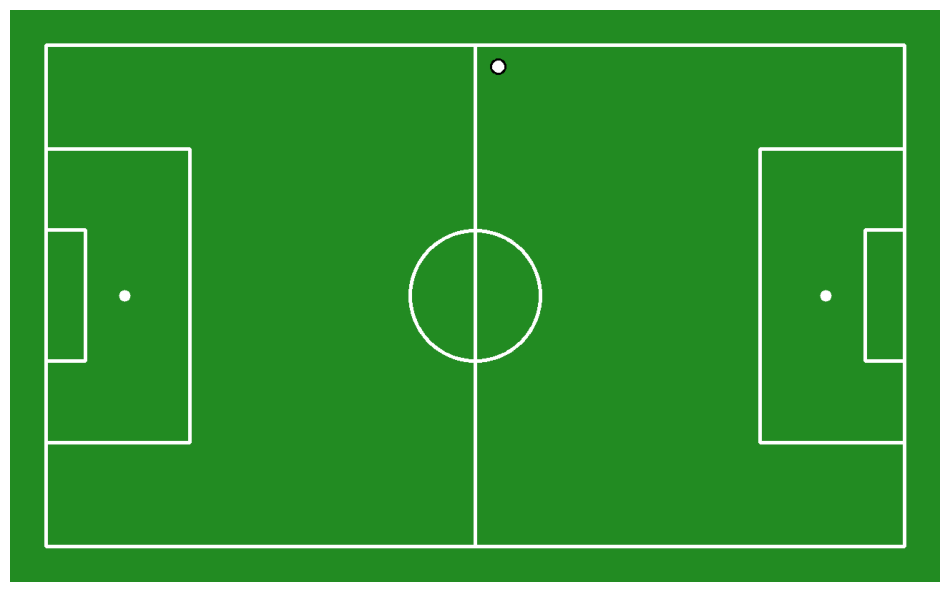

  7%|▋         | 2/30 [00:00<00:12,  2.23it/s]


Frame 50:
Ball zone: Middle Zone
Ball position (x, y): (5490.6, 3403.0)


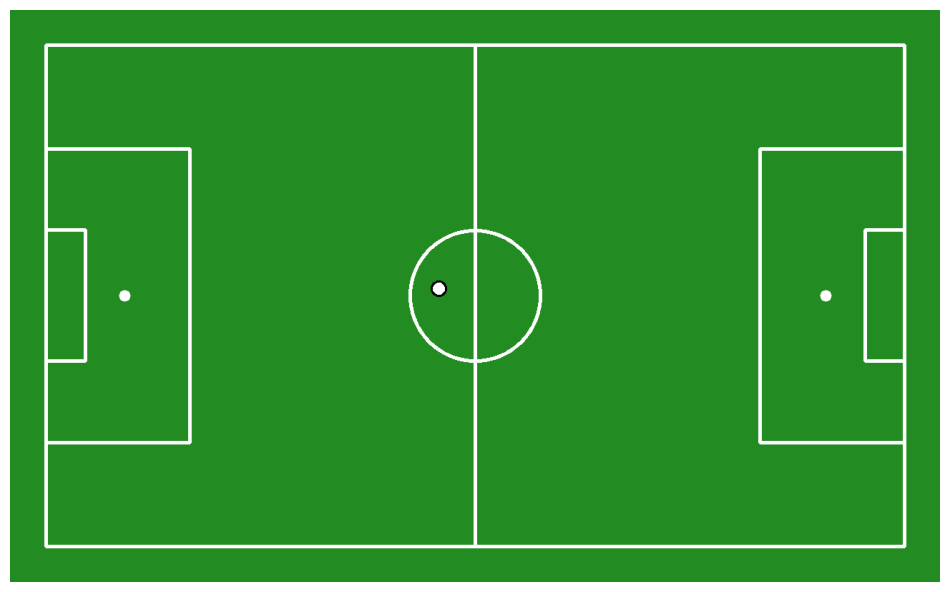

 13%|█▎        | 4/30 [00:01<00:10,  2.38it/s]


Frame 100:
Ball zone: Middle Zone
Ball position (x, y): (4859.3, 4131.8)


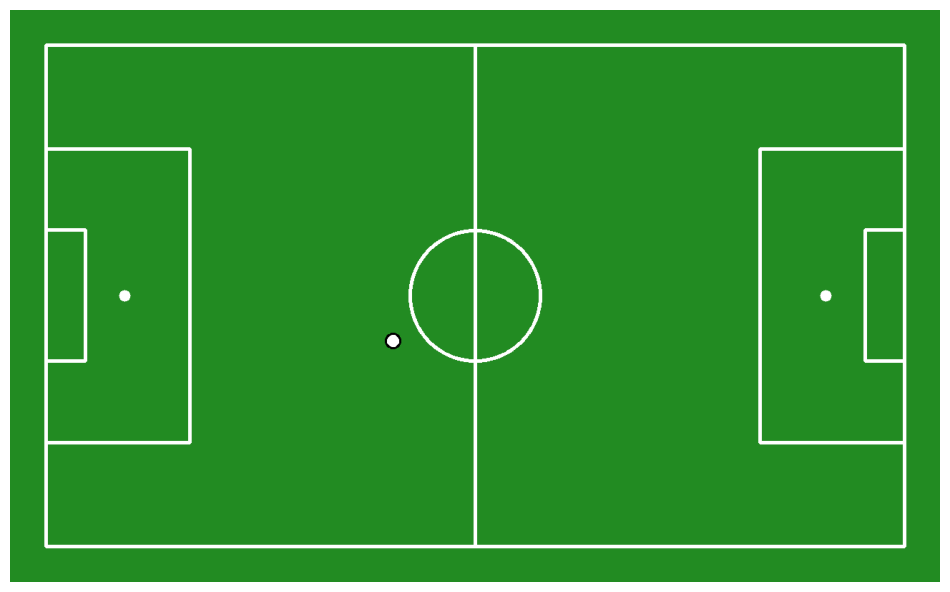

 20%|██        | 6/30 [00:02<00:10,  2.31it/s]


Frame 150:
Ball zone: Middle Zone
Ball position (x, y): (5265.3, 5237.9)


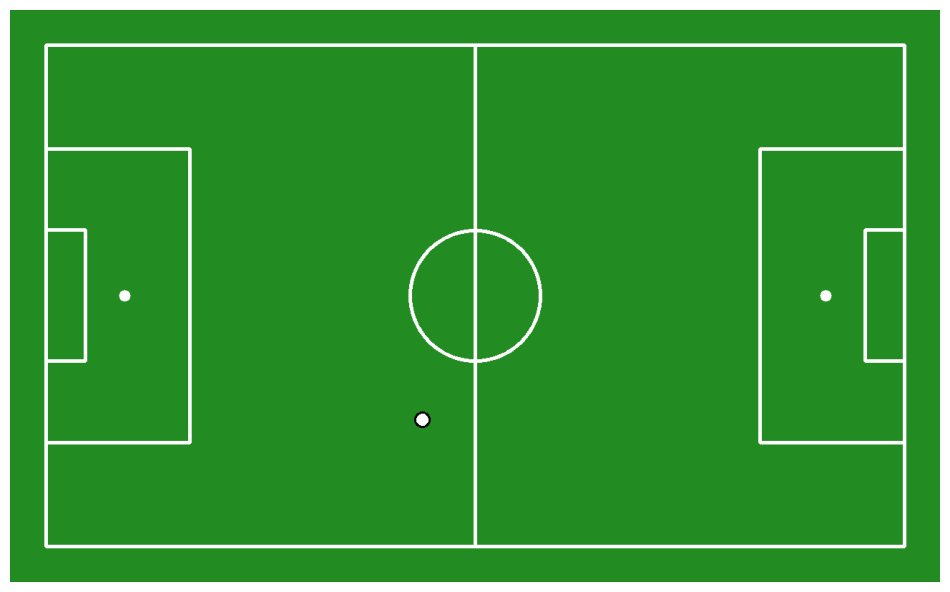

 23%|██▎       | 7/30 [00:03<00:10,  2.14it/s]


Frame 175:
Ball zone: Middle Zone
Ball position (x, y): (5226.6, 5812.4)


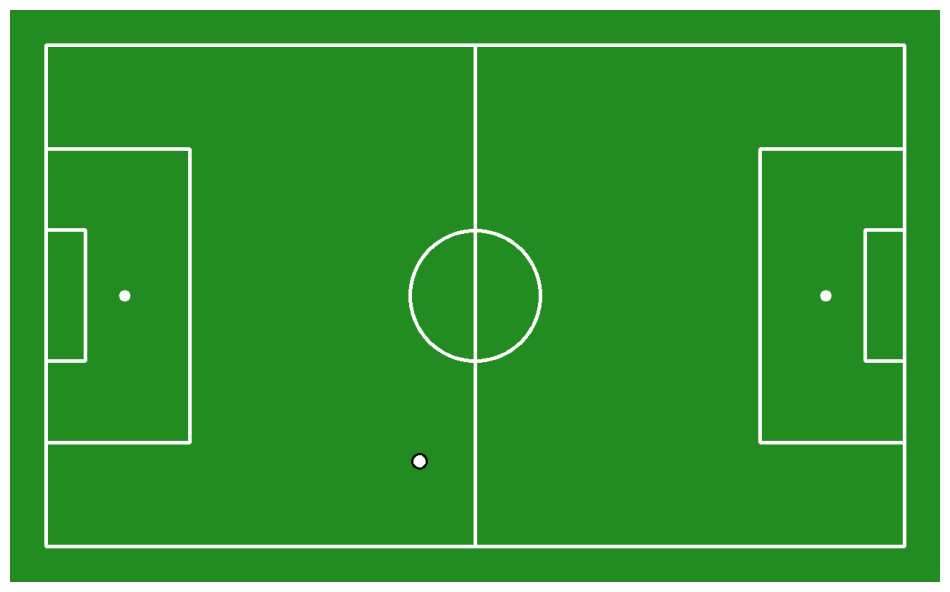

 27%|██▋       | 8/30 [00:03<00:11,  1.93it/s]


Frame 200:
Ball zone: Middle Zone
Ball position (x, y): (4447.3, 5455.7)


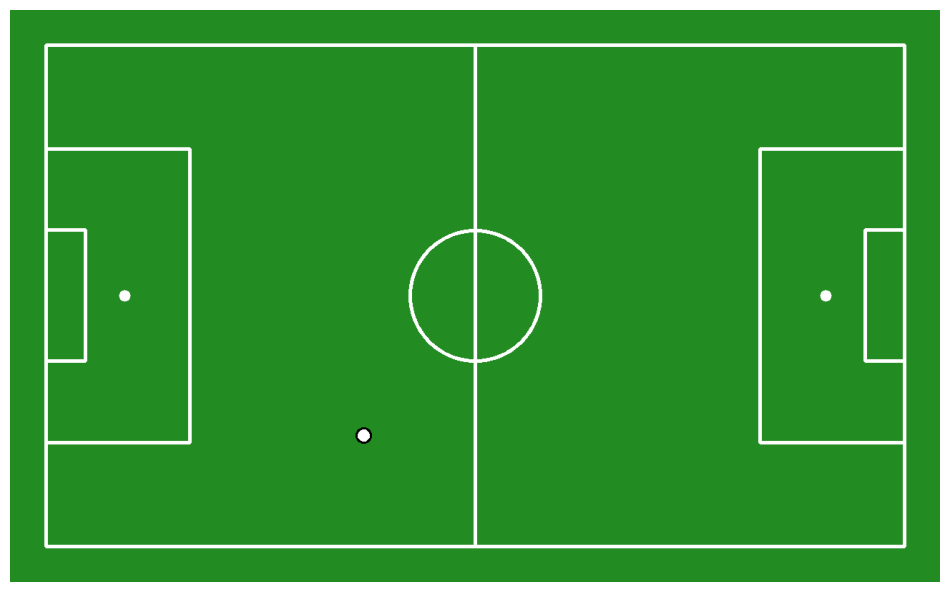

 30%|███       | 9/30 [00:04<00:11,  1.79it/s]


Frame 225:
Ball zone: Left Zone
Ball position (x, y): (3785.8, 4947.7)


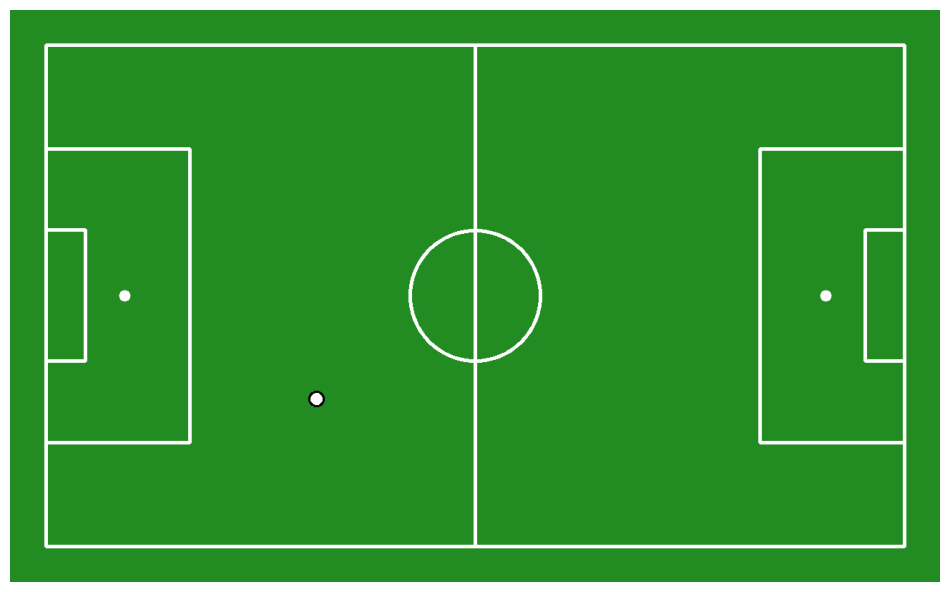

 37%|███▋      | 11/30 [00:05<00:11,  1.71it/s]


Frame 275:
Ball zone: Left Zone
Ball position (x, y): (3797.3, 4412.9)


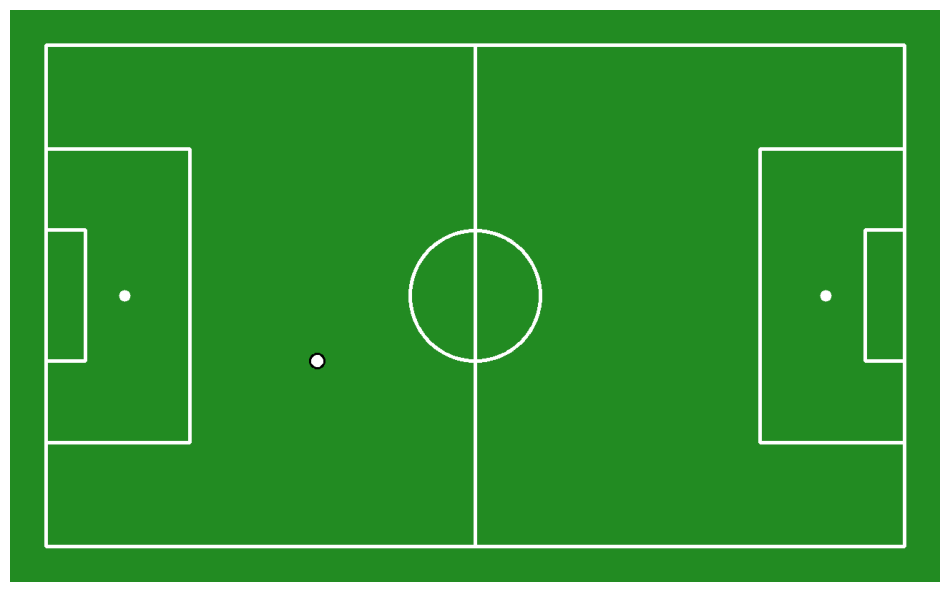

 40%|████      | 12/30 [00:06<00:09,  1.90it/s]


Frame 300:
Ball zone: Middle Zone
Ball position (x, y): (4740.9, 3903.2)


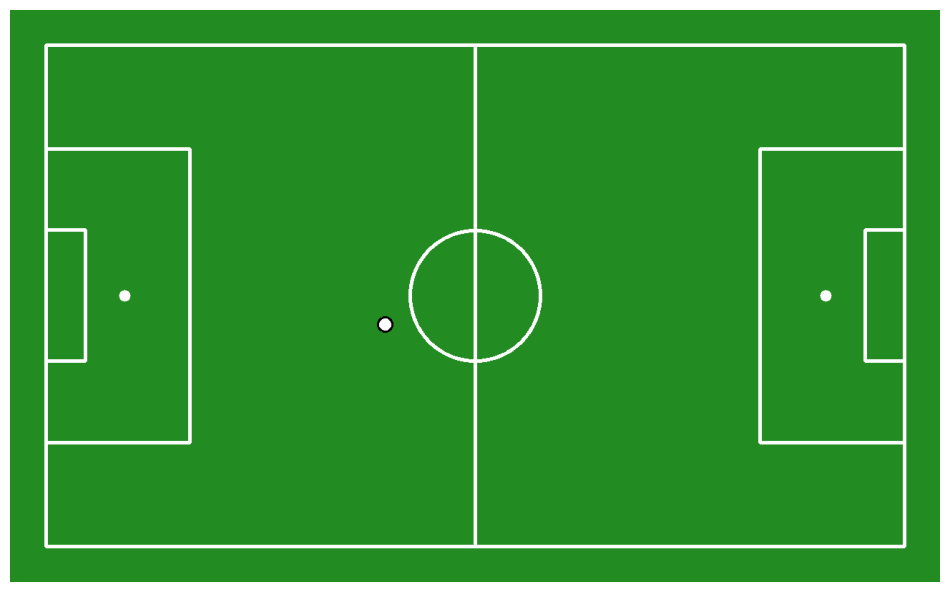

 43%|████▎     | 13/30 [00:06<00:08,  1.97it/s]


Frame 325:
Ball zone: Middle Zone
Ball position (x, y): (5573.2, 3479.7)


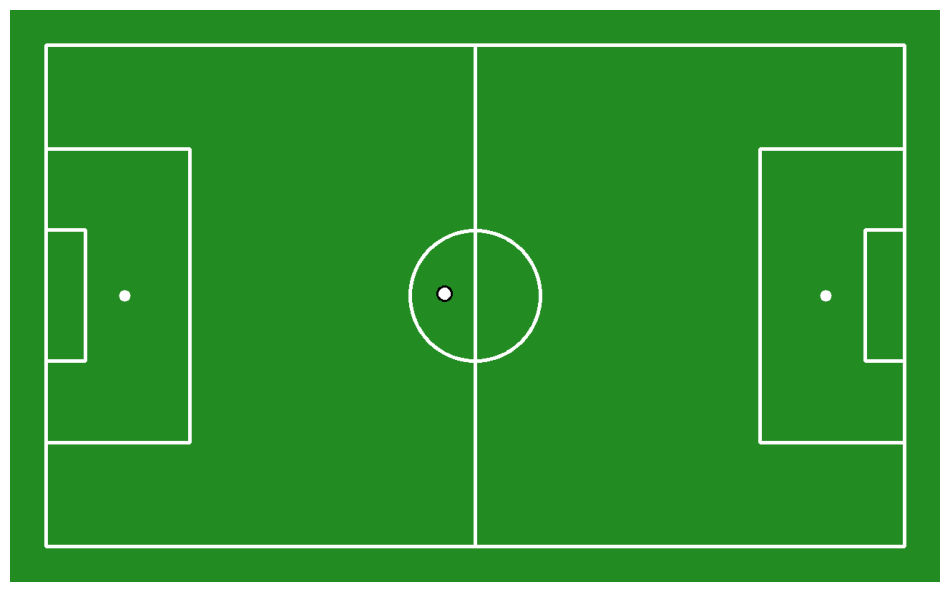

 50%|█████     | 15/30 [00:07<00:07,  2.12it/s]


Frame 375:
Ball zone: Middle Zone
Ball position (x, y): (6113.3, 2297.8)


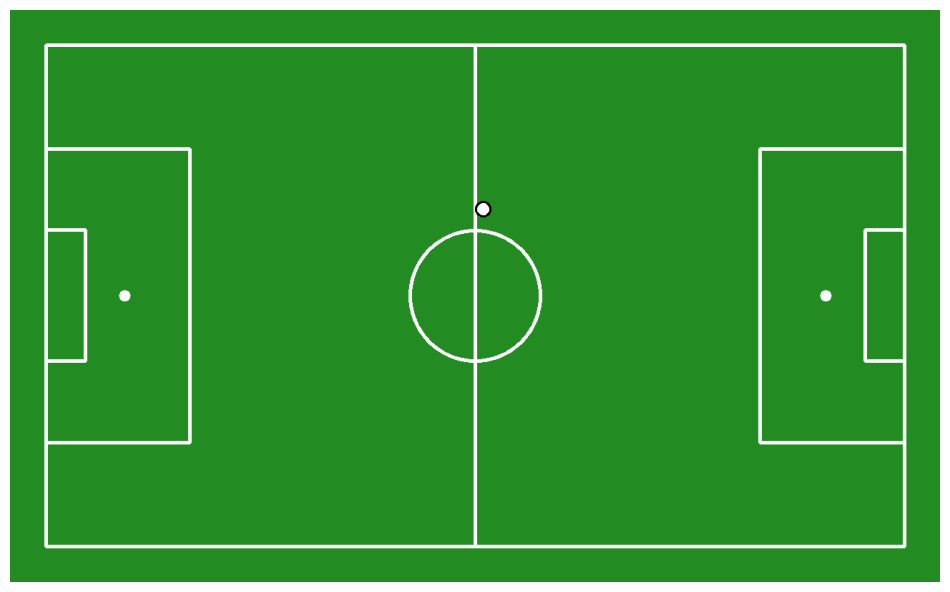

 53%|█████▎    | 16/30 [00:07<00:06,  2.06it/s]


Frame 400:
Ball zone: Middle Zone
Ball position (x, y): (5080.3, 827.0)


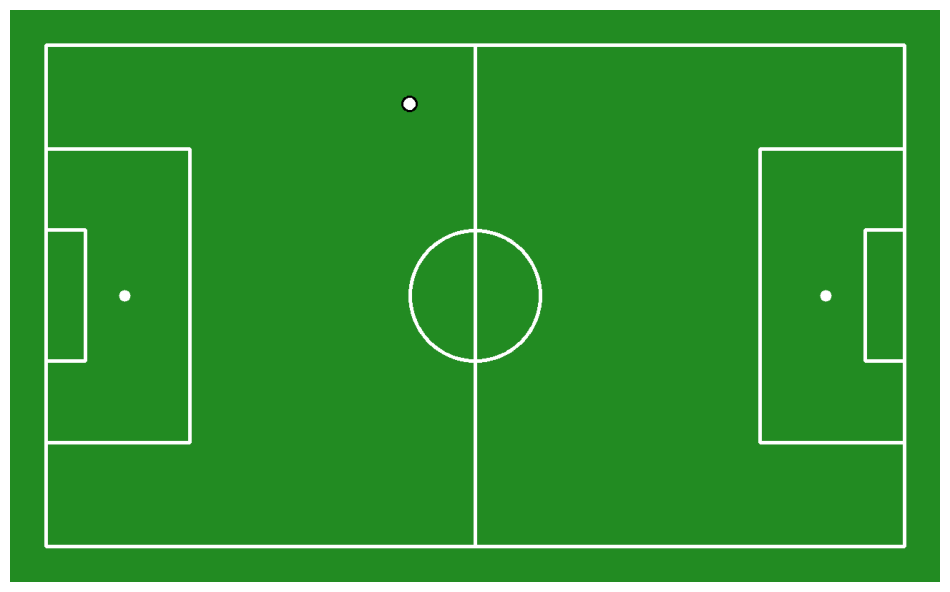

 57%|█████▋    | 17/30 [00:08<00:07,  1.82it/s]


Frame 425:
Ball zone: Middle Zone
Ball position (x, y): (4546.7, 206.8)


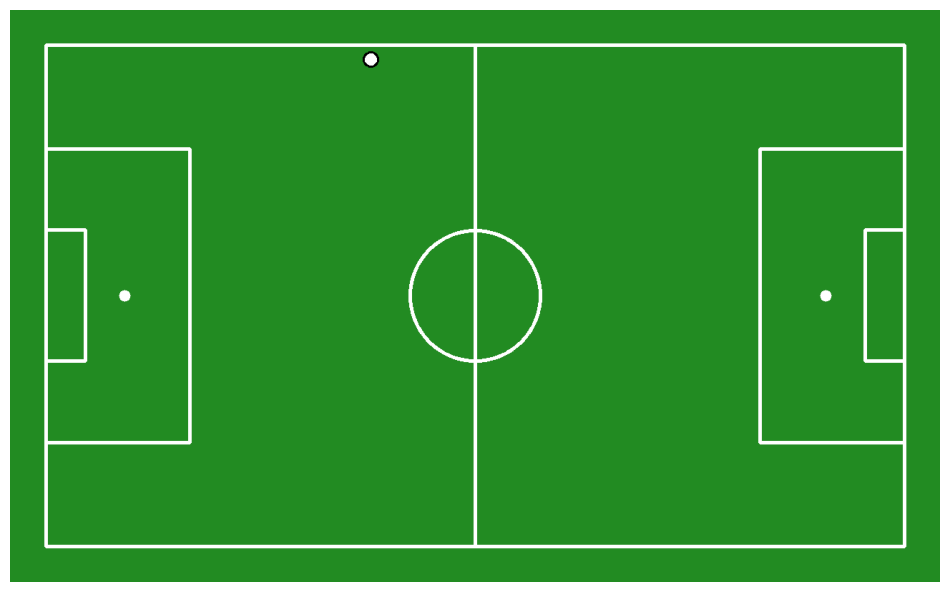

 73%|███████▎  | 22/30 [00:11<00:03,  2.22it/s]


Frame 550:
Ball zone: Left Zone
Ball position (x, y): (2838.7, 483.4)


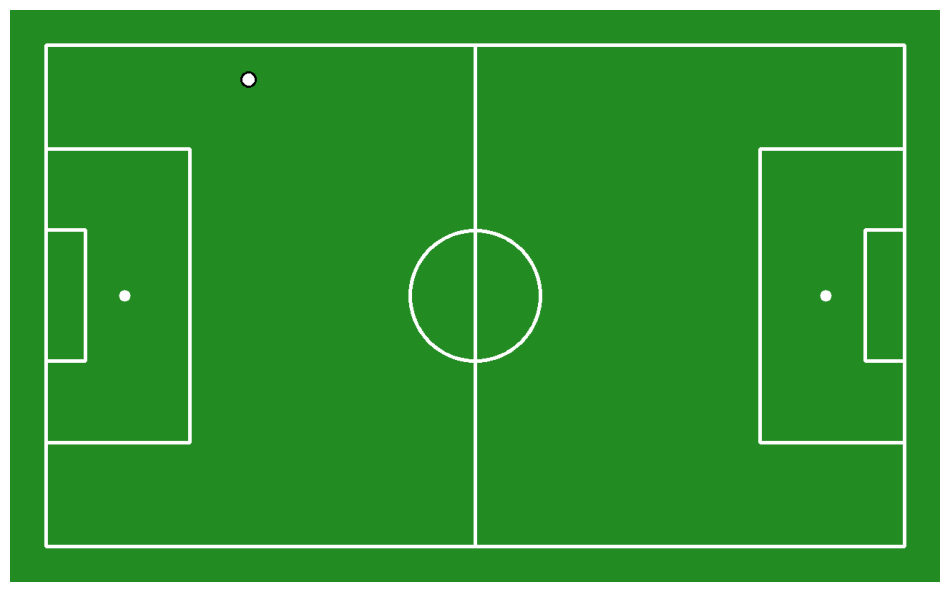

 80%|████████  | 24/30 [00:11<00:02,  2.37it/s]


Frame 600:
Ball zone: Left Zone
Ball position (x, y): (2817.8, 977.3)


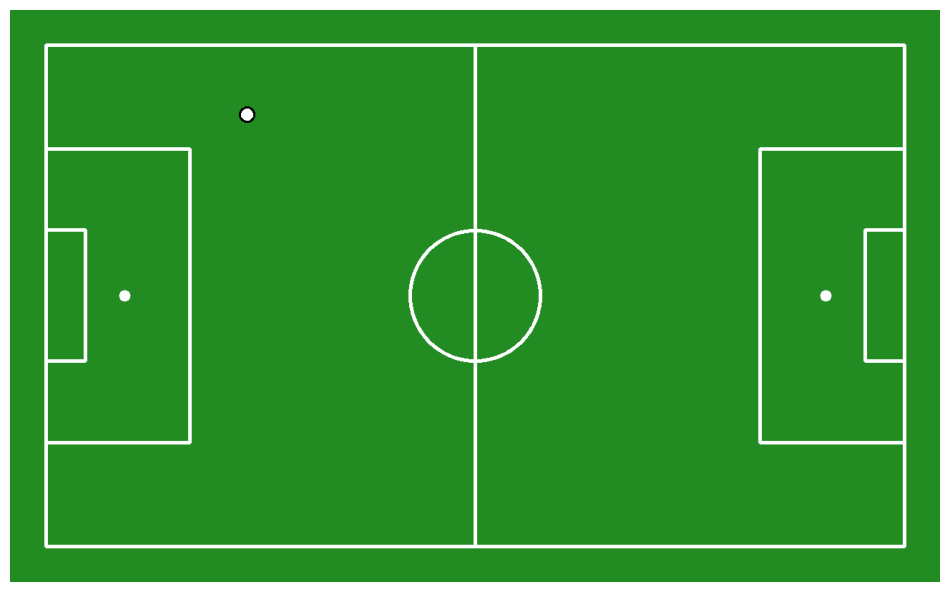

 87%|████████▋ | 26/30 [00:12<00:01,  2.29it/s]


Frame 650:
Ball zone: Left Zone
Ball position (x, y): (2911.6, 1901.6)


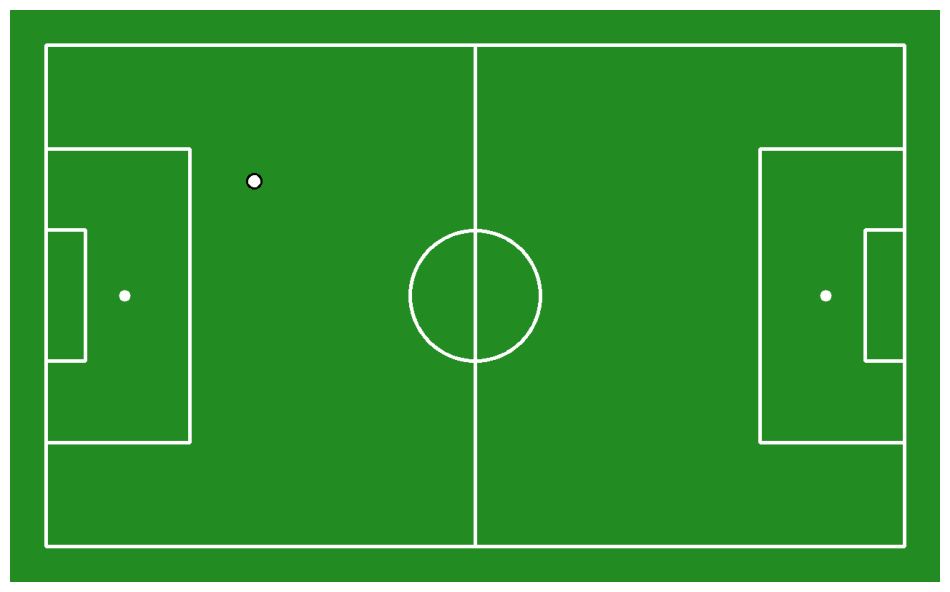

 90%|█████████ | 27/30 [00:13<00:01,  2.12it/s]


Frame 675:
Ball zone: Left Zone
Ball position (x, y): (2586.1, 2014.3)


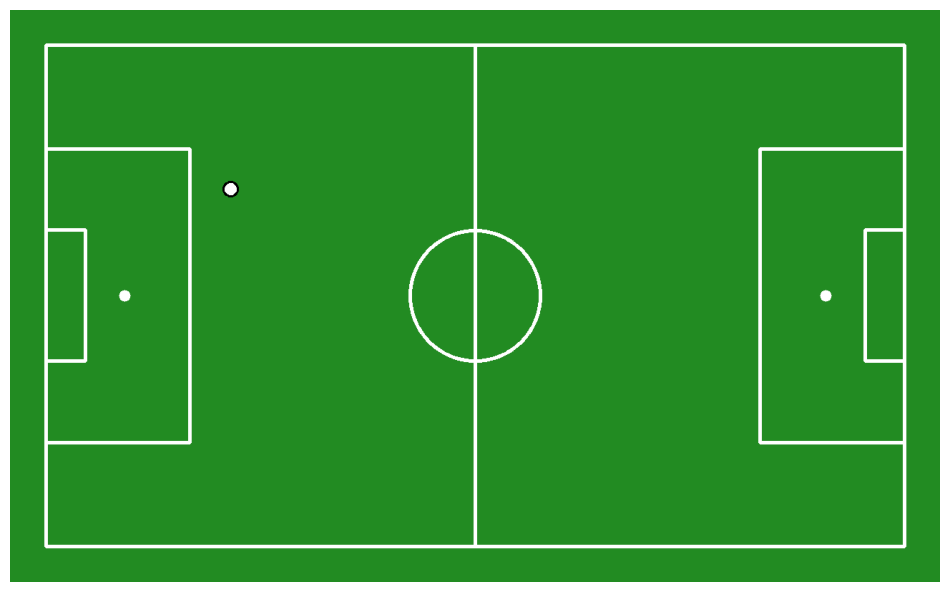

 93%|█████████▎| 28/30 [00:14<00:01,  1.91it/s]


Frame 700:
Ball zone: Left Zone
Ball position (x, y): (2730.0, 4435.7)


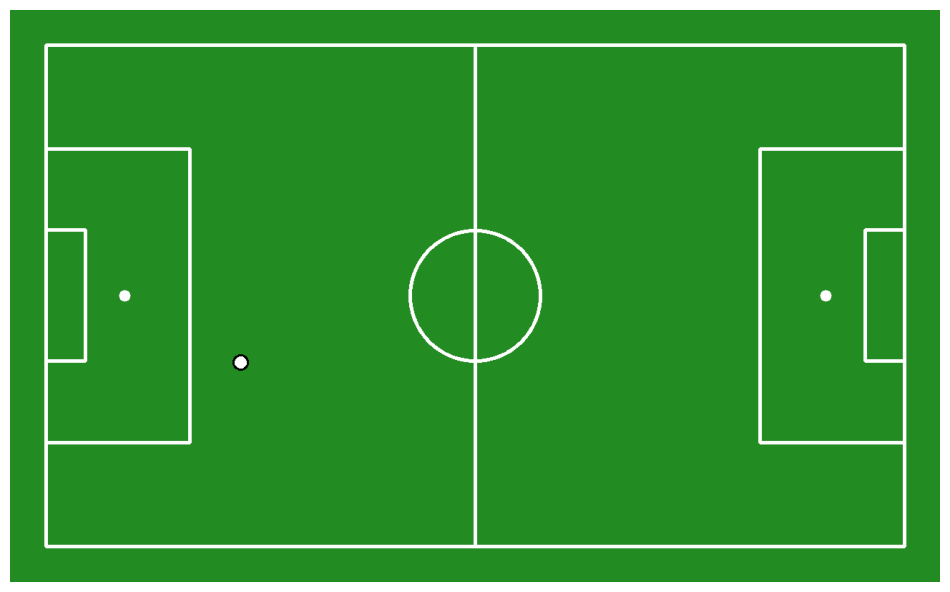

 97%|█████████▋| 29/30 [00:14<00:00,  1.78it/s]


Frame 725:
Ball zone: Left Zone
Ball position (x, y): (2390.9, 3257.2)


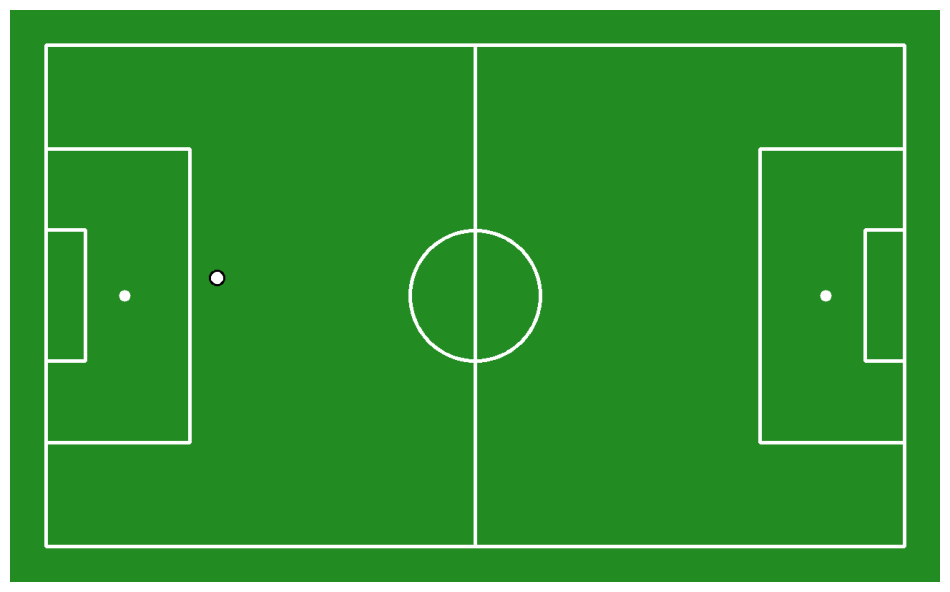

100%|██████████| 30/30 [00:15<00:00,  1.95it/s]


Ball Zone Analysis Results:
Left Zone: 42.1%
Middle Zone: 57.9%
Right Zone: 0.0%

Analyzed Frames: 19


In [125]:
def analyze_ball_zones(video_path, stride=1, debug=True):
    """Analyze the ball's movement patterns by dividing the pitch into three distinct zones"""
    print("\nStarting ball zone analysis...")
    
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Zone counters
    left_zone_count = 0
    middle_zone_count = 0
    right_zone_count = 0
    frames_analyzed = 0
    
    # Get the pitch dimensions
    pitch_vertices = np.array(CONFIG.vertices)
    pitch_length = np.max(pitch_vertices[:, 0]) - np.min(pitch_vertices[:, 0])
    zone_length = pitch_length / 3
    
    print(f"\nPitch length: {pitch_length:.1f}")
    print(f"Zone length: {zone_length:.1f}")
    
    for frame_idx in tqdm(range(0, total_frames, stride)):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if not ret:
            break
            
        ball_pos = get_ball_position(frame)
        
        if ball_pos is not None:
            # Field detection and transformation
            result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
            key_points = sv.KeyPoints.from_inference(result)

            filter = key_points.confidence[0] > 0.5
            frame_reference_points = key_points.xy[0][filter]
            pitch_reference_points = np.array(CONFIG.vertices)[filter]

            transformer = ViewTransformer(
                source=frame_reference_points,
                target=pitch_reference_points
            )

            # Convert the ball coordinates to pitch coordinates
            frame_ball_xy = np.array([ball_pos])
            pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)
            
            # Determine which zone the ball is in based on its x coordinate
            ball_x = pitch_ball_xy[0][0]
            min_x = np.min(pitch_vertices[:, 0])
            
            current_zone = ""
            if ball_x < (min_x + zone_length):
                left_zone_count += 1
                current_zone = "Left Zone"
            elif ball_x < (min_x + 2 * zone_length):
                middle_zone_count += 1
                current_zone = "Middle Zone"
            else:
                right_zone_count += 1
                current_zone = "Right Zone"
                
            frames_analyzed += 1
            
            # Draw the pitch
            pitch_frame = draw_pitch(CONFIG)
            
            # Draw the zone lines
            first_line_x = int(min_x + zone_length)
            second_line_x = int(min_x + 2 * zone_length)
            
            pitch_frame = cv2.line(pitch_frame, 
                                 (first_line_x, 0), 
                                 (first_line_x, int(np.max(pitch_vertices[:, 1]))),
                                 (255,255,255), 2)
            pitch_frame = cv2.line(pitch_frame, 
                                 (second_line_x, 0), 
                                 (second_line_x, int(np.max(pitch_vertices[:, 1]))),
                                 (255,255,255), 2)
            
            # Draw the ball
            pitch_frame = draw_points_on_pitch(
                config=CONFIG,
                xy=pitch_ball_xy,
                face_color=sv.Color.WHITE,
                edge_color=sv.Color.BLACK,
                radius=10,
                pitch=pitch_frame)
            
            # Print frame information
            print(f"\nFrame {frame_idx}:")
            print(f"Ball zone: {current_zone}")
            print(f"Ball position (x, y): ({pitch_ball_xy[0][0]:.1f}, {pitch_ball_xy[0][1]:.1f})")
            
            # Show the pitch
            sv.plot_image(pitch_frame)
    
    cap.release()
    
    if frames_analyzed > 0:
        left_percentage = (left_zone_count / frames_analyzed) * 100
        middle_percentage = (middle_zone_count / frames_analyzed) * 100
        right_percentage = (right_zone_count / frames_analyzed) * 100
        
        print(f"\nBall Zone Analysis Results:")
        print(f"Left Zone: {left_percentage:.1f}%")
        print(f"Middle Zone: {middle_percentage:.1f}%")
        print(f"Right Zone: {right_percentage:.1f}%")
        print(f"\nAnalyzed Frames: {frames_analyzed}")
    else:
        print("\nNo valid frames for zone analysis")

# Run the analysis
video_path = "YOUR VIDEO PATH"
analyze_ball_zones(video_path, stride=25)

# Team Side Analysis 🏃‍♂️⚽️

## Overview
This section focuses on determining which team defends which goal by analyzing player positions and movements throughout the match.

### Key Components:
- **Team Color Detection** 🎨
  - Identifies distinctive colors for each team
  - Classifies teams as Team 1 and Team 2

- **Position Tracking** 📍
  - Tracks player positions on the pitch
  - Maps coordinates to real field dimensions
  - Analyzes player distribution between halves

- **Classification Model** 🤖
  - Uses trained classifier to identify team membership
  - Processes video frames at specified intervals
  - Maintains accuracy through varying conditions

### Process Flow:
1. Load video input
2. Detect team colors and jerseys
3. Train team classifier
4. Track player positions
5. Analyze spatial distribution
6. Determine defensive sides

### Output:
- Team identification (Red/Yellow)
- Defensive half assignments
- Position heat maps
- Statistical analysis

---
*Note: This analysis helps understand team formations and tactical setups during the match.*



Starting team sides analysis...

Detecting team colors...
Detected teams: Yellow Team vs Red Team

Training team classifier...


Total player images collected: 478


Embedding extraction: 15it [00:32,  2.18s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Analyzing team positions...


Embedding extraction: 1it [00:01,  1.52s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.27s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 0:
Left half - Yellow Team: 4 players, Red Team: 6 players
Right half - Yellow Team: 4 players, Red Team: 4 players


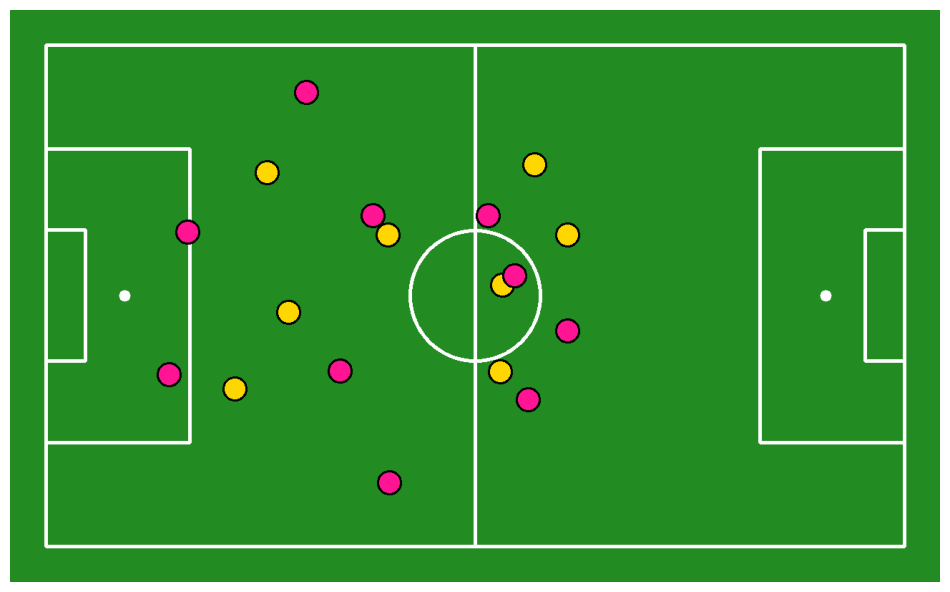

Embedding extraction: 1it [00:01,  1.41s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.40s/it]


Frame 30:
Left half - Yellow Team: 4 players, Red Team: 6 players
Right half - Yellow Team: 6 players, Red Team: 3 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



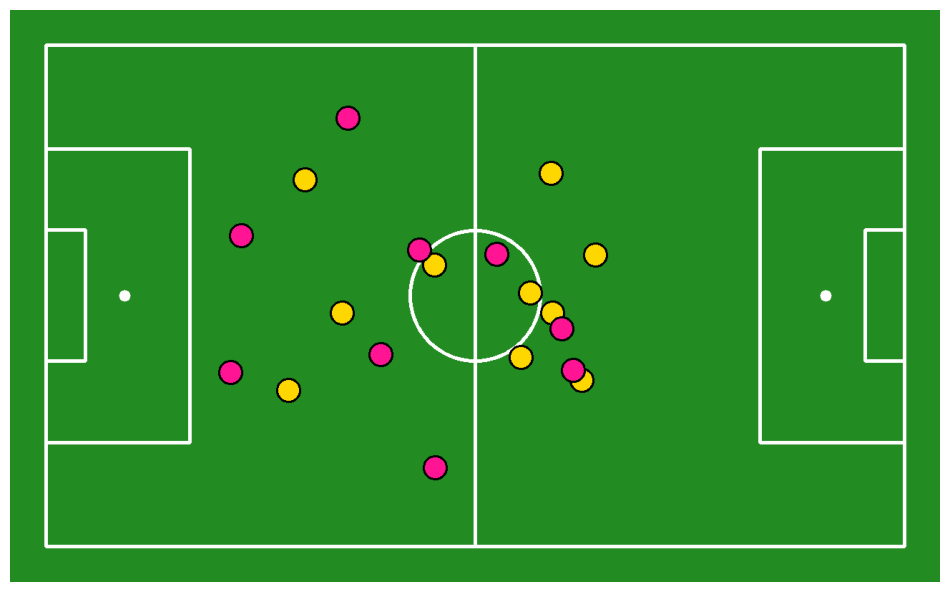

Embedding extraction: 1it [00:01,  1.30s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.52s/it]


Frame 60:
Left half - Yellow Team: 4 players, Red Team: 6 players
Right half - Yellow Team: 6 players, Red Team: 3 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



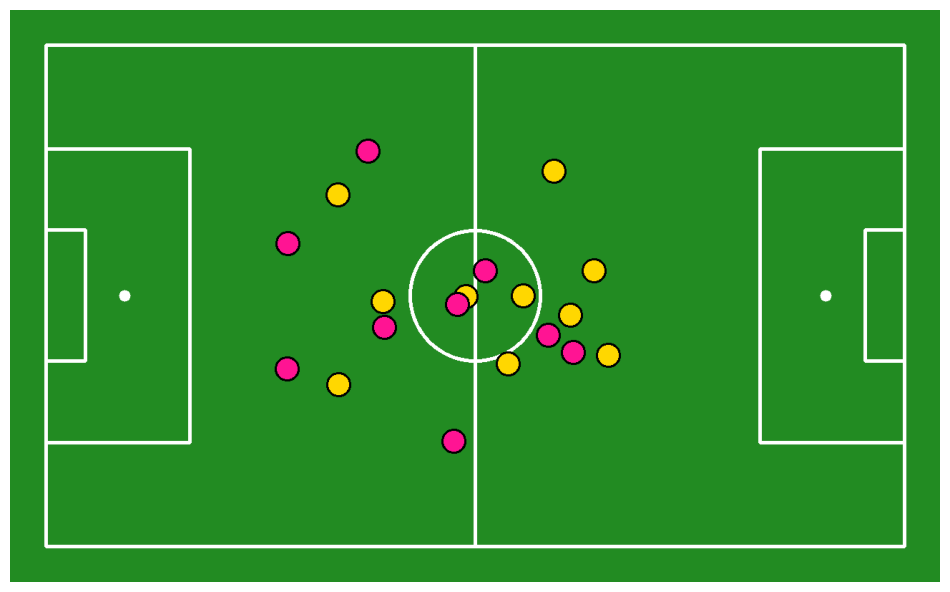

Embedding extraction: 1it [00:01,  1.59s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.47s/it]


Frame 90:
Left half - Yellow Team: 4 players, Red Team: 7 players
Right half - Yellow Team: 6 players, Red Team: 3 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



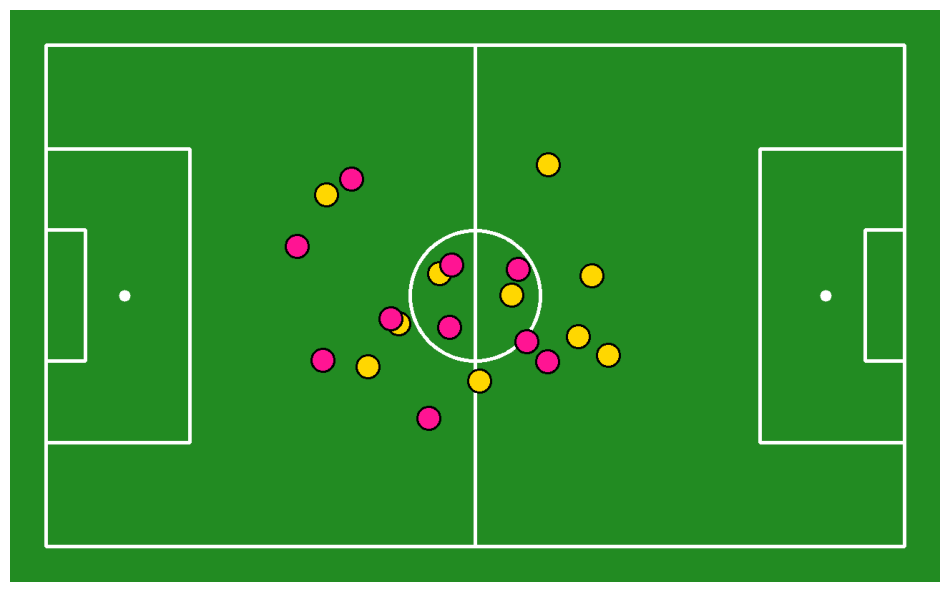

Embedding extraction: 1it [00:01,  1.63s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.41s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 120:
Left half - Yellow Team: 5 players, Red Team: 7 players
Right half - Yellow Team: 5 players, Red Team: 3 players


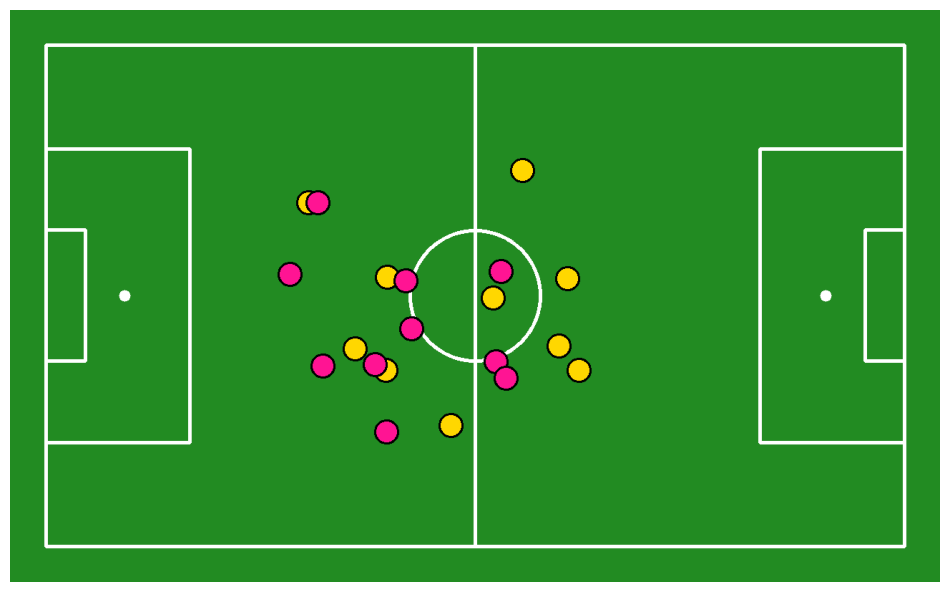

Embedding extraction: 1it [00:01,  1.53s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.60s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 150:
Left half - Yellow Team: 6 players, Red Team: 9 players
Right half - Yellow Team: 4 players, Red Team: 1 players


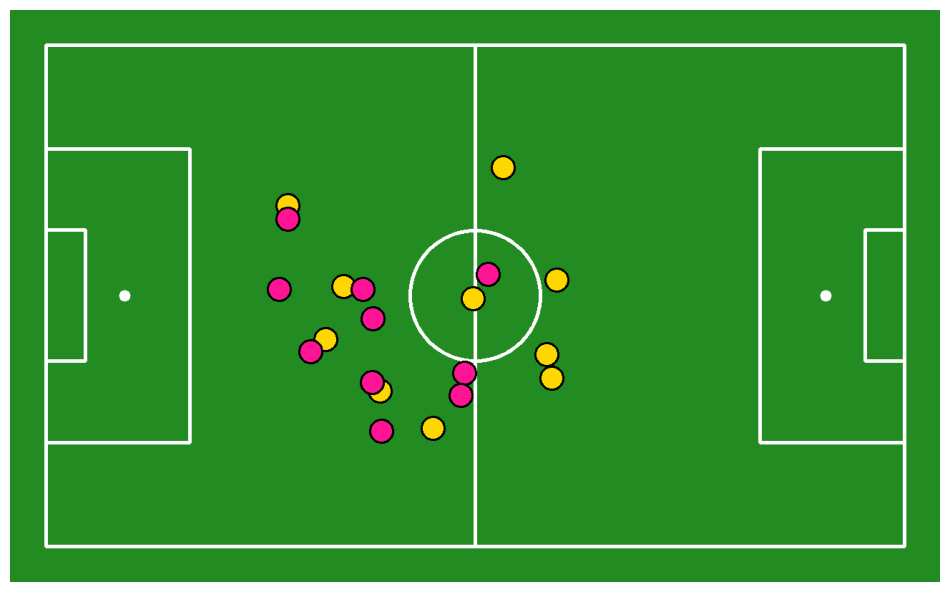

Embedding extraction: 1it [00:01,  1.53s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.63s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 180:
Left half - Yellow Team: 6 players, Red Team: 9 players
Right half - Yellow Team: 4 players, Red Team: 1 players


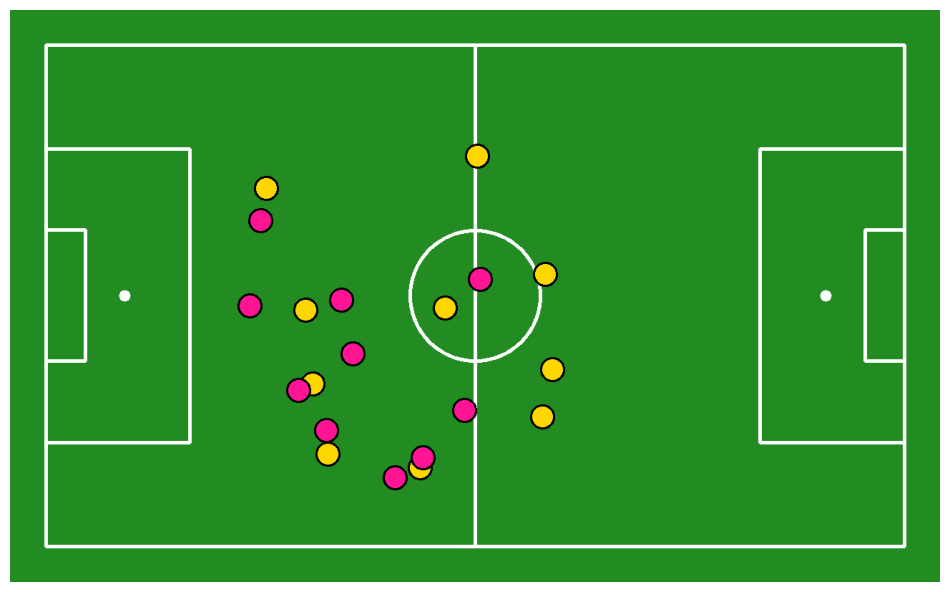

Embedding extraction: 1it [00:01,  1.46s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.44s/it]


Frame 210:
Left half - Yellow Team: 6 players, Red Team: 10 players
Right half - Yellow Team: 3 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



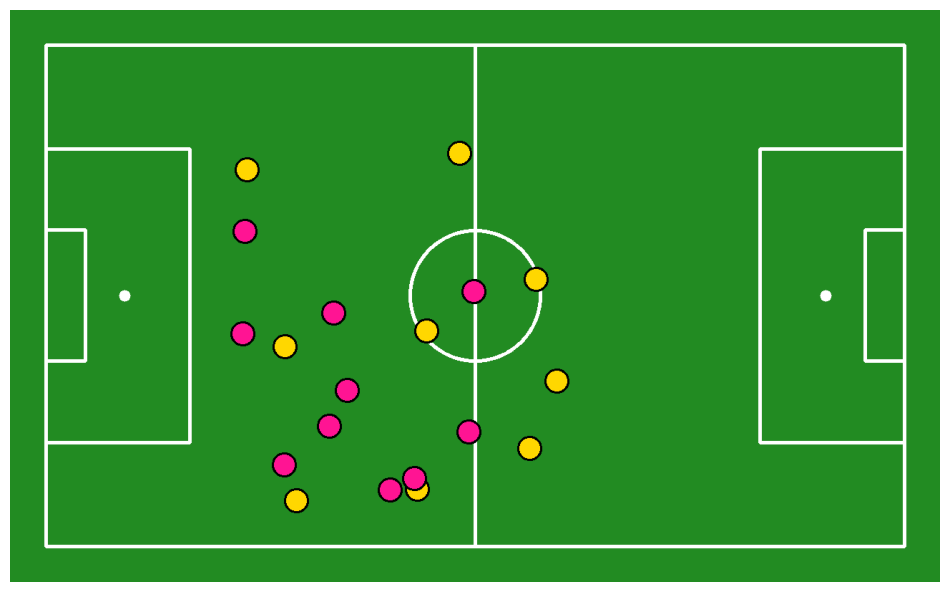

Embedding extraction: 1it [00:01,  1.50s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.50s/it]


Frame 240:
Left half - Yellow Team: 7 players, Red Team: 10 players
Right half - Yellow Team: 3 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



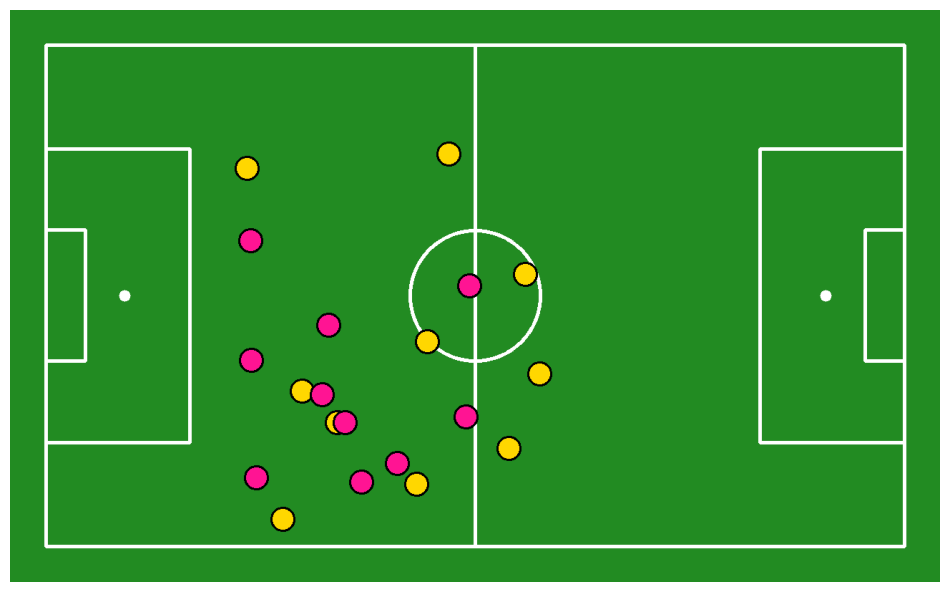

Embedding extraction: 1it [00:01,  1.51s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.48s/it]


Frame 270:
Left half - Yellow Team: 7 players, Red Team: 10 players
Right half - Yellow Team: 3 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



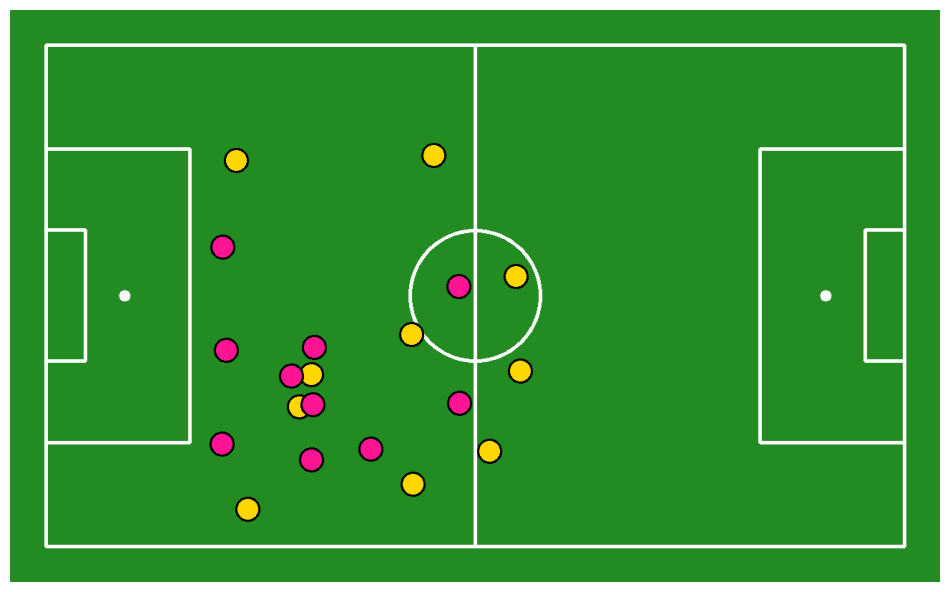

Embedding extraction: 1it [00:01,  1.53s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.54s/it]


Frame 300:
Left half - Yellow Team: 8 players, Red Team: 10 players
Right half - Yellow Team: 2 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



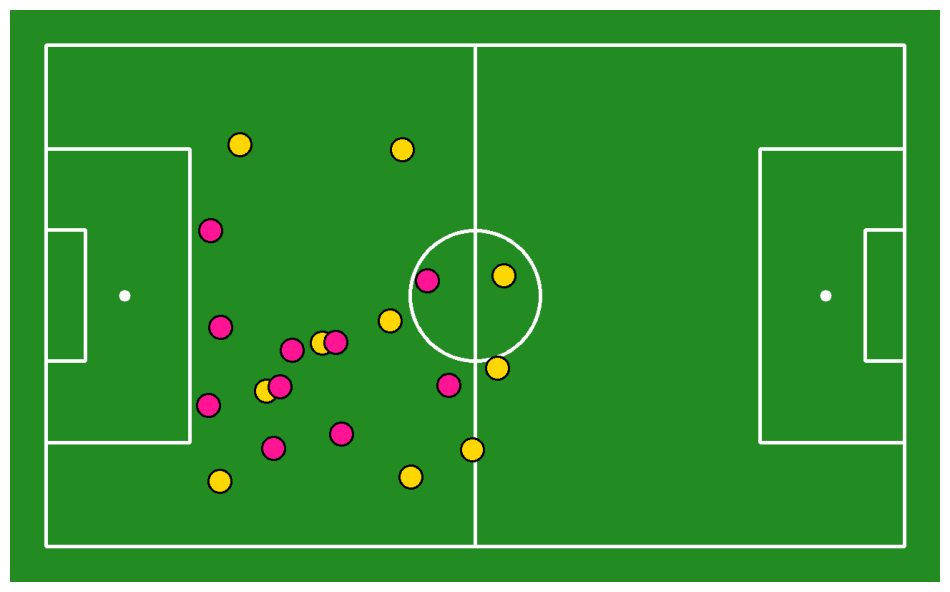

Embedding extraction: 1it [00:01,  1.53s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.53s/it]


Frame 330:
Left half - Yellow Team: 8 players, Red Team: 10 players
Right half - Yellow Team: 2 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



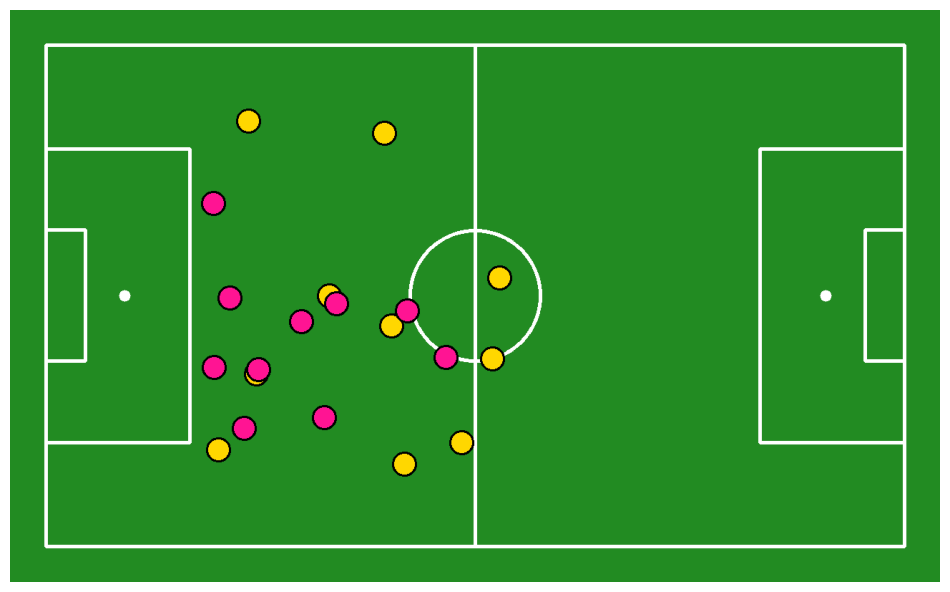

Embedding extraction: 1it [00:01,  1.24s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.24s/it]


Frame 360:
Left half - Yellow Team: 7 players, Red Team: 9 players
Right half - Yellow Team: 2 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



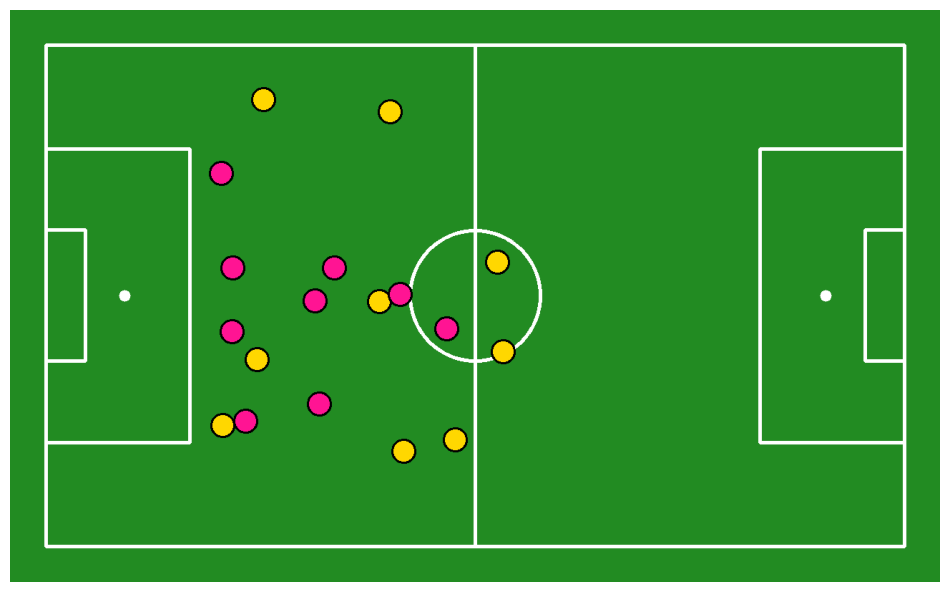

Embedding extraction: 1it [00:01,  1.31s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.32s/it]


Frame 390:
Left half - Yellow Team: 7 players, Red Team: 10 players
Right half - Yellow Team: 2 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



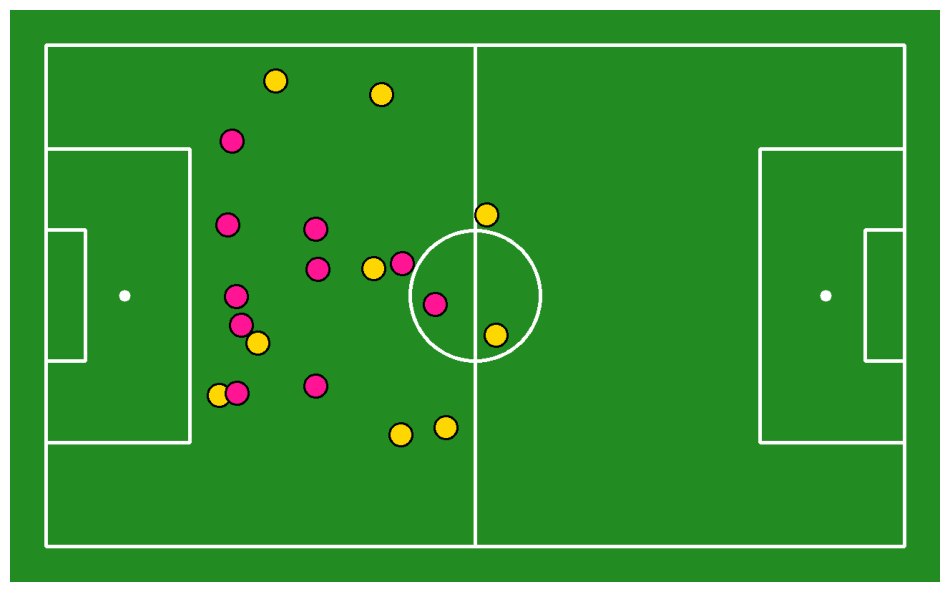

Embedding extraction: 1it [00:01,  1.41s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.44s/it]


Frame 420:
Left half - Yellow Team: 8 players, Red Team: 10 players
Right half - Yellow Team: 2 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



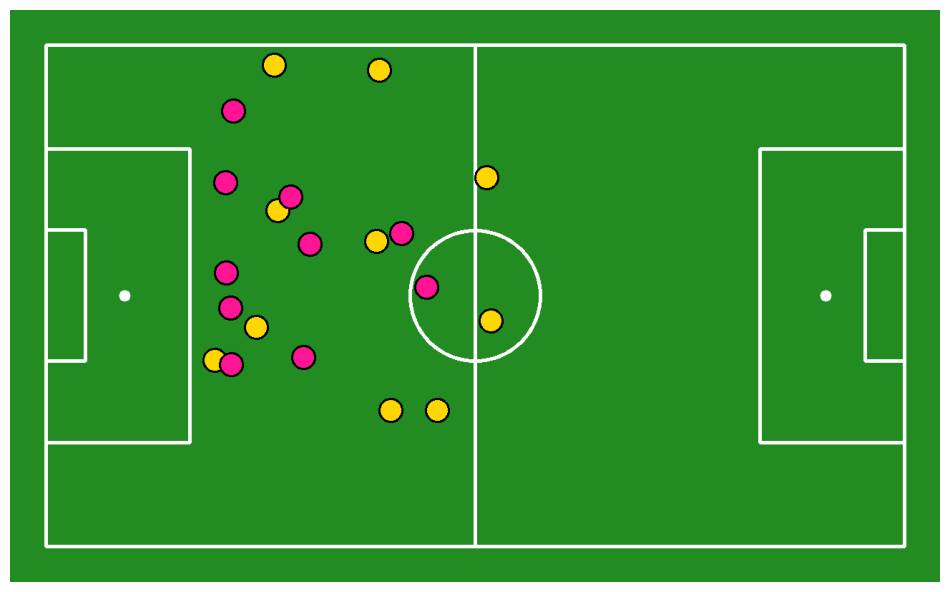

Embedding extraction: 1it [00:01,  1.30s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.27s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 450:
Left half - Yellow Team: 7 players, Red Team: 10 players
Right half - Yellow Team: 2 players, Red Team: 0 players


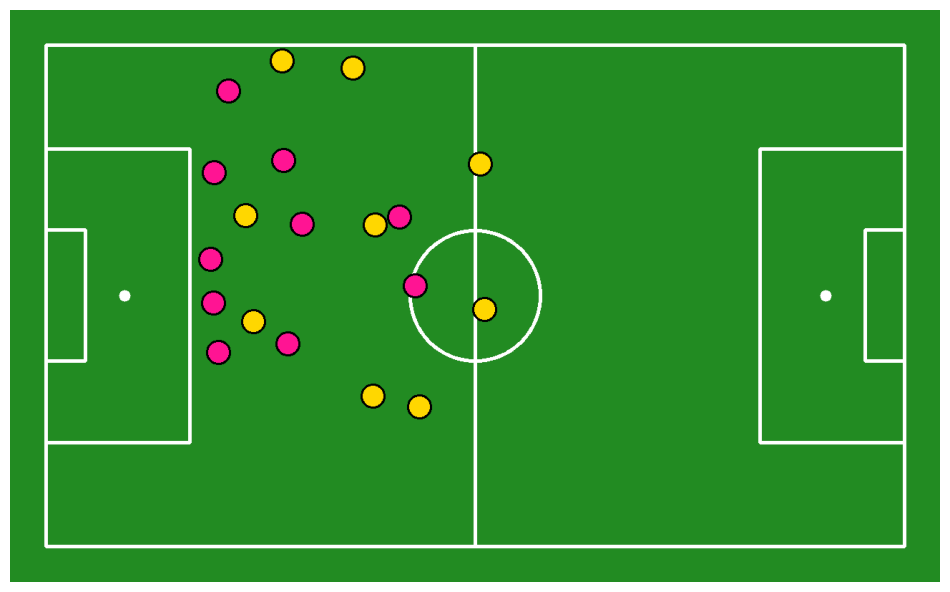

Embedding extraction: 1it [00:01,  1.32s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.35s/it]


Frame 480:
Left half - Yellow Team: 9 players, Red Team: 10 players
Right half - Yellow Team: 1 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



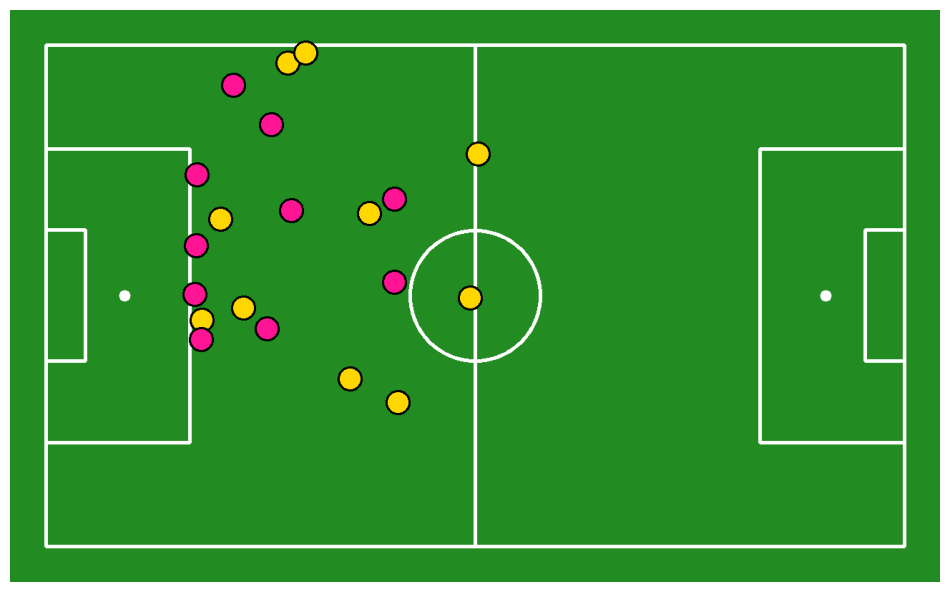

Embedding extraction: 1it [00:01,  1.19s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.20s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 510:
Left half - Yellow Team: 9 players, Red Team: 9 players
Right half - Yellow Team: 0 players, Red Team: 0 players


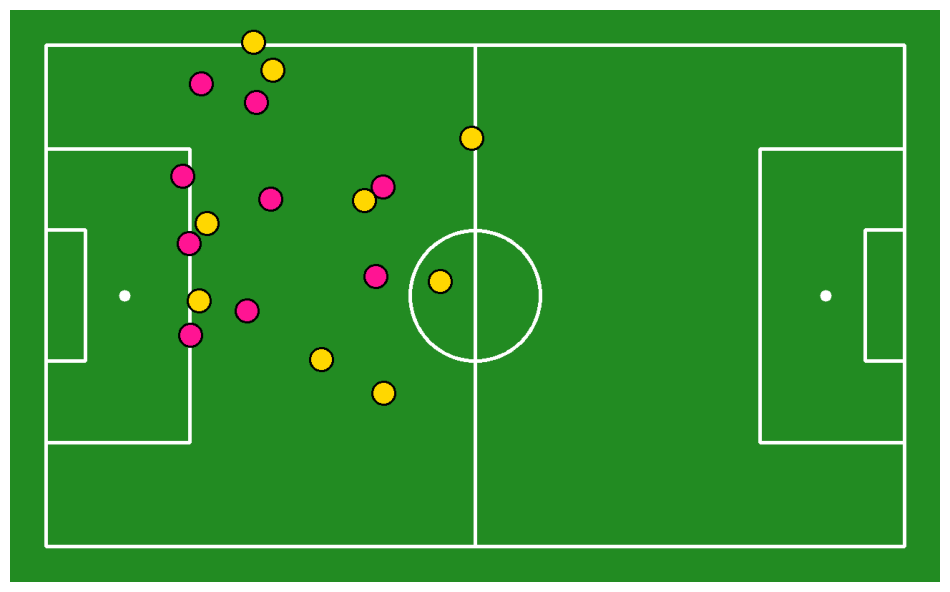

Embedding extraction: 1it [00:01,  1.26s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.25s/it]


Frame 540:
Left half - Yellow Team: 9 players, Red Team: 10 players
Right half - Yellow Team: 0 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



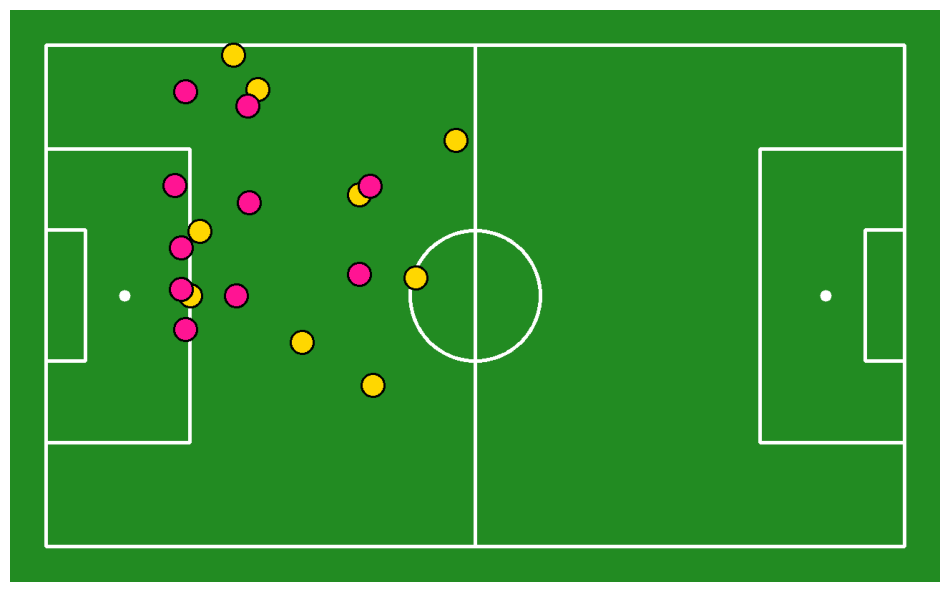

Embedding extraction: 1it [00:01,  1.16s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.20s/it]


Frame 570:
Left half - Yellow Team: 8 players, Red Team: 10 players
Right half - Yellow Team: 0 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



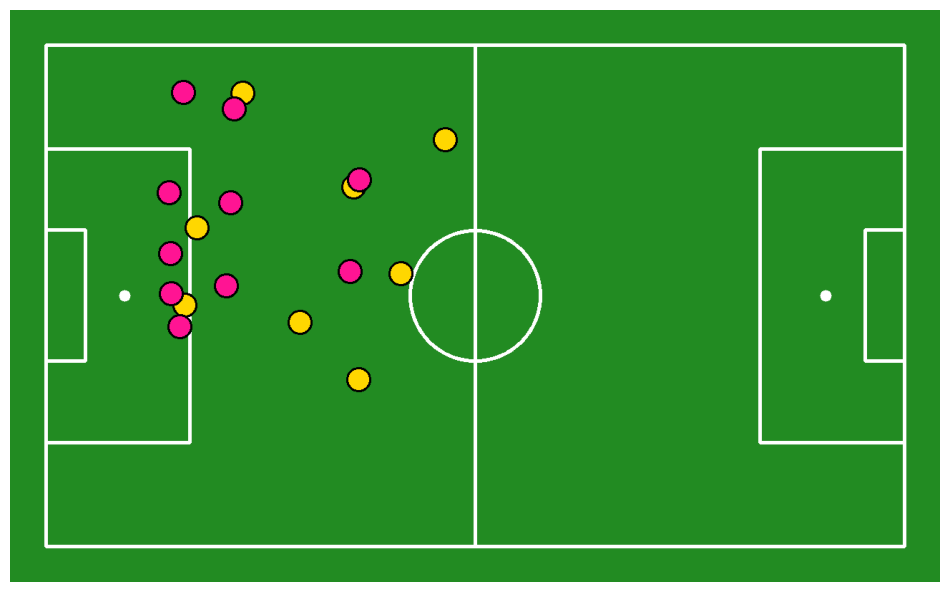

Embedding extraction: 1it [00:01,  1.32s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.30s/it]


Frame 600:
Left half - Yellow Team: 10 players, Red Team: 10 players
Right half - Yellow Team: 0 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



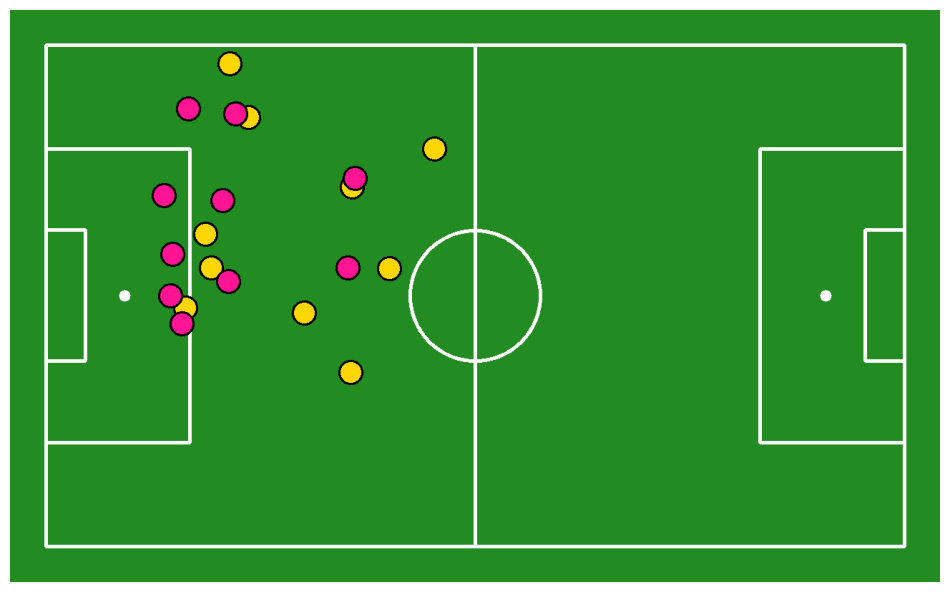

Embedding extraction: 1it [00:01,  1.23s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.26s/it]


Frame 630:
Left half - Yellow Team: 10 players, Red Team: 9 players
Right half - Yellow Team: 0 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



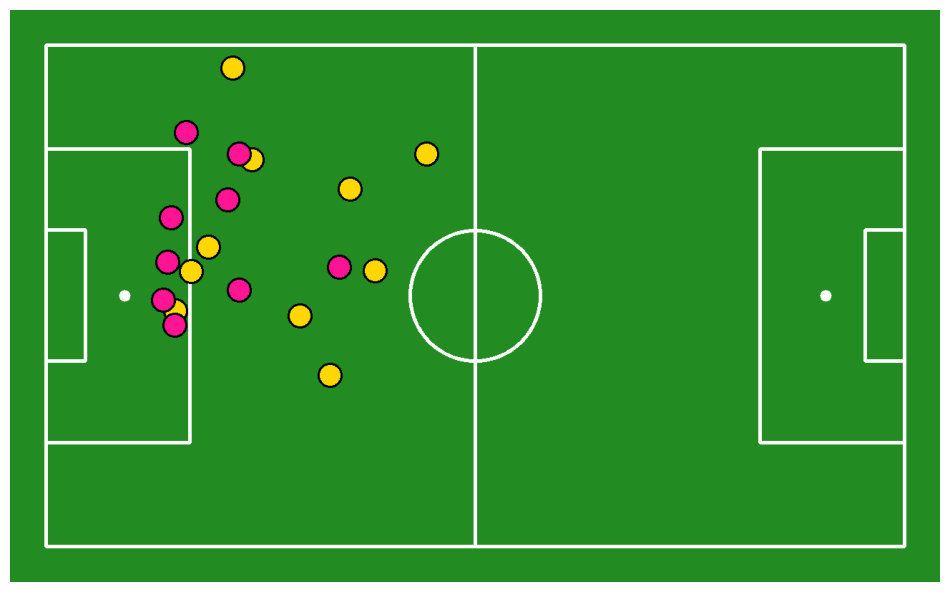

Embedding extraction: 1it [00:01,  1.21s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.23s/it]


Frame 660:
Left half - Yellow Team: 10 players, Red Team: 8 players
Right half - Yellow Team: 0 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



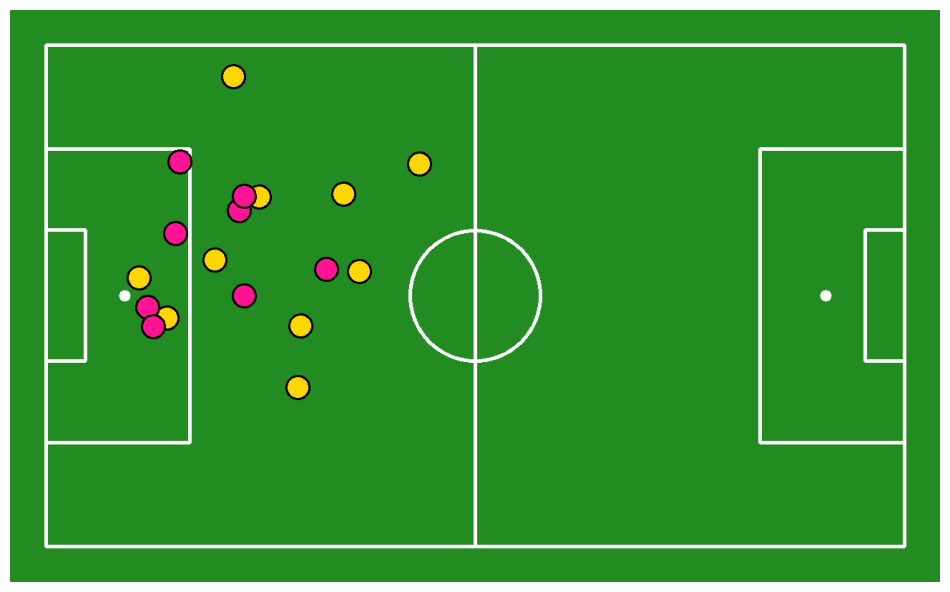

Embedding extraction: 1it [00:01,  1.22s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.24s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Frame 690:
Left half - Yellow Team: 8 players, Red Team: 10 players
Right half - Yellow Team: 0 players, Red Team: 0 players


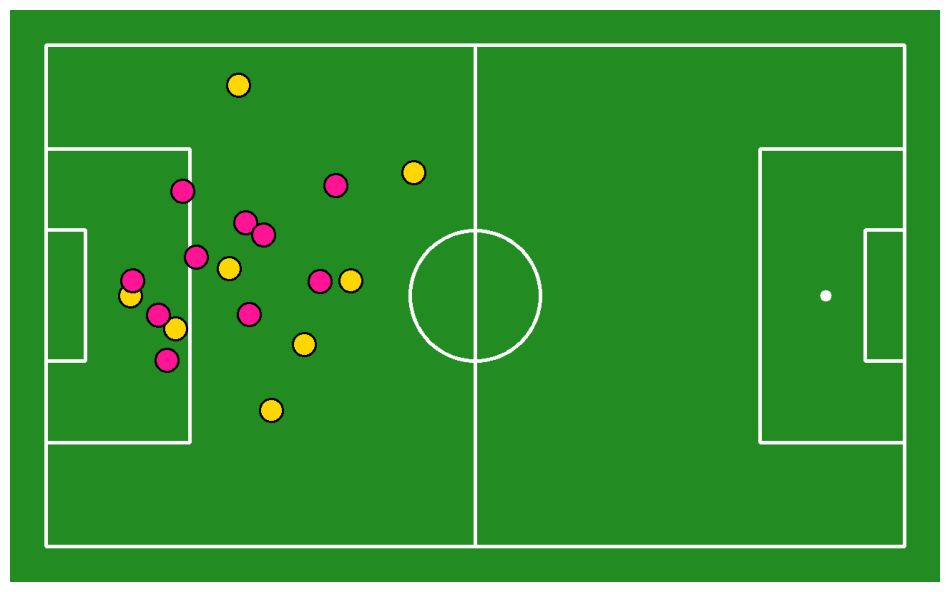

Embedding extraction: 1it [00:01,  1.13s/it]it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.12s/it]


Frame 720:
Left half - Yellow Team: 8 players, Red Team: 9 players
Right half - Yellow Team: 0 players, Red Team: 0 players



/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



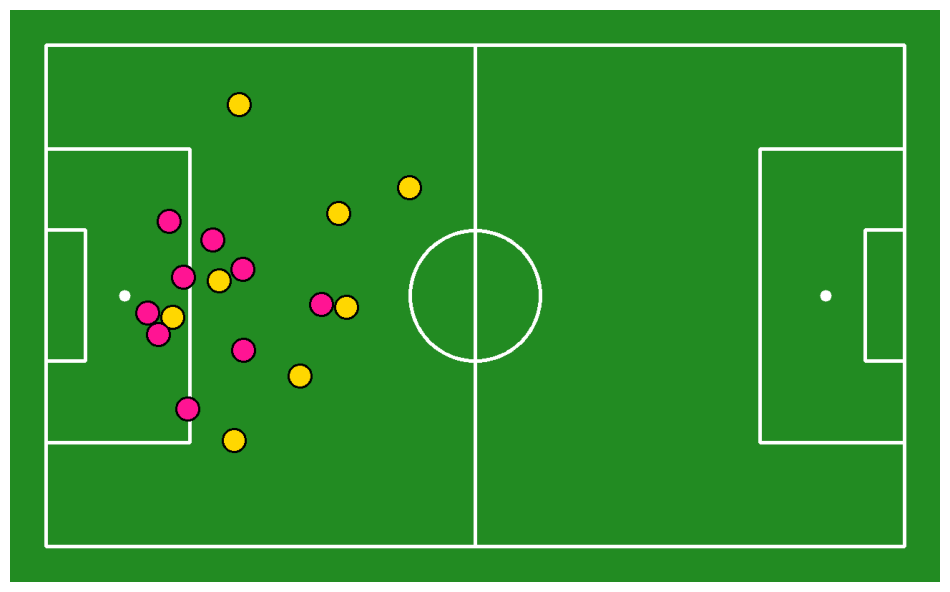

100%|██████████| 25/25 [01:32<00:00,  3.68s/it]



Team Sides Analysis Results:
Left Goal belongs to: Red Team
Right Goal belongs to: Yellow Team

Left half average players:
Yellow Team: 7.2
Red Team: 9.0

Right half average players:
Yellow Team: 2.3
Red Team: 0.7

Analyzed Frames: 25


('Red Team', 'Yellow Team')

In [126]:
def detect_team_sides(video_path, stride=30, debug=True):
    """Takımların hangi kaleyi savunduğunu tespit et"""
    print("\nStarting team sides analysis...")
    
    print("\nDetecting team colors...")
    team1_name, team2_name, team1_color, team2_color = detect_team_colors(video_path)
    print(f"Detected teams: {team1_name} vs {team2_name}")
    
    print("\nTraining team classifier...")
    team_classifier = train_team_classifier(video_path, stride=30)
    
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Yarı saha sayaçları
    left_half_counts = {'team1': 0, 'team2': 0}
    right_half_counts = {'team1': 0, 'team2': 0}
    frames_analyzed = 0
    
    # Saha boyutlarını al
    pitch_vertices = np.array(CONFIG.vertices)
    min_x = np.min(pitch_vertices[:, 0])
    max_x = np.max(pitch_vertices[:, 0])
    mid_line = (min_x + max_x) / 2
    
    print("\nAnalyzing team positions...")
    
    for frame_idx in tqdm(range(0, total_frames, stride)):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if not ret:
            break
            
        team1_positions = get_team_positions(frame, 0, team_classifier)
        team2_positions = get_team_positions(frame, 1, team_classifier)
        
        if len(team1_positions) > 0 and len(team2_positions) > 0:
            result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
            key_points = sv.KeyPoints.from_inference(result)

            filter = key_points.confidence[0] > 0.5
            frame_reference_points = key_points.xy[0][filter]
            pitch_reference_points = np.array(CONFIG.vertices)[filter]

            transformer = ViewTransformer(
                source=frame_reference_points,
                target=pitch_reference_points
            )

            pitch_team1_xy = transformer.transform_points(points=team1_positions)
            pitch_team2_xy = transformer.transform_points(points=team2_positions)
            
            # Her yarı sahadaki oyuncu sayılarını hesapla
            team1_left = sum(1 for pos in pitch_team1_xy if pos[0] <= mid_line)
            team1_right = sum(1 for pos in pitch_team1_xy if pos[0] > mid_line)
            team2_left = sum(1 for pos in pitch_team2_xy if pos[0] <= mid_line)
            team2_right = sum(1 for pos in pitch_team2_xy if pos[0] > mid_line)
            
            left_half_counts['team1'] += team1_left
            left_half_counts['team2'] += team2_left
            right_half_counts['team1'] += team1_right
            right_half_counts['team2'] += team2_right
            
            frames_analyzed += 1
            
            # Saha haritasını çiz
            pitch_frame = draw_pitch(CONFIG)
            
            # Orta çizgiyi çiz
            pitch_frame = cv2.line(pitch_frame, 
                                 (int(mid_line), 0), 
                                 (int(mid_line), int(np.max(pitch_vertices[:, 1]))),
                                 (255,255,255), 2)
            
            # Takımları çiz
            pitch_frame = draw_points_on_pitch(
                config=CONFIG,
                xy=pitch_team1_xy,
                face_color=sv.Color.from_hex('FFD700'),  # Sarı
                edge_color=sv.Color.BLACK,
                radius=16,
                pitch=pitch_frame)
            
            pitch_frame = draw_points_on_pitch(
                config=CONFIG,
                xy=pitch_team2_xy,
                face_color=sv.Color.from_hex('FF1493'),  # Pembe/Kırmızı
                edge_color=sv.Color.BLACK,
                radius=16,
                pitch=pitch_frame)
            
            print(f"\nFrame {frame_idx}:")
            print(f"Left half - {team1_name}: {team1_left} players, {team2_name}: {team2_left} players")
            print(f"Right half - {team1_name}: {team1_right} players, {team2_name}: {team2_right} players")
            
            sv.plot_image(pitch_frame)
    
    cap.release()
    
    if frames_analyzed > 0:
        # Hangi takımın hangi kaleyi savunduğunu belirle
        left_dominant = 'team1' if left_half_counts['team1'] > left_half_counts['team2'] else 'team2'
        right_dominant = 'team1' if right_half_counts['team1'] > right_half_counts['team2'] else 'team2'
        
        left_team_name = team1_name if left_dominant == 'team1' else team2_name
        right_team_name = team1_name if right_dominant == 'team1' else team2_name
        
        print(f"\nTeam Sides Analysis Results:")
        print(f"Left Goal belongs to: {left_team_name}")
        print(f"Right Goal belongs to: {right_team_name}")
        print(f"\nLeft half average players:")
        print(f"{team1_name}: {left_half_counts['team1']/frames_analyzed:.1f}")
        print(f"{team2_name}: {left_half_counts['team2']/frames_analyzed:.1f}")
        print(f"\nRight half average players:")
        print(f"{team1_name}: {right_half_counts['team1']/frames_analyzed:.1f}")
        print(f"{team2_name}: {right_half_counts['team2']/frames_analyzed:.1f}")
        print(f"\nAnalyzed Frames: {frames_analyzed}")
        
        return left_team_name, right_team_name
    else:
        print("\nNo valid frames for analysis")
        return None, None
# Analizi çalıştır
video_path = "YOUR VIDEO PATH"
detect_team_sides(video_path, stride=30)

# Penalty Area Encounter Analysis

This section analyzes how often each team enters the opponent's penalty area with the ball. The analysis provides valuable insights into attacking patterns and offensive effectiveness.

## Visualization Details

The analysis will:

1. **Track Ball Position**
   - Visualize the ball's location on the pitch using red markers
   - Highlight when the ball enters either penalty area

2. **Player Tracking** 
   - Show player positions with team-colored dots
   - Track which team has possession in penalty areas

3. **Penalty Area Zones**
   - Left penalty area: x(0-165), y(180-420)
   - Right penalty area: x(835-1000), y(180-420)
   - Highlighted in semi-transparent overlay

## Analysis Metrics

The code will calculate and display:

- Number of penalty area entries per team
- Time spent in opponent's penalty area
- Heat maps showing most common entry points
- Possession percentage in dangerous areas

This data helps evaluate attacking efficiency and identify tactical patterns in the final third of the pitch.

## Expected Output

The visualization will include:
- Annotated pitch diagram
- Team-specific encounter counts
- Frame-by-frame analysis
- Summary statistics and charts

This comprehensive analysis provides coaches and analysts with actionable insights into attacking performance.


In [127]:
def analyze_rcs_encounters(video_path, stride=30):
    """Opponent Penalty Area ball encounter analysis"""
    print("\nStarting OPA encounter analysis...")
    
    # Detect team colors
    team1_name, team2_name, team1_color, team2_color = detect_team_colors(video_path)
    print(f"\nDetected teams: {team1_name} vs {team2_name}")
    
    # Train team classifier
    team_classifier = train_team_classifier(video_path, stride=30)
    
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # OPA encounter counters
    team1_rcs_count = 0
    team2_rcs_count = 0
    
    # Define penalty areas
    left_penalty_area = {
        'x_min': 0,
        'x_max': 165,
        'y_min': 180,
        'y_max': 420
    }
    
    right_penalty_area = {
        'x_min': 835,
        'x_max': 1000,
        'y_min': 180,
        'y_max': 420
    }
    
    for frame_idx in tqdm(range(0, total_frames, stride)):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if not ret:
            break
            
        # Get ball and player positions
        ball_pos = get_ball_position(frame)
        team1_positions = get_team_positions(frame, 0, team_classifier)
        team2_positions = get_team_positions(frame, 1, team_classifier)
        
        if ball_pos is not None and len(team1_positions) > 0 and len(team2_positions) > 0:
            # Convert to pitch coordinates
            result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
            key_points = sv.KeyPoints.from_inference(result)
            
            filter = key_points.confidence[0] > 0.5
            frame_reference_points = key_points.xy[0][filter]
            pitch_reference_points = np.array(CONFIG.vertices)[filter]
            
            transformer = ViewTransformer(
                source=frame_reference_points,
                target=pitch_reference_points
            )
            
            pitch_ball_xy = transformer.transform_points(points=np.array([ball_pos]))[0]
            pitch_team1_xy = transformer.transform_points(points=team1_positions)
            pitch_team2_xy = transformer.transform_points(points=team2_positions)
            
            ball_x, ball_y = pitch_ball_xy
            
            # Check if the ball is in either penalty area
            in_left_penalty = (left_penalty_area['x_min'] <= ball_x <= left_penalty_area['x_max'] and 
                             left_penalty_area['y_min'] <= ball_y <= left_penalty_area['y_max'])
            
            in_right_penalty = (right_penalty_area['x_min'] <= ball_x <= right_penalty_area['x_max'] and 
                              right_penalty_area['y_min'] <= ball_y <= right_penalty_area['y_max'])
            
            if in_left_penalty or in_right_penalty:
                # Find the closest player to the ball
                team1_distances = [np.linalg.norm(pos - pitch_ball_xy) for pos in pitch_team1_xy]
                team2_distances = [np.linalg.norm(pos - pitch_ball_xy) for pos in pitch_team2_xy]
                
                min_dist_team1 = min(team1_distances) if team1_distances else float('inf')
                min_dist_team2 = min(team2_distances) if team2_distances else float('inf')
                
                closest_team = 1 if min_dist_team1 < min_dist_team2 else 2
                min_distance = min(min_dist_team1, min_dist_team2)
                
                # In left penalty area
                if in_left_penalty:
                    attacking_team = 2  # Right side is attacking
                    if closest_team == attacking_team and min_distance < 100:
                        team2_rcs_count += 1
                
                # In right penalty area
                elif in_right_penalty:
                    attacking_team = 1  # Left side is attacking
                    if closest_team == attacking_team and min_distance < 100:
                        team1_rcs_count += 1
    
    cap.release()
    
    print("\nRCS Encounter Analysis Results:")
    print(f"{team1_name}: {team1_rcs_count}")
    print(f"{team2_name}: {team2_rcs_count}")

# Run the analysis
video_path = "YOUR VIDEO PATH"
analyze_rcs_encounters(video_path, stride=30)


Starting OPA encounter analysis...

Detected teams: Yellow Team vs Red Team


Total player images collected: 478


Embedding extraction: 15it [00:29,  1.95s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.15s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.15s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.21s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/u


RCS Encounter Analysis Results:
Yellow Team: 0
Red Team: 0


# Attack Zone Analysis 🎯

This section analyzes how teams utilize different zones of the pitch during their attacks. The analysis provides insights into:

## Key Features
- **Zone Division**: The pitch is divided into 3 equal vertical zones (left, center, right)
- **Team Tracking**: Tracks player positions and ball possession for both teams
- **Possession Analysis**: Monitors which team controls the ball in each zone
- **Attack Pattern Recognition**: Identifies preferred attack routes and zones

## Visualization
The results will show:
- Heat maps of team positioning
- Zone-specific possession statistics
- Attack direction preferences
- Team movement patterns

This analysis helps understand team tactics and identify strategic patterns in their attacking play.


In [128]:
def analyze_attack_zones(video_path, stride=30):
    """Team attack zone analysis"""
    print("\nStarting attack zone analysis...")
    
    print("\nDetecting team colors...")
    team1_name, team2_name, team1_color, team2_color = detect_team_colors(video_path)
    print(f"Detected teams: {team1_name} vs {team2_name}")
    
    print("\nTraining team classifier...")
    team_classifier = train_team_classifier(video_path, stride=30)
    
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Get pitch dimensions
    pitch_vertices = np.array(CONFIG.vertices)
    pitch_length = np.max(pitch_vertices[:, 0]) - np.min(pitch_vertices[:, 0])
    zone_length = pitch_length / 3
    min_x = np.min(pitch_vertices[:, 0])
    
    # Attack zone counters
    team1_zones = {'left': 0, 'center': 0, 'right': 0}  # Left defending team
    team2_zones = {'left': 0, 'center': 0, 'right': 0}  # Right defending team
    frames_analyzed = 0
    
    # Ball possession tracking
    current_possession_owner = None
    challenger_buffer = []
    possession_threshold = 3
    
    print("\nAnalyzing attack zones...")
    
    for frame_idx in tqdm(range(0, total_frames, stride)):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if not ret:
            break
            
        # Get ball and player positions
        ball_pos = get_ball_position(frame)
        team1_positions = get_team_positions(frame, 0, team_classifier)
        team2_positions = get_team_positions(frame, 1, team_classifier)
        
        if ball_pos is not None and len(team1_positions) > 0 and len(team2_positions) > 0:
            # Convert to pitch coordinates
            result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
            key_points = sv.KeyPoints.from_inference(result)
            
            filter = key_points.confidence[0] > 0.5
            frame_reference_points = key_points.xy[0][filter]
            pitch_reference_points = np.array(CONFIG.vertices)[filter]
            
            transformer = ViewTransformer(
                source=frame_reference_points,
                target=pitch_reference_points
            )
            
            pitch_ball_xy = transformer.transform_points(points=np.array([ball_pos]))[0]
            pitch_team1_xy = transformer.transform_points(points=team1_positions)
            pitch_team2_xy = transformer.transform_points(points=team2_positions)
            
            # Find the closest team to the ball
            team1_distances = [np.linalg.norm(pos - pitch_ball_xy) for pos in pitch_team1_xy]
            team2_distances = [np.linalg.norm(pos - pitch_ball_xy) for pos in pitch_team2_xy]
            
            min_dist_team1 = min(team1_distances) if team1_distances else float('inf')
            min_dist_team2 = min(team2_distances) if team2_distances else float('inf')
            
            current_closer_team = 1 if min_dist_team1 < min_dist_team2 else 2
            
            # Update ball possession
            if current_possession_owner is None:
                current_possession_owner = current_closer_team
                challenger_buffer = []
            
            if current_closer_team != current_possession_owner:
                challenger_buffer.append(current_closer_team)
                if len(challenger_buffer) > possession_threshold:
                    challenger_buffer.pop(0)
            else:
                challenger_buffer = []
            
            if len(challenger_buffer) == possession_threshold:
                if all(x == challenger_buffer[0] for x in challenger_buffer):
                    current_possession_owner = challenger_buffer[0]
                    challenger_buffer = []
            
            # Determine which zone the ball is in based on its x coordinate
            ball_x = pitch_ball_xy[0]
            
            if current_possession_owner is not None:
                # Determine the zone (based on attack direction)
                if current_possession_owner == 1:  # Left defending team (attacking right)
                    if ball_x < (min_x + zone_length):
                        team1_zones['left'] += 1
                    elif ball_x < (min_x + 2 * zone_length):
                        team1_zones['center'] += 1
                    else:
                        team1_zones['right'] += 1
                else:  # Right defending team (attacking left)
                    if ball_x < (min_x + zone_length):
                        team2_zones['right'] += 1
                    elif ball_x < (min_x + 2 * zone_length):
                        team2_zones['center'] += 1
                    else:
                        team2_zones['left'] += 1
            
            frames_analyzed += 1
    
    cap.release()
    
    # Calculate percentages
    if frames_analyzed > 0:
        team1_total = sum(team1_zones.values())
        team2_total = sum(team2_zones.values())
        
        team1_percentages = {'left': 0, 'center': 0, 'right': 0}
        team2_percentages = {'left': 0, 'center': 0, 'right': 0}
        
        if team1_total > 0:
            team1_percentages = {
                'left': (team1_zones['left'] / team1_total) * 100,
                'center': (team1_zones['center'] / team1_total) * 100,
                'right': (team1_zones['right'] / team1_total) * 100
            }
        
        if team2_total > 0:
            team2_percentages = {
                'left': (team2_zones['left'] / team2_total) * 100,
                'center': (team2_zones['center'] / team2_total) * 100,
                'right': (team2_zones['right'] / team2_total) * 100
            }
        
        print("\nAttack Zone Analysis Results:")
        print(f"\n{team1_name}:")
        print(f"Left Wing: {team1_percentages['left']:.1f}%")
        print(f"Center: {team1_percentages['center']:.1f}%")
        print(f"Right Wing: {team1_percentages['right']:.1f}%")
        
        print(f"\n{team2_name}:")
        print(f"Left Wing: {team2_percentages['left']:.1f}%")
        print(f"Center: {team2_percentages['center']:.1f}%")
        print(f"Right Wing: {team2_percentages['right']:.1f}%")
    else:
        print("\nNo valid frames for analysis")

# Fixed variables
BALL_ID = 0
PLAYER_ID = 2

# Run the analysis
video_path = "YOUR VIDEO PATH"
analyze_attack_zones(video_path, stride=30)


Starting attack zone analysis...

Detecting team colors...
Detected teams: Yellow Team vs Red Team

Training team classifier...


Total player images collected: 478


Embedding extraction: 15it [00:29,  1.98s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.




Analyzing attack zones...


Embedding extraction: 1it [00:01,  1.15s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.19s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.23s/it]t]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

Embedding extraction: 1it [00:01,  1.26s/it]
/Users/unalbuyukkoroglu/Desktop/football-analysis-project/futbol_env/lib/python3.9/site-packages/sklearn/ut


Attack Zone Analysis Results:

Yellow Team:
Left Wing: 35.3%
Center: 64.7%
Right Wing: 0.0%

Red Team:
Left Wing: 0.0%
Center: 0.0%
Right Wing: 0.0%


# Enhanced Possession Statistics Visualization

This cell contains a function that creates a sophisticated visual representation of ball possession statistics between two teams on a football pitch diagram.

## Key Features:
- **Custom Pitch Layout**: Draws a professional football pitch with precise dimensions and markings
- **Dynamic Possession Bars**: Visualizes possession percentages using color-coded horizontal bars
- **Team Identification**: 
  - Red Team (shown in red)
  - Yellow Team (shown in yellow)
- **Visual Elements**:
  - High contrast white background
  - Clear black pitch lines
  - Bold typography for team names and statistics
  - Proportional possession bars reflecting exact percentages

## Function Details:
The `visualize_possession_stats_enhanced()` function takes the following parameters:
- Team names (customizable)
- Possession percentages for each team
- Configurable visual parameters (colors, fonts, dimensions)

The visualization provides an immediate, intuitive understanding of ball possession distribution between the two teams during the analyzed match period.


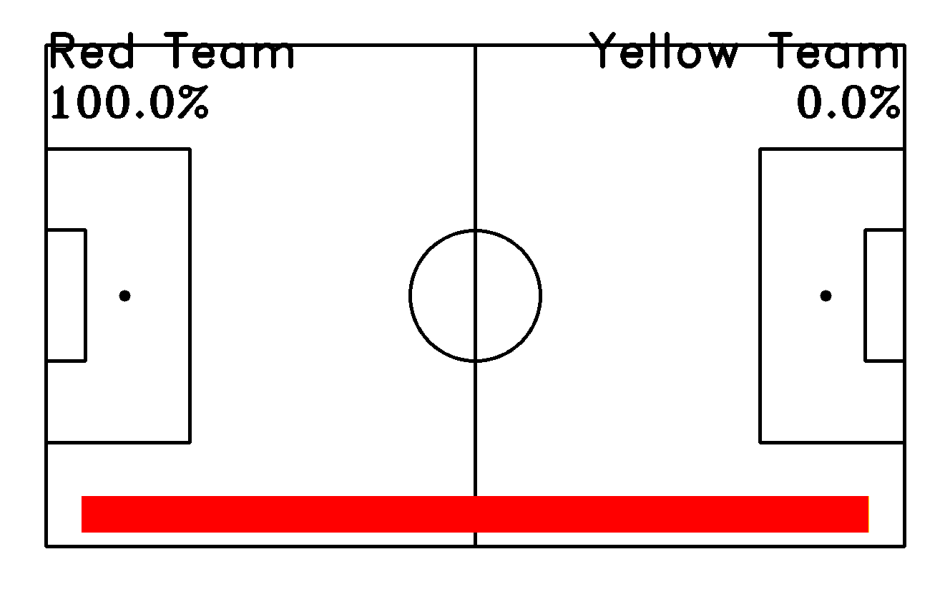

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [132]:
def visualize_possession_stats_enhanced(team1_name="Red Team", team1_possession=100.0,
                                      team2_name="Yellow Team", team2_possession=0.0):
    """
    Create an enhanced visualization of possession statistics on a pitch diagram
    with possession bars and improved typography
    """
    # Draw the base pitch with white background
    pitch_frame = draw_pitch(
        config=CONFIG,
        background_color=sv.Color.WHITE,
        line_color=sv.Color.BLACK
    )
    
    # Define colors
    RED_COLOR = (0, 0, 255)      # BGR format for red
    YELLOW_COLOR = (0, 255, 255)  # BGR format for yellow
    BLACK_COLOR = (0, 0, 0)       # BGR format for black
    
    # Font settings - increased sizes
    title_font = cv2.FONT_HERSHEY_DUPLEX
    stats_font = cv2.FONT_HERSHEY_TRIPLEX  # Changed to TRIPLEX for better look
    title_scale = 2.2  # Increased from 1.8
    stats_scale = 2.0  # Increased from 1.5
    thickness = 3      # Increased from 2
    
    # Get pitch dimensions
    height, width = pitch_frame.shape[:2]
    
    # Draw possession bars
    bar_height = 50   # Increased height
    bar_y = height - 120
    total_bar_width = width - 200
    
    # Team 1 bar (left)
    team1_width = int((total_bar_width * team1_possession) / 100)
    cv2.rectangle(pitch_frame, (100, bar_y), (100 + team1_width, bar_y + bar_height), 
                 RED_COLOR, -1)
    
    # Team 2 bar (right)
    team2_width = total_bar_width - team1_width
    cv2.rectangle(pitch_frame, (100 + team1_width, bar_y), 
                 (100 + team1_width + team2_width, bar_y + bar_height),
                 YELLOW_COLOR, -1)
    
    # Add team names
    cv2.putText(pitch_frame, team1_name, (50, 80), 
                title_font, title_scale, BLACK_COLOR, thickness)
    
    # Right align team 2 name
    team2_text_size = cv2.getTextSize(team2_name, title_font, title_scale, thickness)[0]
    team2_x = width - team2_text_size[0] - 50
    cv2.putText(pitch_frame, team2_name, (team2_x, 80),
                title_font, title_scale, BLACK_COLOR, thickness)
    
    # Add possession percentages
    cv2.putText(pitch_frame, f"{team1_possession:.1f}%", (50, 150),
                stats_font, stats_scale, BLACK_COLOR, thickness)
    
    stats2_text = f"{team2_possession:.1f}%"
    stats2_text_size = cv2.getTextSize(stats2_text, stats_font, stats_scale, thickness)[0]
    stats2_x = width - stats2_text_size[0] - 50
    cv2.putText(pitch_frame, stats2_text, (stats2_x, 150),
                stats_font, stats_scale, BLACK_COLOR, thickness)
    
    # Display the visualization
    sv.plot_image(pitch_frame)
    
    return pitch_frame

# Use the actual analysis results
visualize_possession_stats_enhanced()

# Ball Zone Analysis Visualization

This code cell implements a comprehensive visualization function to analyze and display the distribution of ball possession across different zones of the football pitch.

## Key Features:
- Divides the pitch into 3 distinct zones (left, middle, right)
- Visualizes zone percentages with a clean, professional design
- Uses semi-transparent overlays to highlight different zones
- Includes clear labeling and statistics

## Technical Details:
- Creates a base pitch visualization using OpenCV
- Implements custom fonts and styling for text elements
- Uses weighted overlay techniques for zone highlighting
- Maintains proper aspect ratios and proportions

## Visual Elements:
- Title text using TRIPLEX font
- Zone divider lines
- Percentage indicators for each zone
- Light gray zone backgrounds for better visibility

The visualization provides an intuitive way to understand ball movement patterns and team tactical preferences during the match.


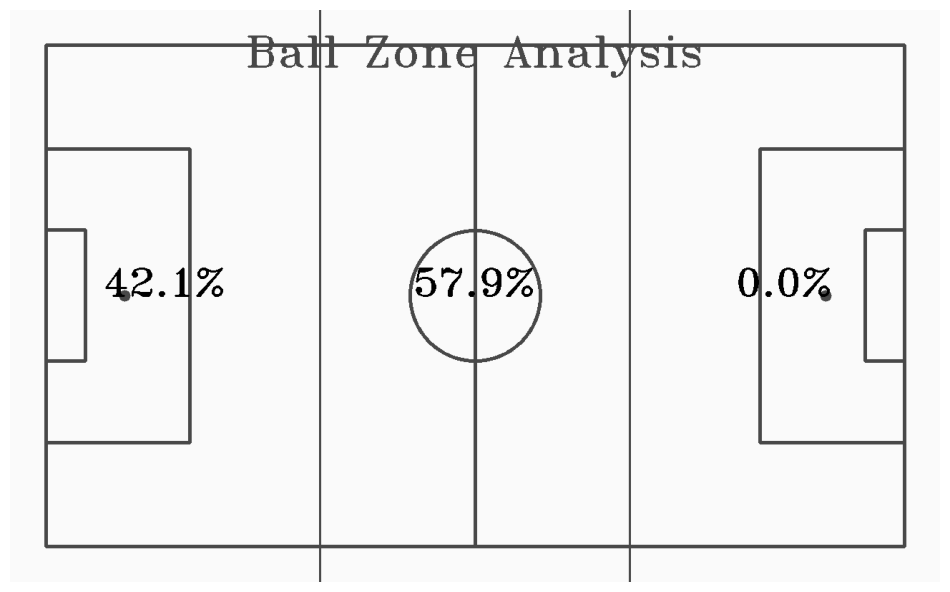

array([[[250, 250, 250],
        [250, 250, 250],
        [250, 250, 250],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [250, 250, 250]],

       [[250, 250, 250],
        [250, 250, 250],
        [250, 250, 250],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [250, 250, 250]],

       [[250, 250, 250],
        [250, 250, 250],
        [250, 250, 250],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [250, 250, 250]],

       ...,

       [[250, 250, 250],
        [250, 250, 250],
        [250, 250, 250],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [250, 250, 250]],

       [[250, 250, 250],
        [250, 250, 250],
        [250, 250, 250],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [250, 250, 250]],

       [[250, 250, 250],
        [250, 250, 250],
        [250, 250, 250],
        ...,
        [250, 250, 250],
        [250, 250, 250],
        [250, 250, 250]]

In [133]:
def visualize_zone_analysis(left_zone=42.1, middle_zone=57.9, right_zone=0.0):
    """
    Create a visualization of ball zone analysis with the pitch divided into three zones
    """
    # Draw the base pitch with white background
    pitch_frame = draw_pitch(
        config=CONFIG,
        background_color=sv.Color.WHITE,
        line_color=sv.Color.BLACK
    )
    
    # Get pitch dimensions
    height, width = pitch_frame.shape[:2]
    zone_width = width // 3
    
    # Define colors
    BLACK_COLOR = (0, 0, 0)       # BGR format for black
    ZONE_COLOR = (240, 240, 240)  # Light gray for zone background
    
    # Font settings
    title_font = cv2.FONT_HERSHEY_TRIPLEX
    stats_font = cv2.FONT_HERSHEY_TRIPLEX
    title_scale = 2.0
    stats_scale = 1.8
    thickness = 2
    
    # Draw title
    title = "Ball Zone Analysis"
    title_size = cv2.getTextSize(title, title_font, title_scale, thickness)[0]
    title_x = (width - title_size[0]) // 2
    cv2.putText(pitch_frame, title, (title_x, 80),
                title_font, title_scale, BLACK_COLOR, thickness)
    
    # Draw vertical lines to divide zones
    cv2.line(pitch_frame, (zone_width, 0), (zone_width, height), BLACK_COLOR, 2)
    cv2.line(pitch_frame, (2 * zone_width, 0), (2 * zone_width, height), BLACK_COLOR, 2)
    
    # Add semi-transparent zone backgrounds
    overlay = pitch_frame.copy()
    cv2.rectangle(overlay, (0, 0), (zone_width, height), ZONE_COLOR, -1)
    cv2.rectangle(overlay, (zone_width, 0), (2 * zone_width, height), ZONE_COLOR, -1)
    cv2.rectangle(overlay, (2 * zone_width, 0), (width, height), ZONE_COLOR, -1)
    cv2.addWeighted(overlay, 0.3, pitch_frame, 0.7, 0, pitch_frame)
    
    # Add zone percentages
    # Left zone
    left_text = f"{left_zone:.1f}%"
    left_size = cv2.getTextSize(left_text, stats_font, stats_scale, thickness)[0]
    left_x = (zone_width - left_size[0]) // 2
    cv2.putText(pitch_frame, left_text, (left_x, height//2),
                stats_font, stats_scale, BLACK_COLOR, thickness)
    
    # Middle zone
    middle_text = f"{middle_zone:.1f}%"
    middle_size = cv2.getTextSize(middle_text, stats_font, stats_scale, thickness)[0]
    middle_x = zone_width + (zone_width - middle_size[0]) // 2
    cv2.putText(pitch_frame, middle_text, (middle_x, height//2),
                stats_font, stats_scale, BLACK_COLOR, thickness)
    
    # Right zone
    right_text = f"{right_zone:.1f}%"
    right_size = cv2.getTextSize(right_text, stats_font, stats_scale, thickness)[0]
    right_x = 2 * zone_width + (zone_width - right_size[0]) // 2
    cv2.putText(pitch_frame, right_text, (right_x, height//2),
                stats_font, stats_scale, BLACK_COLOR, thickness)
    
    # Display the visualization
    sv.plot_image(pitch_frame)
    
    return pitch_frame

# Use the actual analysis results
visualize_zone_analysis()

# Team-Based Attack Zone Analysis 🎯

## Overview
This section visualizes and analyzes how each team distributes their attacks across different zones of the football pitch. The analysis provides insights into team tactics and preferred attacking patterns.

### Key Features
- **Horizontal Zone Division**: The pitch is divided into 3 horizontal zones
- **Team-Specific Analysis**: Separate visualizations for both teams (Red & Yellow)
- **Percentage Distribution**: Shows the percentage of attacks in each zone
- **Clear Visual Representation**: 
  - Semi-transparent zone coloring
  - Professional typography
  - Intuitive layout

### Technical Details
- Uses OpenCV for drawing and text rendering
- Custom pitch visualization with configurable parameters
- Zone percentages calculated from actual match data

### Interpretation Guide
- Higher percentages indicate more frequent attacks in that zone
- Helps identify:
  - Team's preferred attacking channels
  - Tactical asymmetries
  - Potential defensive vulnerabilities

---
*The following visualization demonstrates the attack zone distribution for both teams*


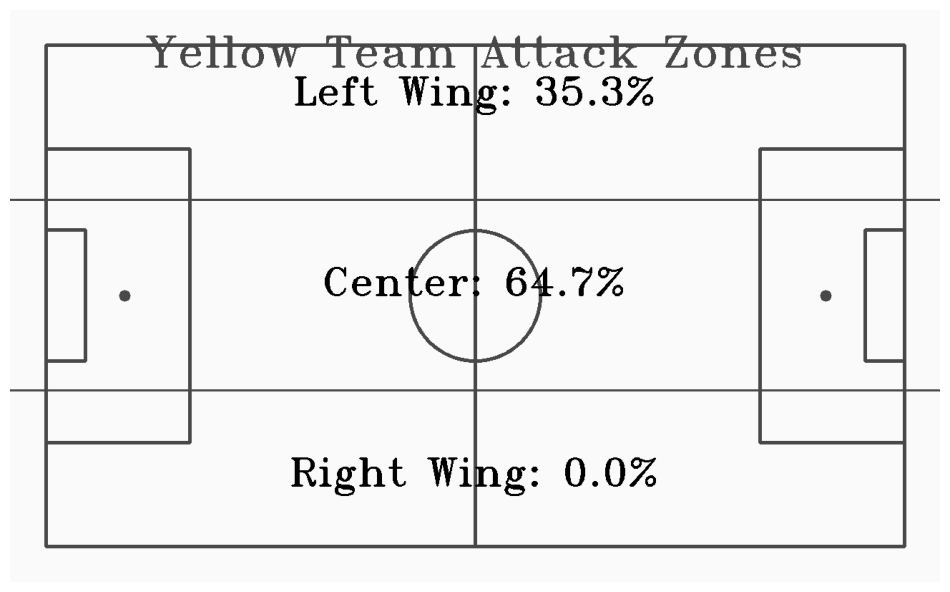

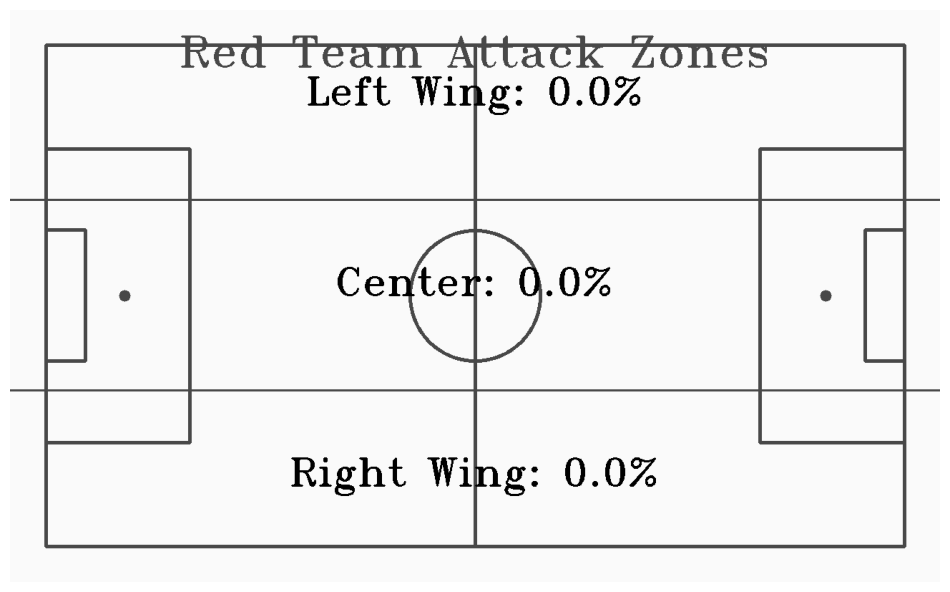

(array([[[250, 250, 250],
         [250, 250, 250],
         [250, 250, 250],
         ...,
         [250, 250, 250],
         [250, 250, 250],
         [250, 250, 250]],
 
        [[250, 250, 250],
         [250, 250, 250],
         [250, 250, 250],
         ...,
         [250, 250, 250],
         [250, 250, 250],
         [250, 250, 250]],
 
        [[250, 250, 250],
         [250, 250, 250],
         [250, 250, 250],
         ...,
         [250, 250, 250],
         [250, 250, 250],
         [250, 250, 250]],
 
        ...,
 
        [[250, 250, 250],
         [250, 250, 250],
         [250, 250, 250],
         ...,
         [250, 250, 250],
         [250, 250, 250],
         [250, 250, 250]],
 
        [[250, 250, 250],
         [250, 250, 250],
         [250, 250, 250],
         ...,
         [250, 250, 250],
         [250, 250, 250],
         [250, 250, 250]],
 
        [[250, 250, 250],
         [250, 250, 250],
         [250, 250, 250],
         ...,
         [250, 250, 250],
  

In [136]:
def visualize_attack_zones_per_team(yellow_zones=(35.3, 64.7, 0.0), red_zones=(0.0, 0.0, 0.0)):
    """
    Create visualizations of attack zones for both teams with horizontal zones
    
    Args:
        yellow_zones (tuple): (left, center, right) percentages for Yellow Team
        red_zones (tuple): (left, center, right) percentages for Red Team
    """
    def create_team_visualization(team_name, zones, background_color=(255,255,255)):
        # Draw the base pitch
        pitch_frame = draw_pitch(
            config=CONFIG,
            background_color=sv.Color.WHITE,
            line_color=sv.Color.BLACK
        )
        
        # Get pitch dimensions
        height, width = pitch_frame.shape[:2]
        zone_height = height // 3
        
        # Font settings
        title_font = cv2.FONT_HERSHEY_TRIPLEX
        stats_font = cv2.FONT_HERSHEY_TRIPLEX
        title_scale = 2.0
        stats_scale = 1.8
        thickness = 2
        
        # Colors
        BLACK_COLOR = (0, 0, 0)
        ZONE_COLOR = (240, 240, 240)
        
        # Draw title
        title = f"{team_name} Attack Zones"
        title_size = cv2.getTextSize(title, title_font, title_scale, thickness)[0]
        title_x = (width - title_size[0]) // 2
        cv2.putText(pitch_frame, title, (title_x, 80),
                    title_font, title_scale, BLACK_COLOR, thickness)
        
        # Draw horizontal zone dividers
        cv2.line(pitch_frame, (0, zone_height), (width, zone_height), BLACK_COLOR, 2)
        cv2.line(pitch_frame, (0, 2 * zone_height), (width, 2 * zone_height), BLACK_COLOR, 2)
        
        # Add semi-transparent zone backgrounds
        overlay = pitch_frame.copy()
        cv2.rectangle(overlay, (0, 0), (width, zone_height), ZONE_COLOR, -1)
        cv2.rectangle(overlay, (0, zone_height), (width, 2 * zone_height), ZONE_COLOR, -1)
        cv2.rectangle(overlay, (0, 2 * zone_height), (width, height), ZONE_COLOR, -1)
        cv2.addWeighted(overlay, 0.3, pitch_frame, 0.7, 0, pitch_frame)
        
        # Add zone labels and percentages
        labels = ["Left Wing", "Center", "Right Wing"]
        for i, (label, percentage) in enumerate(zip(labels, zones)):
            # Calculate center of zone
            zone_center_y = (i * zone_height) + (zone_height // 2)
            
            # Combine label and percentage
            text = f"{label}: {percentage:.1f}%"
            text_size = cv2.getTextSize(text, stats_font, stats_scale, thickness)[0]
            text_x = (width - text_size[0]) // 2
            
            # Add combined text
            cv2.putText(pitch_frame, text, (text_x, zone_center_y),
                        stats_font, stats_scale, BLACK_COLOR, thickness)
        
        return pitch_frame
    
    # Create visualizations for both teams
    yellow_viz = create_team_visualization("Yellow Team", yellow_zones)
    red_viz = create_team_visualization("Red Team", red_zones)
    
    # Display both visualizations
    sv.plot_image(yellow_viz)
    sv.plot_image(red_viz)
    
    return yellow_viz, red_viz

# Use the actual analysis results
visualize_attack_zones_per_team()